<a href="https://colab.research.google.com/github/ewst22ParkSY/ESAA11_PSY/blob/ESAA11_YB/YB_3%EC%A1%B0_%EB%B0%A9%ED%95%99%ED%94%84%EB%A1%9C%EC%A0%9D%ED%8A%B8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Data Engineenering

## 1.1 데이터 불러오기

In [ ]:
#import library

#for data handling
import pandas as pd
import numpy as np
import datetime as dt

#for visualization
import seaborn as sns
import matplotlib.pyplot as plt

#for timeseries data
  #for seasonal effect(acf, pacf)
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
  #for ARIMA
from statsmodels.tsa.arima_model import ARIMA
!pip install pmdarima
import pmdarima as pm

#for machine learning
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

#for calculating
from math import sqrt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 9.8 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#import origin data

data = pd.read_csv('/content/drive/MyDrive/방학프로젝트/train.csv', parse_dates=['date'])
data.head()

,id,date,country,store,product,num_sold
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0


In [ ]:
#add 'year' feature

data['year'] = data['date'].dt.year.astype(int)
data.head()

,id,date,country,store,product,num_sold,year
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN,2010
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010


In [ ]:
#import gdp data

gdp = pd.read_excel('/content/drive/MyDrive/방학프로젝트/additional_data.xlsx', sheet_name=0)
gdp.head()

,country,year,nominal gdp,nominal gdp per capita,growth rate
0,Canada,2010,1620000000000,47600,3.09
1,Canada,2011,1790000000000,52200,3.14
2,Canada,2012,1830000000000,52700,1.76
3,Canada,2013,1850000000000,52600,2.33
4,Canada,2014,1810000000000,51000,2.87


In [ ]:
#import holiday data

holiday = pd.read_excel('/content/drive/MyDrive/방학프로젝트/additional_data.xlsx', sheet_name=1).fillna(0)
holiday.head()

,country,date,weekend
0,Canada,2010-01-01,0.0
1,Canada,2010-04-02,0.0
2,Canada,2010-04-05,0.0
3,Canada,2010-05-24,0.0
4,Canada,2010-07-01,0.0


In [ ]:
#create df (data+gdp+holiday)

df = pd.merge(data, gdp, on=['country', 'year'], how='inner')
df.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN,2010,1620000000000,47600,3.09
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09


In [ ]:
holiday['holiday'] = 1

df = pd.merge(df, holiday[['country', 'date', 'holiday']], on=['country', 'date'], how='left')
df['holiday'] = df['holiday'].fillna(0).astype(int)

df.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate,holiday
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN,2010,1620000000000,47600,3.09,1
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09,1
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09,1
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09,1
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09,1


## 1.2 결측치 처리

In [ ]:
#num_sold에만 결측치 존재

df.isnull().sum()

,0
id,0
date,0
country,0
store,0
product,0
num_sold,8871
year,0
nominal gdp,0
nominal gdp per capita,0
growth rate,0


In [ ]:
#Canada와 Kenya에만 결측치 존재

df.groupby(['country'])['num_sold'].apply(lambda x: x.isnull().sum())

,num_sold
country,
Canada,4246
Finland,0
Italy,0
Kenya,4625
Norway,0
Singapore,0


In [ ]:
#일부 product에서만 결측치 존재

canada = df[df['country'] == 'Canada']

canada.groupby(['store', 'product'])['num_sold'].apply(lambda x: x.isnull().sum())

store                 product           
Discount Stickers     Holographic Goose     2557
                      Kaggle                   0
                      Kaggle Tiers             0
                      Kerneler                 1
                      Kerneler Dark Mode       0
Premium Sticker Mart  Holographic Goose      380
                      Kaggle                   0
                      Kaggle Tiers             0
                      Kerneler                 0
                      Kerneler Dark Mode       0
Stickers for Less     Holographic Goose     1308
                      Kaggle                   0
                      Kaggle Tiers             0
                      Kerneler                 0
                      Kerneler Dark Mode       0
Name: num_sold, dtype: int64

In [ ]:
kenya = df[df['country'] == 'Kenya']

kenya.groupby(['store', 'product'])['num_sold'].apply(lambda x: x.isnull().sum())

store                 product           
Discount Stickers     Holographic Goose     2557
                      Kaggle                   0
                      Kaggle Tiers             0
                      Kerneler                63
                      Kerneler Dark Mode       1
Premium Sticker Mart  Holographic Goose      646
                      Kaggle                   0
                      Kaggle Tiers             0
                      Kerneler                 0
                      Kerneler Dark Mode       0
Stickers for Less     Holographic Goose     1358
                      Kaggle                   0
                      Kaggle Tiers             0
                      Kerneler                 0
                      Kerneler Dark Mode       0
Name: num_sold, dtype: int64

In [ ]:
#nan_country, nan_store, nan_product
nan_country = ['Canada', 'Kenya']
nan_store = ['Discount Stickers', 'Premium Sticker Mart', 'Stickers for Less']
nan_product = ['Holographic Goose', 'Kerneler', 'Kerneler Dark Mode']

#보간법으로 결측치 처리
for country in nan_country:
    for store in nan_store:
        for product in nan_product:

            mask = (df['country'] == country) & (df['store'] == store) & (df['product'] == product)
            subset = df[mask]

            if subset['num_sold'].isnull().any():
                df.loc[mask, 'num_sold'] = subset['num_sold'].interpolate(method='linear')

df.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate,holiday
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN,2010,1620000000000,47600,3.09,1
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09,1
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09,1
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09,1
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09,1


In [ ]:
#Canada∩Discount Stickers∩Holographic Goose 경우에 num_sold 전체가 NaN

mask = df[df['country'] == 'Canada']
mask = mask[mask['store'] == 'Discount Stickers']
mask = mask[mask['product'] == 'Holographic Goose']

print(mask.shape, '\n')
print(mask.isnull().sum())

(2557, 11) 

id                           0
date                         0
country                      0
store                        0
product                      0
num_sold                  2557
year                         0
nominal gdp                  0
nominal gdp per capita       0
growth rate                  0
holiday                      0
dtype: int64


In [ ]:
#Kenya∩Discount Stickers∩Holographic Goose 경우에 num_sold 전체가 NaN

mask = df[df['country'] == 'Kenya']
mask = mask[mask['store'] == 'Discount Stickers']
mask = mask[mask['product'] == 'Holographic Goose']

print(mask.shape, '\n')
print(mask.isnull().sum())

(2557, 11) 

id                           0
date                         0
country                      0
store                        0
product                      0
num_sold                  2557
year                         0
nominal gdp                  0
nominal gdp per capita       0
growth rate                  0
holiday                      0
dtype: int64


In [ ]:
#이 경우, 판매가 이뤄지지 않는 것으로 보고 drop
df_cleaned = df[~((df['country'].isin(['Canada', 'Kenya'])) & (df['store'] == 'Discount Stickers') & (df['product'] == 'Holographic Goose'))]

df_cleaned.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate,holiday
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09,1
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09,1
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09,1
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09,1
5,5,2010-01-01,Canada,Stickers for Less,Holographic Goose,300.0,2010,1620000000000,47600,3.09,1


In [ ]:
#최종 df_cleaned에서 결측치 없음

df_cleaned.isnull().sum()

,0
id,0
date,0
country,0
store,0
product,0
num_sold,0
year,0
nominal gdp,0
nominal gdp per capita,0
growth rate,0


## 1.3 EDA 및 그룹별 시각화

<BarContainer object of 6 artists>

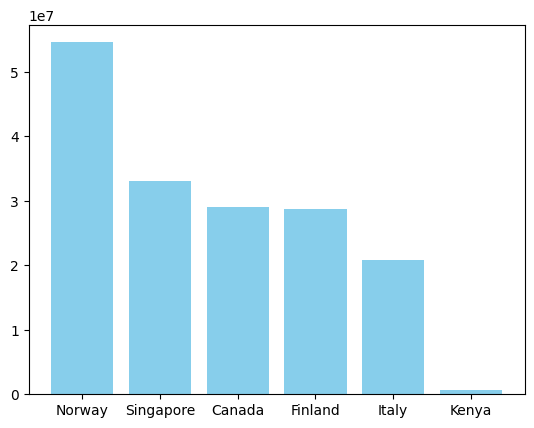

In [ ]:
#나라별 판매량 시각화

country_ = df_cleaned.groupby('country')['num_sold'].sum().sort_values(ascending=False)
plt.bar(country_.index, country_, color='skyblue')

<BarContainer object of 7 artists>

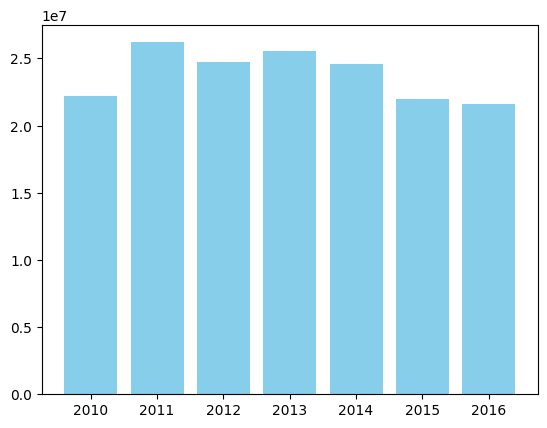

In [ ]:
# 연도별 시각화

year_ = df_cleaned.groupby('year')['num_sold'].sum().sort_values(ascending=False)
plt.bar(year_.index, year_, color='skyblue')

<BarContainer object of 12 artists>

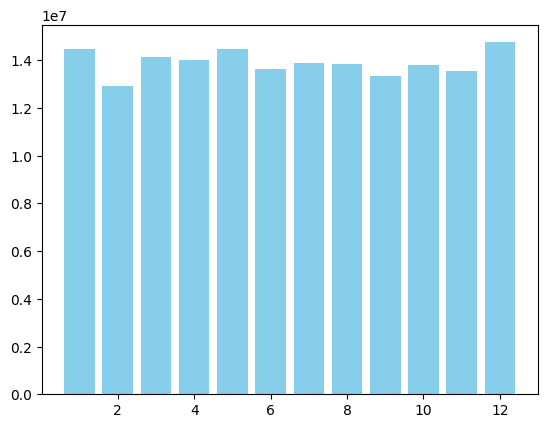

In [ ]:
# 월별 시각화

df_cleaned_month = df_cleaned.copy()
df_cleaned_month['month'] = df_cleaned_month['date'].dt.month
month_ = df_cleaned_month.groupby('month')['num_sold'].sum().sort_values(ascending=False)
plt.bar(month_.index, month_, color='skyblue')

<BarContainer object of 31 artists>

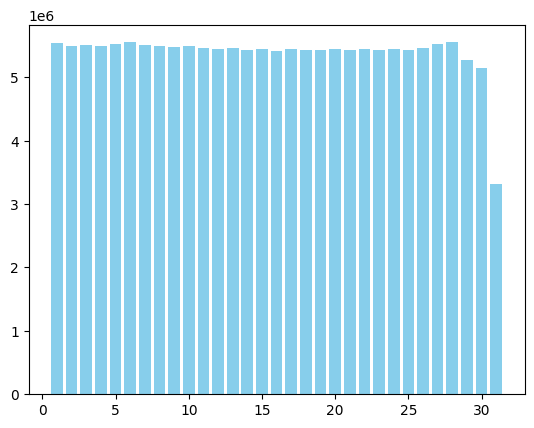

In [ ]:
#일별 시각화
df_cleaned_day = df_cleaned.copy()
df_cleaned_day['day'] = df_cleaned_day['date'].dt.day
day_ = df_cleaned_day.groupby('day')['num_sold'].sum().sort_values(ascending=False)
plt.bar(day_.index, day_, color='skyblue')

<BarContainer object of 7 artists>

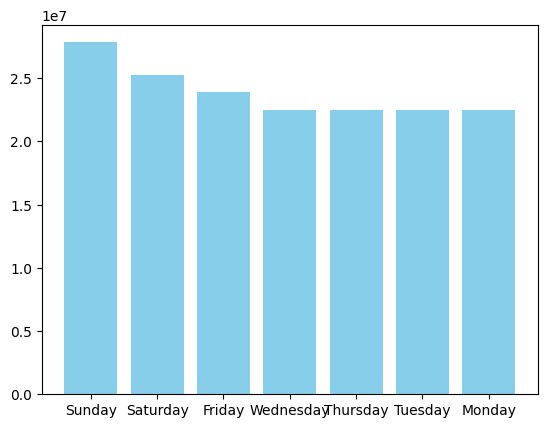

In [ ]:
#요일별 시각화
df_cleaned_dayof = df_cleaned.copy()
df_cleaned_dayof['day_name'] = df_cleaned_dayof['date'].dt.day_name()
dayof_ = df_cleaned_dayof.groupby('day_name')['num_sold'].sum().sort_values(ascending=False)
plt.bar(dayof_.index, dayof_, color='skyblue')

<BarContainer object of 3 artists>

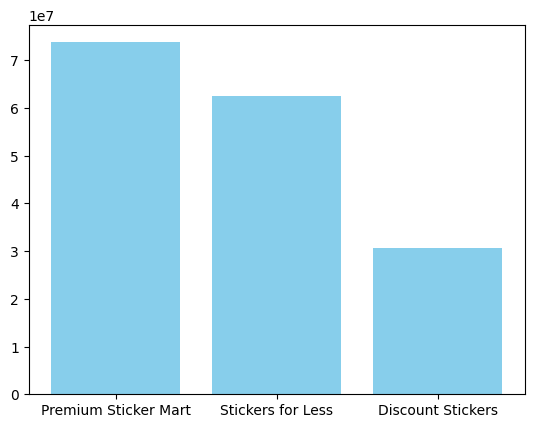

In [ ]:
#판매처별 시각화

store_ = df_cleaned.groupby('store')['num_sold'].sum().sort_values(ascending=False)
plt.bar(store_.index, store_, color='skyblue')

<BarContainer object of 5 artists>

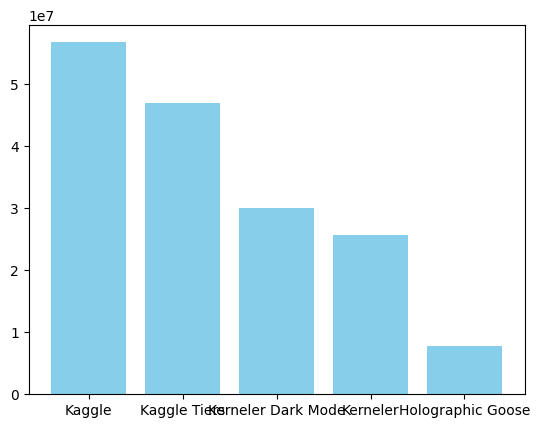

In [ ]:
#상품별 시각화

product_ = df_cleaned.groupby('product')['num_sold'].sum().sort_values(ascending=False)
plt.bar(product_.index, product_, color='skyblue')

## 1.4 시계열 분해 및 ACF/PACF

### (1) 날짜별 판매량 추세

<Axes: title={'center': 'Total Sales Over Time'}, xlabel='date'>

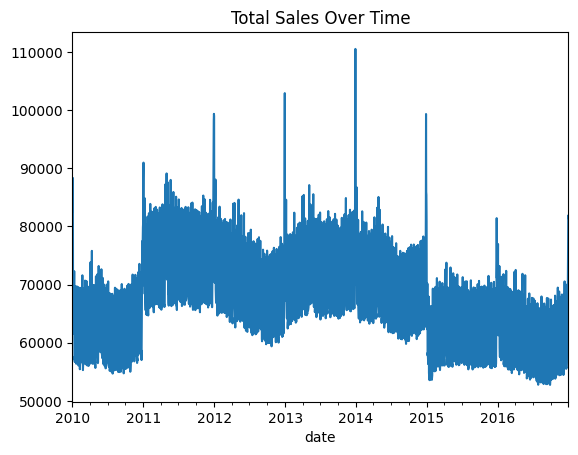

In [ ]:
sales_by_date = df.groupby('date')['num_sold'].sum()
sales_by_date.plot(title='Total Sales Over Time')

- 시계열 분해

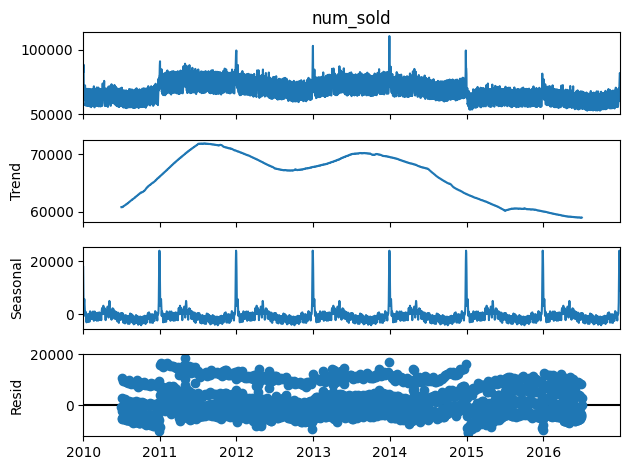

In [ ]:
decomposition = seasonal_decompose(sales_by_date, model='additive', period=365)
fig = decomposition.plot()
plt.show()

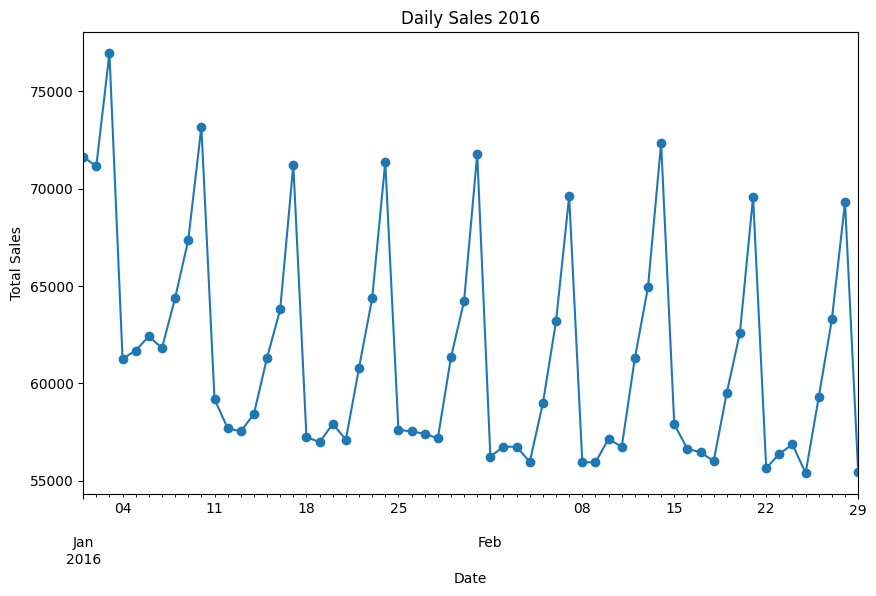

In [ ]:
# 2016년 1월만 살펴보기
specific_period =sales_by_date['2016-01':'2016-02']

plt.figure(figsize=(10, 6))
specific_period.plot(marker='o')
plt.title('Daily Sales 2016')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

### (2) Country 고정: 국가별 판매량 추세

In [ ]:
country_sum = df.groupby(['date','country'])['num_sold'].sum().reset_index()
# country_sum

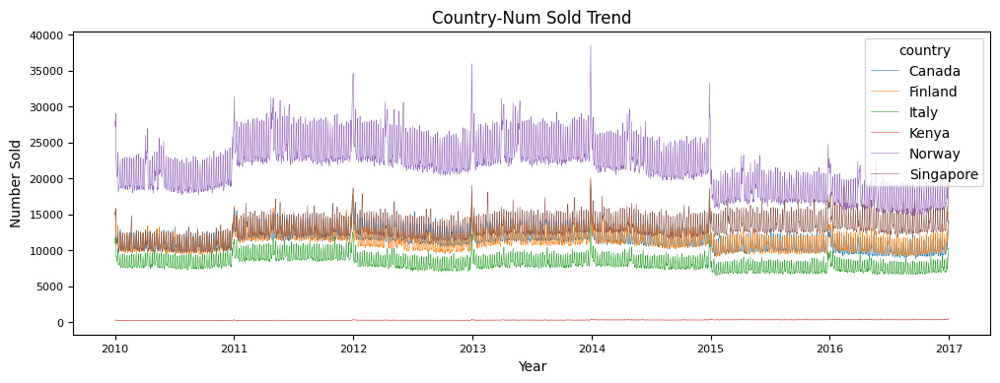

In [ ]:
# 각 나라 별 추세 그래프

import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12,4))
ax = sns.lineplot(data=country_sum, x='date', y='num_sold', hue='country', linewidth=0.4)
ax.set_title('Country-Num Sold Trend')
ax.set_xlabel("Year", fontsize=10)
ax.set_ylabel("Number Sold", fontsize=10)
ax.tick_params(axis="both", labelsize=8) #레이블 글자 크기 작게
plt.show()

#### a. 시계열 분해

- 추세: 증가 혹은 감소하는 추세가 보이진 않음. 선형 회귀 사용X
- 계절성:
  - 연초에 판매량이 높아짐 -> 연초에 가중치를 두어 회귀에 사용하거나 ARIMA 모델 사용시 계절성을 부여할 수 있음
  - 만약 특정 이벤트나 프로모션에 의해 판매량이 높아지는 거라면 더미 변수로 반영할 수 있음

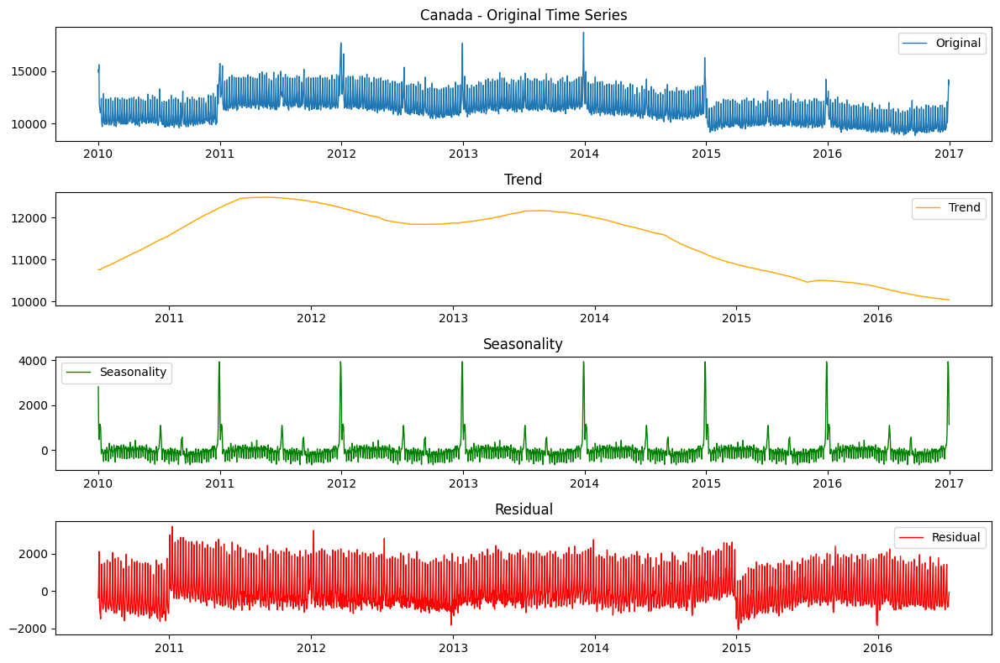

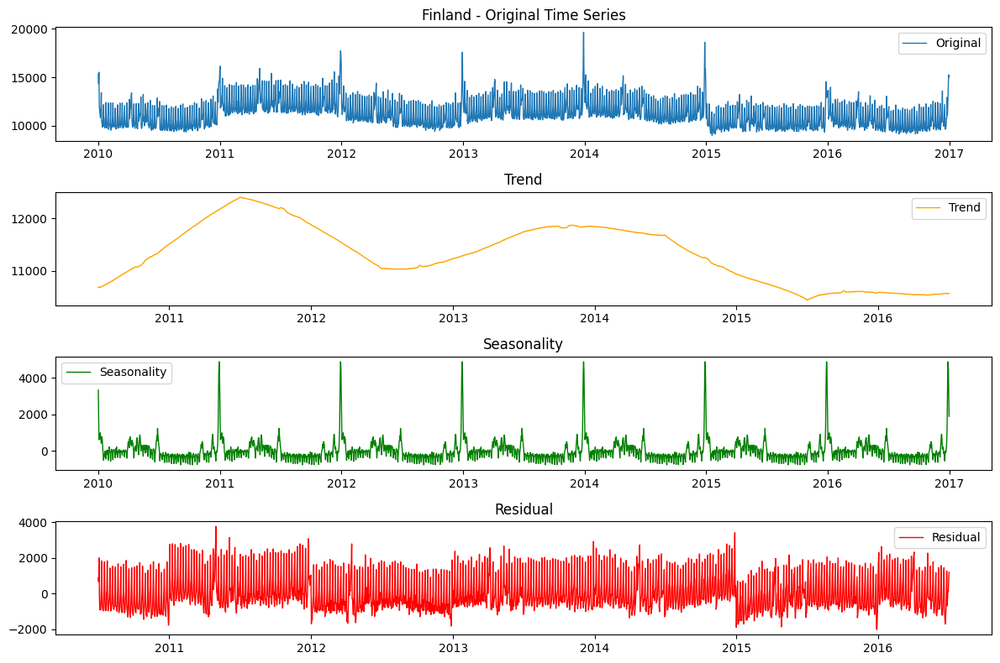

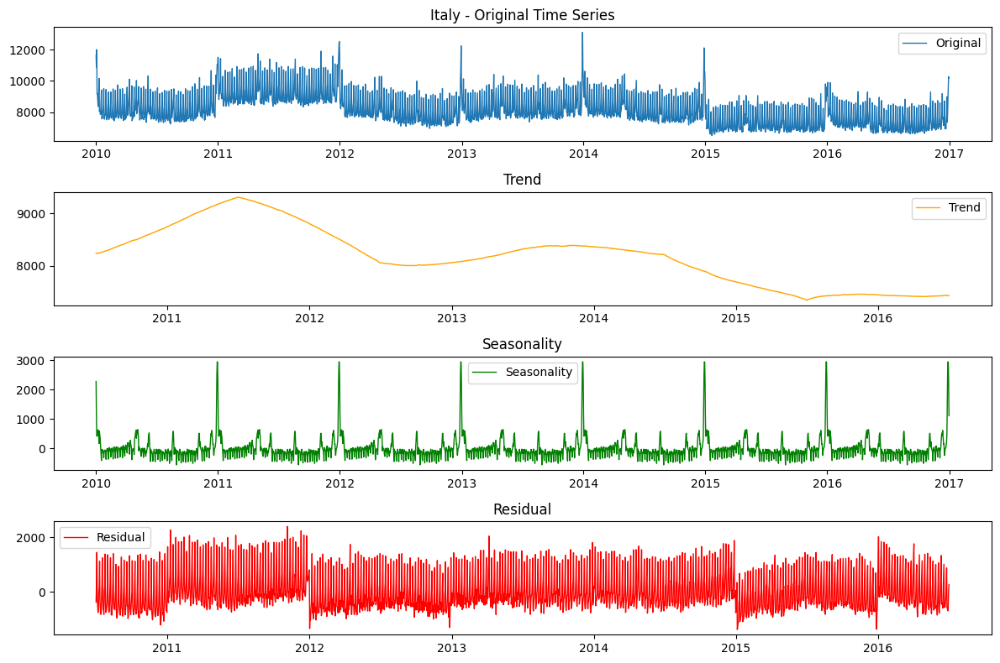

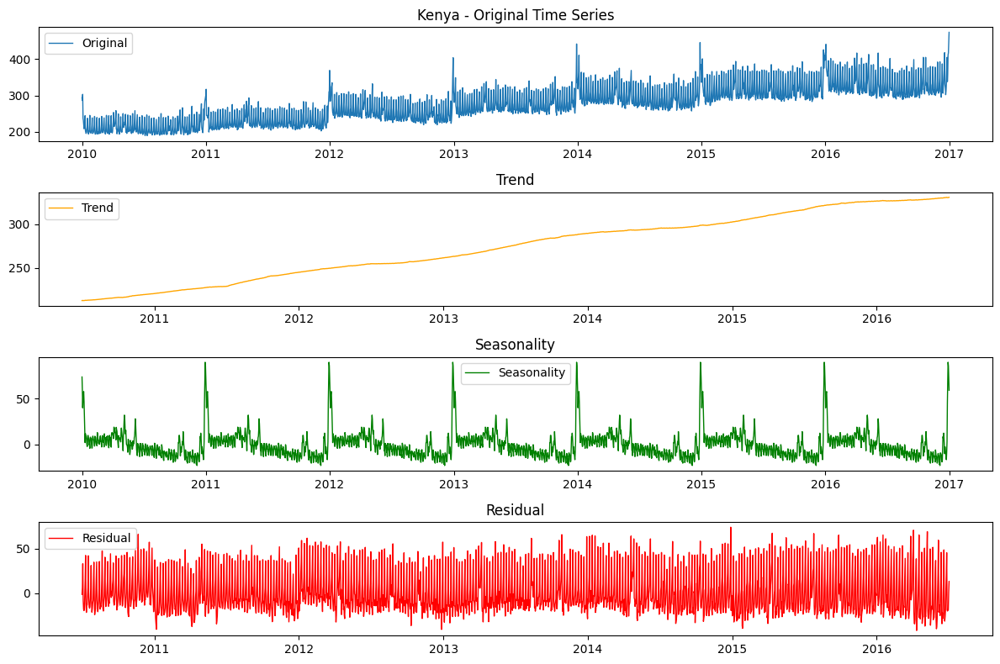

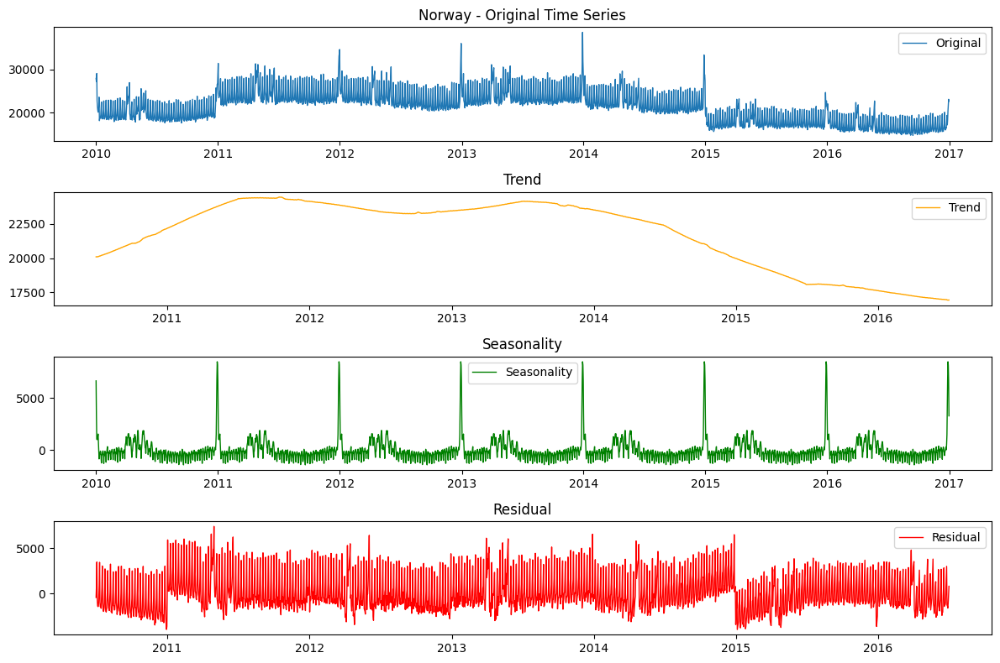

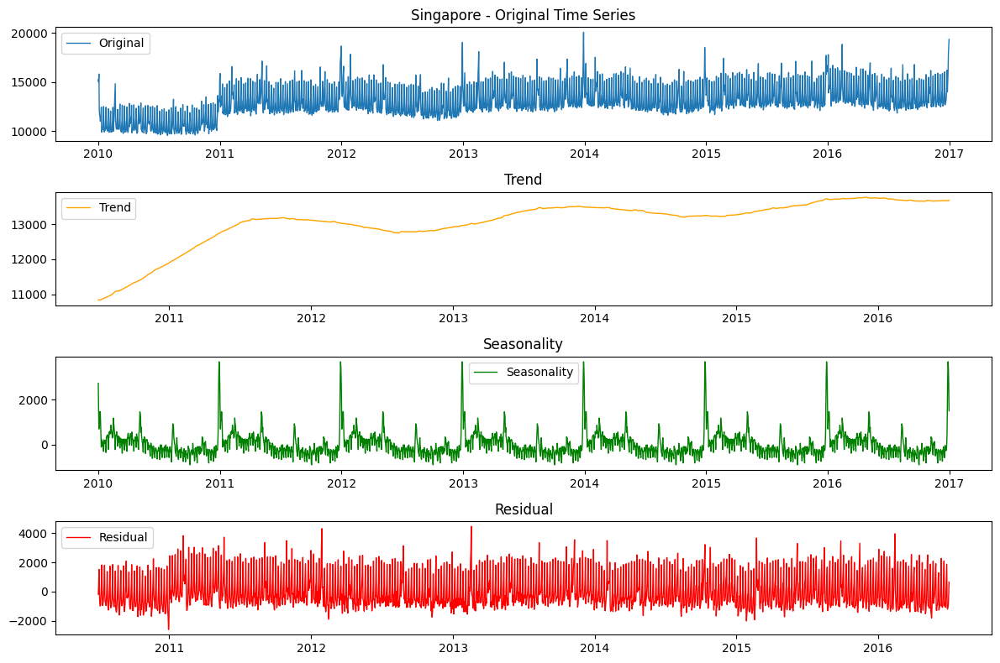

In [ ]:
# 시계열 분해
countries = country_sum['country'].unique()

for country in countries:
    plt.figure(figsize=(12, 8))
    country_data = country_sum[country_sum['country'] == country]

    # 인덱스를 date로 해야함
    ts_data = country_data.set_index('date')['num_sold']
    decomposition = seasonal_decompose(ts_data, model='additive', period=365)  # 일별 데이터

    # 추세, 계절성, 잔차 그래프 # 4행 1열로 나열
    plt.subplot(411)
    plt.plot(ts_data, label='Original', linewidth=1)
    plt.title(f'{country} - Original Time Series')
    plt.legend()

    plt.subplot(412)
    plt.plot(decomposition.trend, label='Trend', linewidth=1, color='orange')
    plt.title('Trend')
    plt.legend()

    plt.subplot(413)
    plt.plot(decomposition.seasonal, label='Seasonality', linewidth=1, color='green')
    plt.title('Seasonality')
    plt.legend()

    plt.subplot(414)
    plt.plot(decomposition.resid, label='Residual', linewidth=1, color='red')
    plt.title('Residual')
    plt.legend()

    plt.tight_layout()
    plt.show()

#### b. ACF/PACF

- ACF는 시계열에서 MA(이동 평균) 모델을 찾는데 유용함. ACF에서 특정 시차 이후에 값이 급격히 0에 가까워지면 MA 모델의 차수를 결정할 수 있음.PACF는 시계열에서 AR(자기 회귀) 모델을 찾는 데 유용함. ARMA 모델을 사용하려면 ACF와 PACF 모두를 고려해야 함.

>  ADF (Augmented Dickey-Fuller) 테스트: 시계열이 정상성인지 확인하는 테스트이다. p-value가 0.05 이하이면 정상성을 만족하므로 차분이 필요하지 않다고 판단한다.
- PCAF 그래프를 그리기 전 ADF 테스트로 차분이 필요한지 확인해야 함

결과: Norway에 대해서만 진행해보았을 때 (period=365로 한 일별 데이터) ACF 결과가 7일 주기로 나옴. 즉 7일 주기임을 확인

In [ ]:
# ADF 테스트
country_sum = df.groupby(['date','country'])['num_sold'].sum().reset_index()
country_data = country_sum[country_sum['country'] == 'Norway']
from statsmodels.tsa.stattools import adfuller
result = adfuller(country_data['num_sold'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -1.7729903886863916
p-value: 0.3939512433153839


<ipython-input-44-9f9f4c310e47>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_data['diff'] = country_data['num_sold'].diff()
<ipython-input-44-9f9f4c310e47>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_data.dropna(inplace=True)


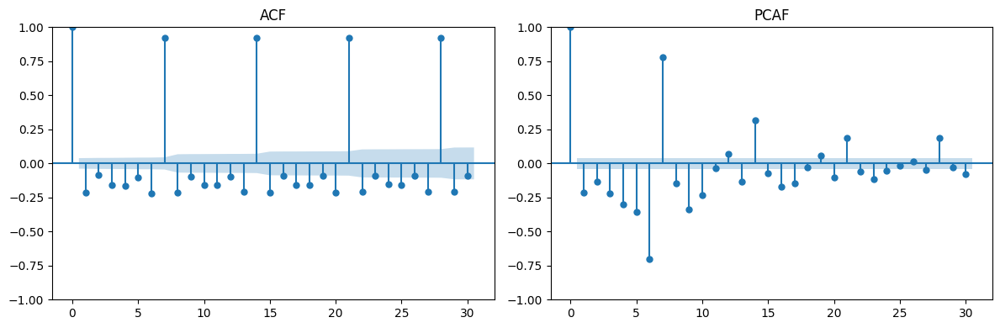

In [ ]:
# 비정상으로 판단(추세가 있음)-> 차분 진행후 PCAF 그래프를 함께 그리기
country_data['diff'] = country_data['num_sold'].diff()
country_data.dropna(inplace=True)

fig, axes = plt.subplots(1,2, figsize=(12,4))
plot_acf(country_data['diff'], lags=30, ax=axes[0])
axes[0].set_title('ACF')
plot_pacf(country_data['diff'], lags=30, ax=axes[1])
axes[1].set_title('PCAF')
plt.tight_layout()
plt.show()

#### c. 월별/요일별 판매량 시각화

- 전체 월별 판매

<ipython-input-45-8b9550709f95>:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_country = country_sum['num_sold'].resample('M').sum()


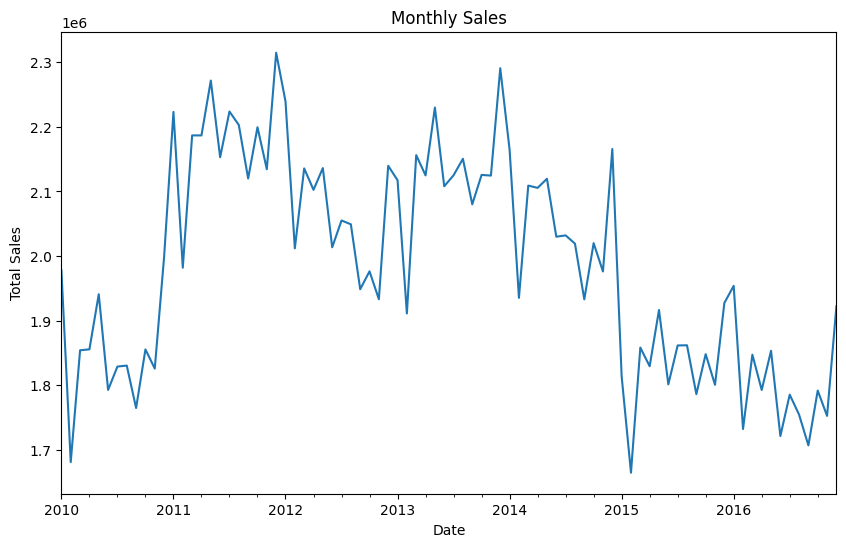

In [ ]:
country_sum = df.groupby(['date','country'])['num_sold'].sum().reset_index()
country_sum.set_index('date', inplace=True)
monthly_country = country_sum['num_sold'].resample('M').sum()
# monthly_country.sort_values(ascending=False).head(10)
plt.figure(figsize=(10, 6))
monthly_country.plot()
plt.title('Monthly Sales')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

- 전체 요일별 판매: 토, 일이 높음

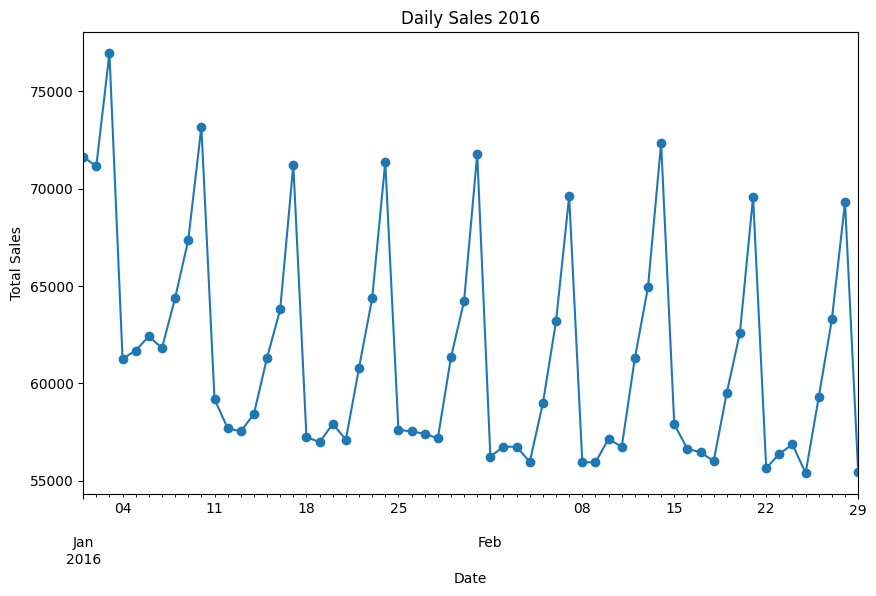

In [ ]:
# 2016년 1월만 살펴보기
daily_sales = country_sum['num_sold'].resample('D').sum()
specific_period = daily_sales['2016-01':'2016-02']

plt.figure(figsize=(10, 6))
specific_period.plot(marker='o')
plt.title('Daily Sales 2016')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

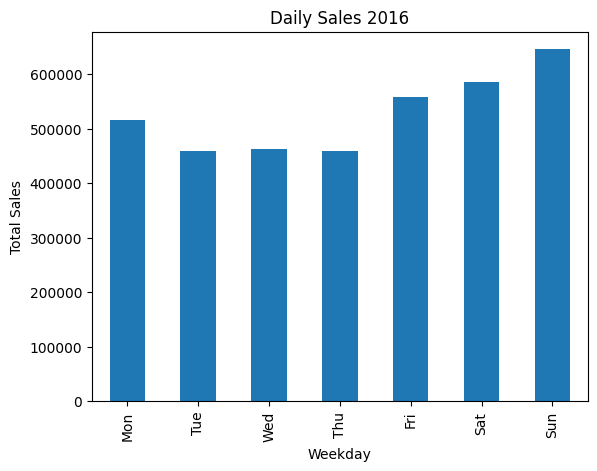

In [ ]:
daily_sales = country_sum['num_sold'].resample('D').sum()
specific_period = daily_sales['2016-01':'2016-02']
specific_period = specific_period.to_frame(name='num_sold')
specific_period['weekday'] = specific_period.index.dayofweek
specific_period.groupby('weekday')['num_sold'].sum().plot(kind='bar')
plt.title('Daily Sales 2016')
plt.xlabel('Weekday')
plt.ylabel('Total Sales')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

- 나라별 월별 판매: 마찬가지로 큰 경향성 보이지 않음

<ipython-input-48-7d5b4ef6d9a2>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_country = country_data['num_sold'].resample('M').sum()
<ipython-input-48-7d5b4ef6d9a2>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_country = country_data['num_sold'].resample('M').sum()
<ipython-input-48-7d5b4ef6d9a2>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_country = country_data['num_sold'].resample('M').sum()
<ipython-input-48-7d5b4ef6d9a2>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_country = country_data['num_sold'].resample('M').sum()
<ipython-input-48-7d5b4ef6d9a2>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_country = country_data['num_sold'].resample('M').sum()
<ipyt

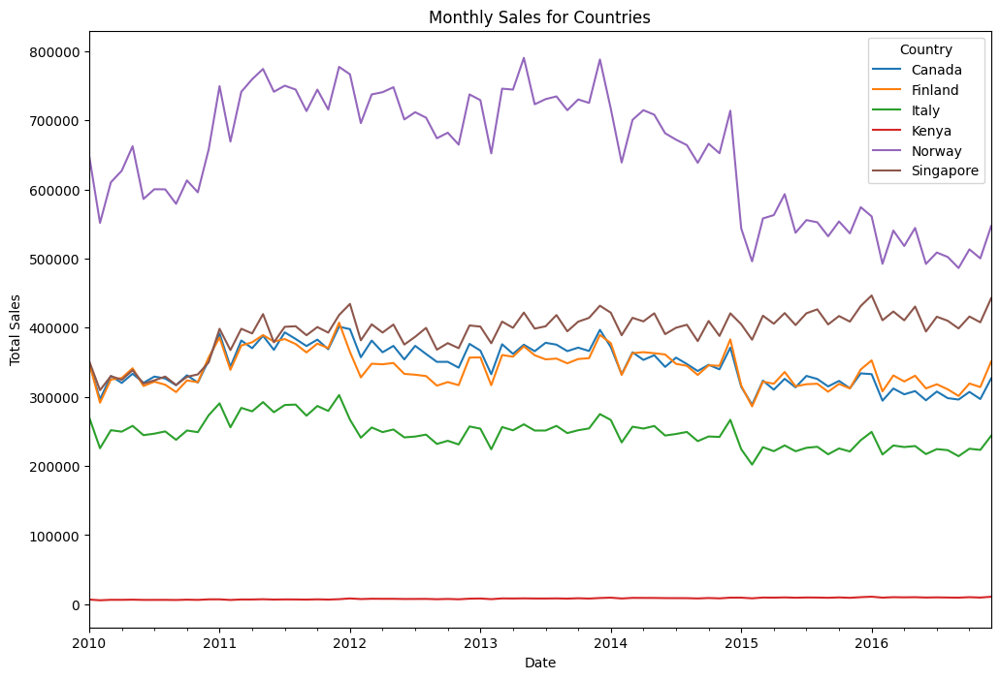

In [ ]:
countries = country_sum['country'].unique()

fig, ax = plt.subplots(figsize=(12, 8))
for country in countries:
    country_data = country_sum[country_sum['country'] == country]
    monthly_country = country_data['num_sold'].resample('M').sum()
    # print(monthly_country.sort_values(ascending=False).head(10))
    monthly_country.plot(ax=ax, label=country)

ax.set_title('Monthly Sales for Countries')
ax.set_xlabel('Date')
ax.set_ylabel('Total Sales')
ax.legend(title='Country')
plt.show()

- 나라별 요일별 판매

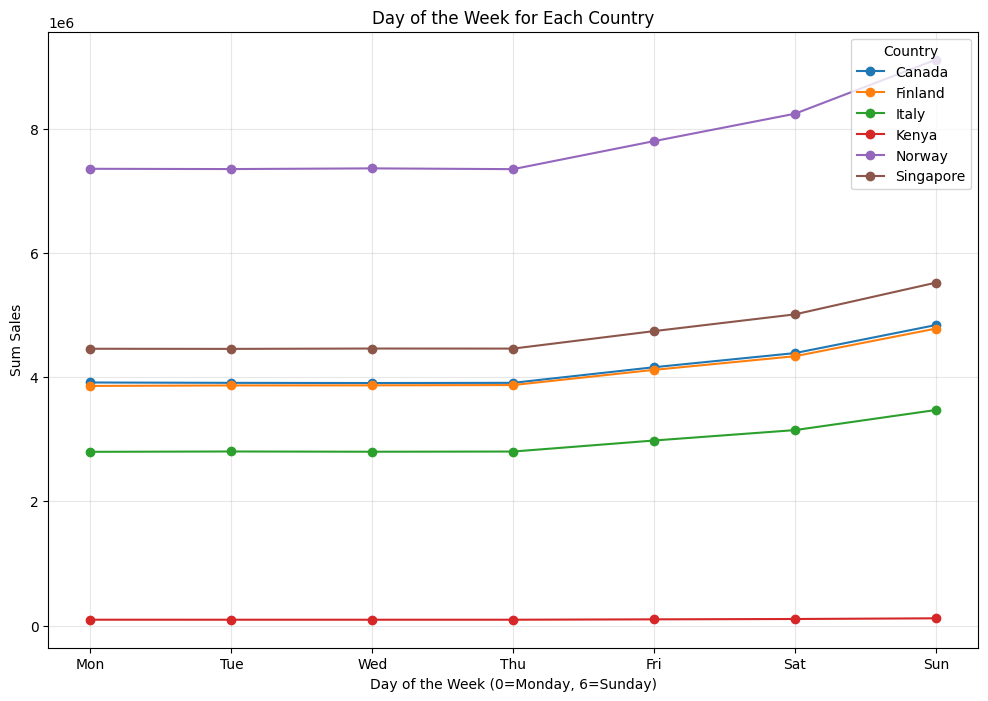

In [ ]:
# 날짜에서 요일 추출 (0=Monday, 6=Sunday)
country_sum['weekday'] = country_sum.index.dayofweek

fig, ax = plt.subplots(figsize=(12, 8))
for country in countries:
    country_data = country_sum[country_sum['country'] == country]
    weekday_sales = country_data.groupby('weekday')['num_sold'].sum()
    ax.plot(weekday_sales.index, weekday_sales, marker='o', label=country)

ax.set_title('Day of the Week for Each Country')
ax.set_xlabel('Day of the Week (0=Monday, 6=Sunday)')
ax.set_ylabel('Sum Sales')
ax.set_xticks(range(7))
ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
ax.legend(title='Country', loc='upper right')
plt.grid(alpha=0.3)
plt.show()

### (3) Store 고정: store 별 판매량 추세

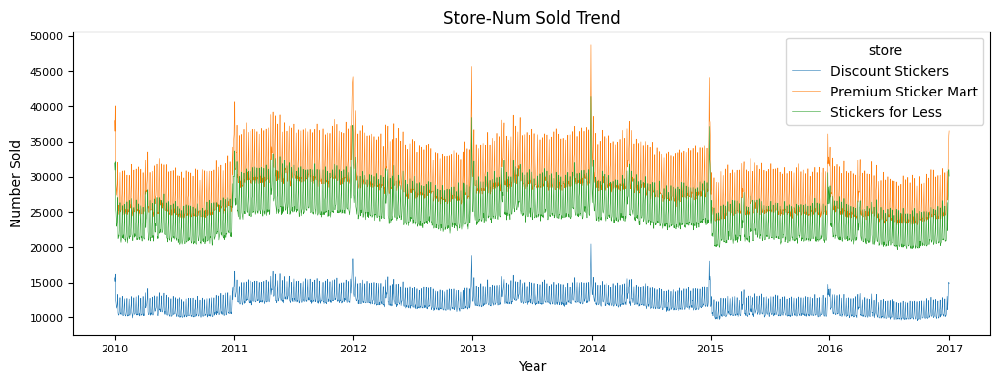

In [ ]:
# store 별 추세선 그래프
store_sum = df.groupby(['date','store'])['num_sold'].sum().reset_index()

plt.figure(figsize=(12,4))
ax = sns.lineplot(data=store_sum, x='date', y='num_sold', hue='store', linewidth=0.4)
ax.set_title('Store-Num Sold Trend')
ax.set_xlabel("Year", fontsize=10)
ax.set_ylabel("Number Sold", fontsize=10)
ax.tick_params(axis="both", labelsize=8)
plt.show()

#### a. 시계열 분해

- 연초에 판매량이 많은 것 같음. 월별 데이터로도 확인 필요

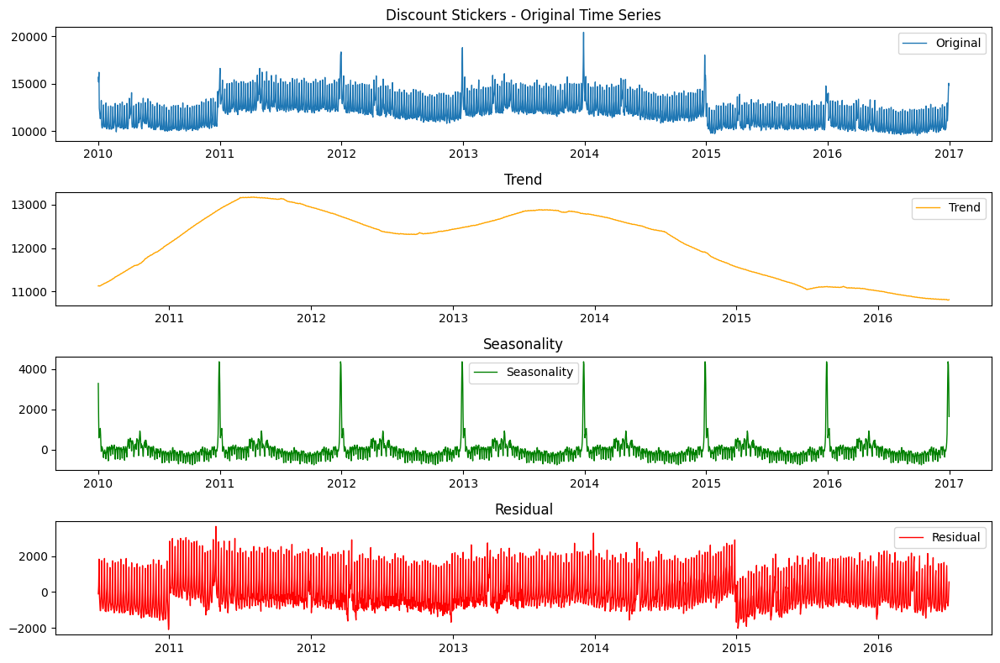

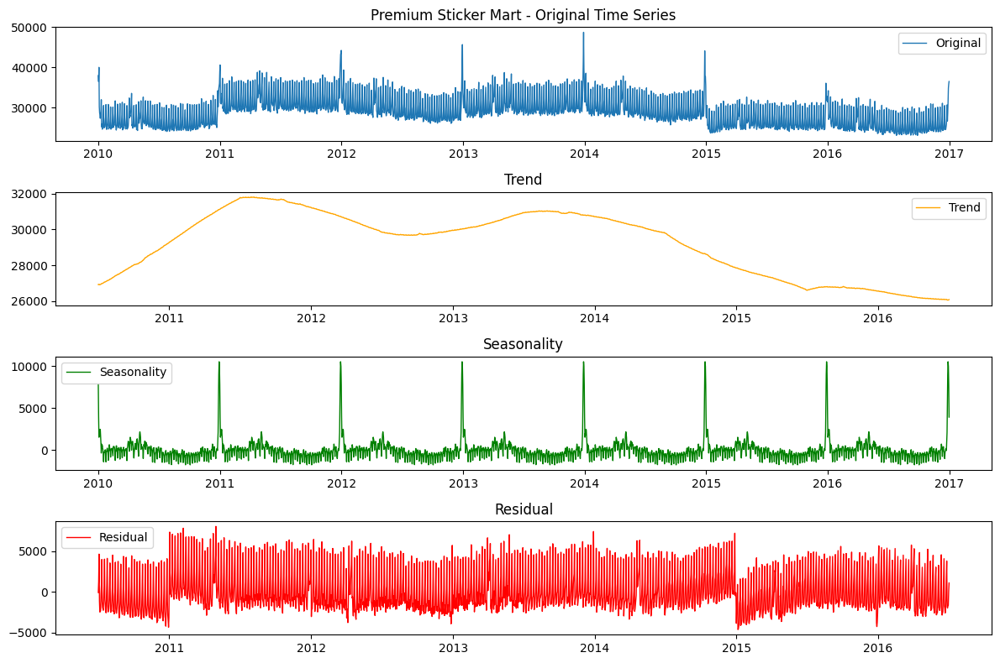

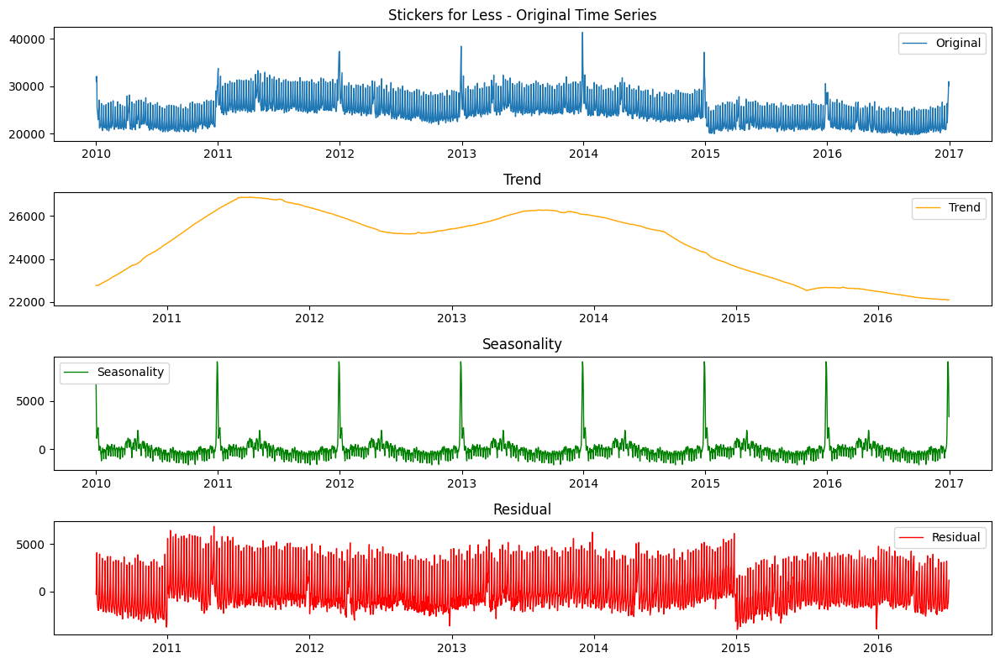

In [ ]:
# 시계열 분해
stores = store_sum['store'].unique()

for store in stores:
    plt.figure(figsize=(12, 8))
    store_data = store_sum[store_sum['store'] == store]

    ts_data = store_data.set_index('date')['num_sold']
    decomposition = seasonal_decompose(ts_data, model='additive', period=365)

    plt.subplot(411)
    plt.plot(ts_data, label='Original', linewidth=1)
    plt.title(f'{store} - Original Time Series')
    plt.legend()

    plt.subplot(412)
    plt.plot(decomposition.trend, label='Trend', linewidth=1, color='orange')
    plt.title('Trend')
    plt.legend()

    plt.subplot(413)
    plt.plot(decomposition.seasonal, label='Seasonality', linewidth=1, color='green')
    plt.title('Seasonality')
    plt.legend()

    plt.subplot(414)
    plt.plot(decomposition.resid, label='Residual', linewidth=1, color='red')
    plt.title('Residual')
    plt.legend()

    plt.tight_layout()
    plt.show()

#### b. ACF/PCAF

- discount stickers만 확인: 7일 주기

In [ ]:
# ADF 테스트
store_sum = df.groupby(['date','store'])['num_sold'].sum().reset_index()
store_data = store_sum[store_sum['store'] == 'Discount Stickers']
from statsmodels.tsa.stattools import adfuller
result = adfuller(store_data['num_sold'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -2.7413585907513687
p-value: 0.06715075832691793


<ipython-input-53-0207bf50fa26>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  store_data['diff'] = store_data['num_sold'].diff()
<ipython-input-53-0207bf50fa26>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  store_data.dropna(inplace=True)


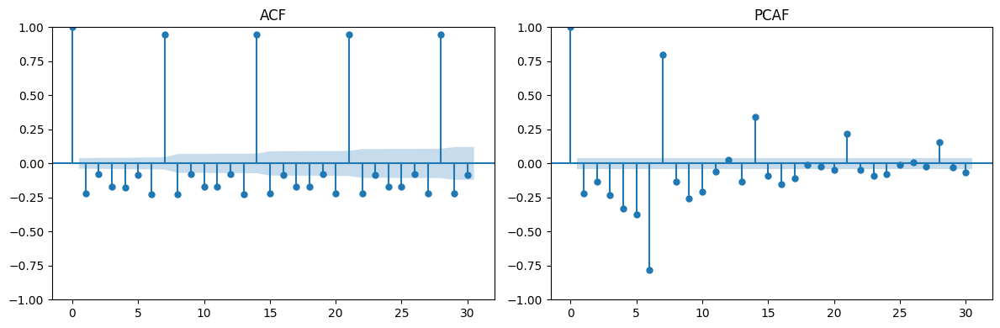

In [ ]:
# 차분 진행 후 ACF/PCAF 그래프 확인
store_data['diff'] = store_data['num_sold'].diff()
store_data.dropna(inplace=True)

fig, axes = plt.subplots(1,2, figsize=(12,4))
plot_acf(store_data['diff'], lags=30, ax=axes[0])
axes[0].set_title('ACF')
plot_pacf(store_data['diff'], lags=30, ax=axes[1])
axes[1].set_title('PCAF')
plt.tight_layout()
plt.show()

#### c. 월별/요일별 판매량 시각화

- 전체 store의 월별: 잘 보이지 않음

In [ ]:
store_sum = df.groupby(['date','store'])['num_sold'].sum().reset_index()
store_sum.set_index('date', inplace=True)
monthly_store = store_sum['num_sold'].resample('M').sum()
# monthly_store.sort_values(ascending=False).head(10)

<ipython-input-54-47e24ed41fe6>:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_store = store_sum['num_sold'].resample('M').sum()


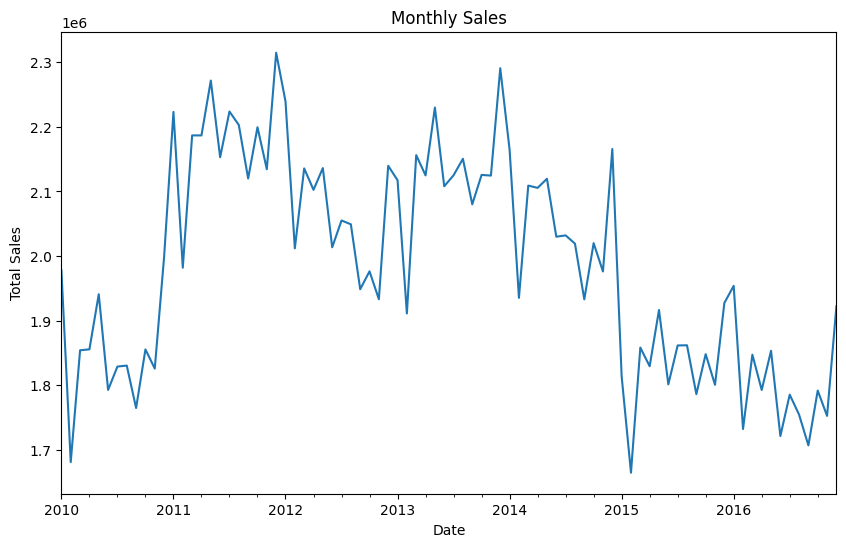

In [ ]:
plt.figure(figsize=(10, 6))
monthly_store.plot()
plt.title('Monthly Sales')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

- store 별 월별 판매량: 모두 12월이 높긴 하나 큰 차이는 없음

<ipython-input-56-c902031797ab>:9: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = store_data['num_sold'].resample('M').sum()
<ipython-input-56-c902031797ab>:9: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = store_data['num_sold'].resample('M').sum()
<ipython-input-56-c902031797ab>:9: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = store_data['num_sold'].resample('M').sum()


date
2011-12-31    423468.0
2013-12-31    420207.0
2011-05-31    416660.5
2012-01-31    410683.0
2013-05-31    409017.0
2011-01-31    407396.0
2011-07-31    407277.0
2011-08-31    404461.0
2011-10-31    404114.0
2011-04-30    401173.0
Name: num_sold, dtype: float64
date
2011-12-31    1.025368e+06
2013-12-31    1.014860e+06
2011-05-31    1.004521e+06
2012-01-31    9.919730e+05
2013-05-31    9.860985e+05
2011-01-31    9.844875e+05
2011-07-31    9.841810e+05
2011-08-31    9.749590e+05
2011-10-31    9.723760e+05
2011-03-31    9.667158e+05
Name: num_sold, dtype: float64
date
2011-12-31    866015.000000
2013-12-31    855746.000000
2011-05-31    850547.142857
2012-01-31    836863.500000
2013-05-31    834835.071429
2011-07-31    832348.833333
2011-01-31    831289.000000
2011-08-31    823472.200000
2011-10-31    822975.000000
2011-03-31    819714.000000
Name: num_sold, dtype: float64


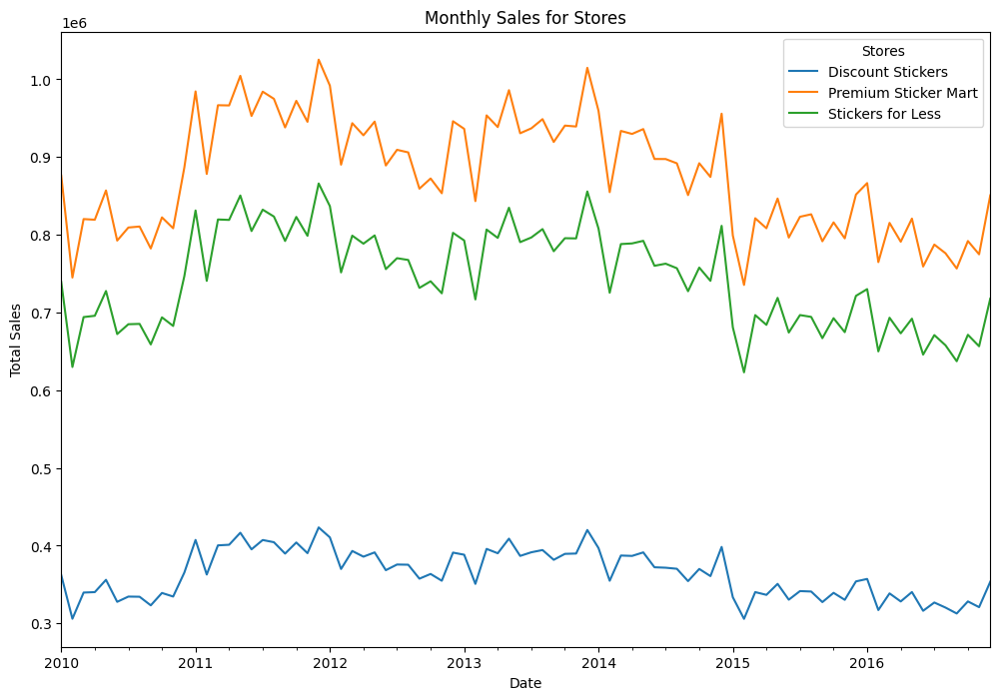

In [ ]:
stores = store_sum['store'].unique()
# store_sum['date'] = pd.to_datetime(store_sum['date'])
# store_sum.set_index('date', inplace=True)

fig, ax = plt.subplots(figsize=(12, 8))

for store in stores:
    store_data = store_sum[store_sum['store'] == store]
    monthly_sales = store_data['num_sold'].resample('M').sum()
    print(monthly_sales.sort_values(ascending=False).head(10))
    monthly_sales.plot(ax=ax, label=store)

ax.set_title('Monthly Sales for Stores')
ax.set_xlabel('Date')
ax.set_ylabel('Total Sales')
ax.legend(title='Stores')

plt.show()

- 전체 일별: 토, 일이 높음

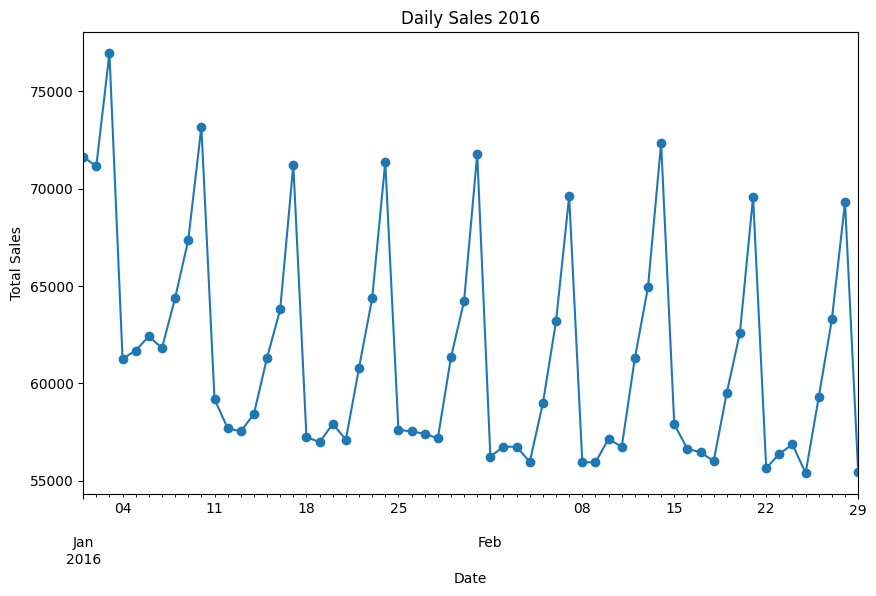

In [ ]:
# 2016년 1월만 살펴보기
daily_sales = store_sum['num_sold'].resample('D').sum()
specific_period = daily_sales['2016-01':'2016-02']

plt.figure(figsize=(10, 6))
specific_period.plot(marker='o')
plt.title('Daily Sales 2016')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

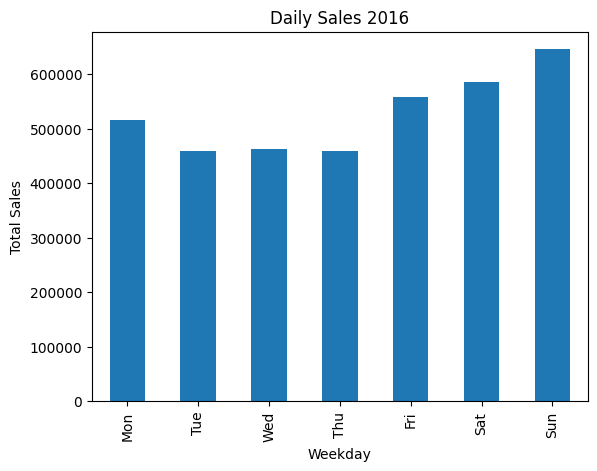

In [ ]:
daily_sales = store_sum['num_sold'].resample('D').sum()
specific_period = daily_sales['2016-01':'2016-02']
specific_period = specific_period.to_frame(name='num_sold')
specific_period['weekday'] = specific_period.index.dayofweek
specific_period.groupby('weekday')['num_sold'].sum().plot(kind='bar')
plt.title('Daily Sales 2016')
plt.xlabel('Weekday')
plt.ylabel('Total Sales')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

### (4) Product 고정: 제품 별 판매량 추세

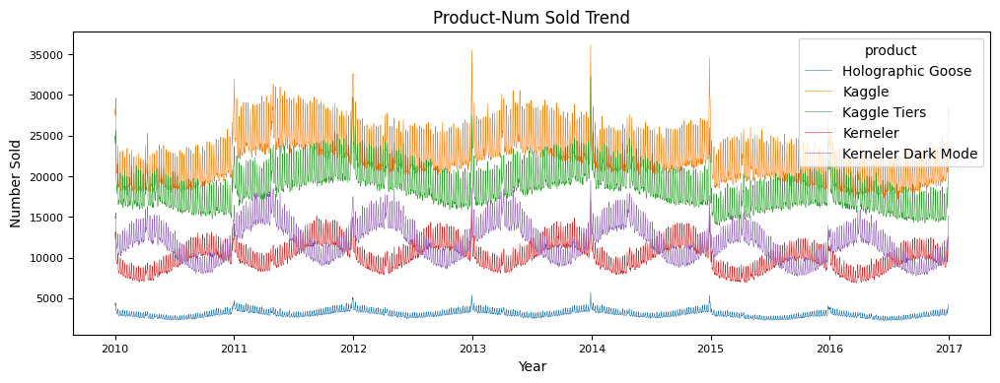

In [ ]:
# product 별 추세선 그래프
product_sum = df.groupby(['date','product'])['num_sold'].sum().reset_index()

plt.figure(figsize=(12,4))
ax = sns.lineplot(data=product_sum, x='date', y='num_sold', hue='product', linewidth=0.4)
ax.set_title('Product-Num Sold Trend')
ax.set_xlabel("Year", fontsize=10)
ax.set_ylabel("Number Sold", fontsize=10)
ax.tick_params(axis="both", labelsize=8)
plt.show()

#### a. 시계열 분해

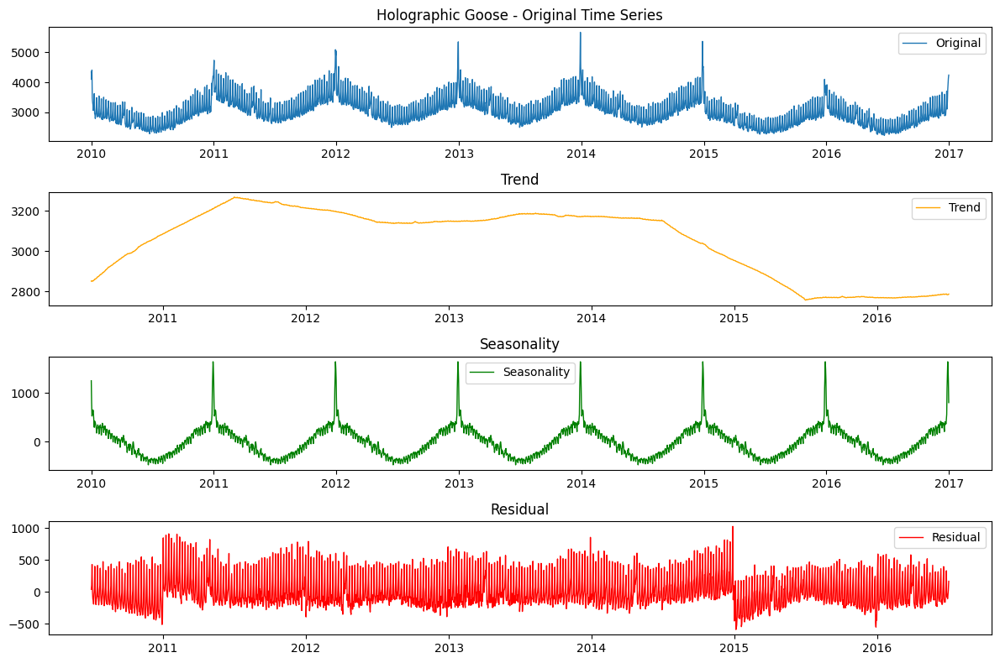

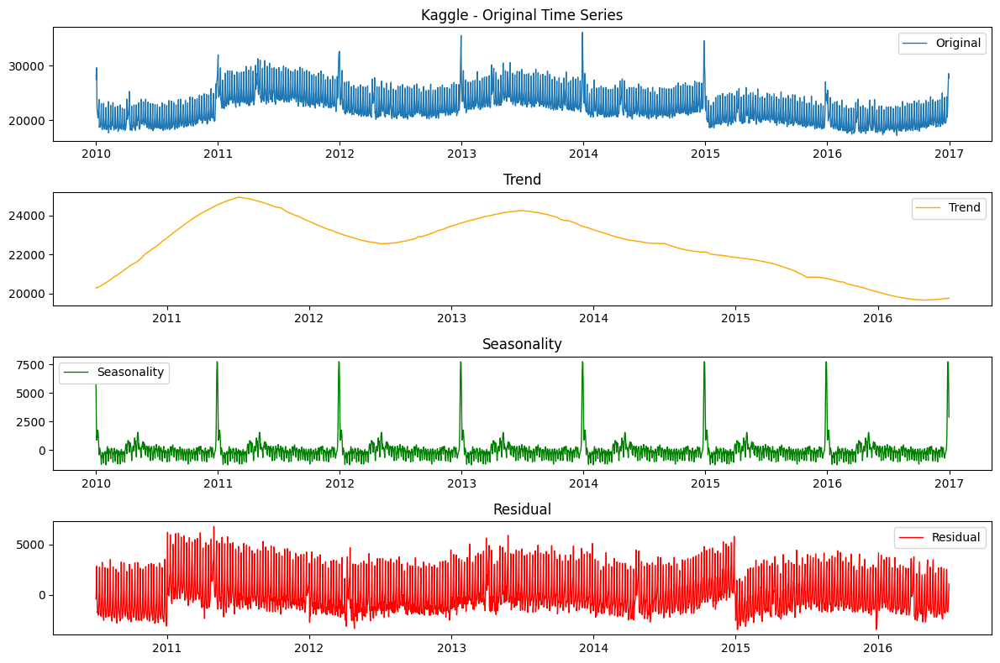

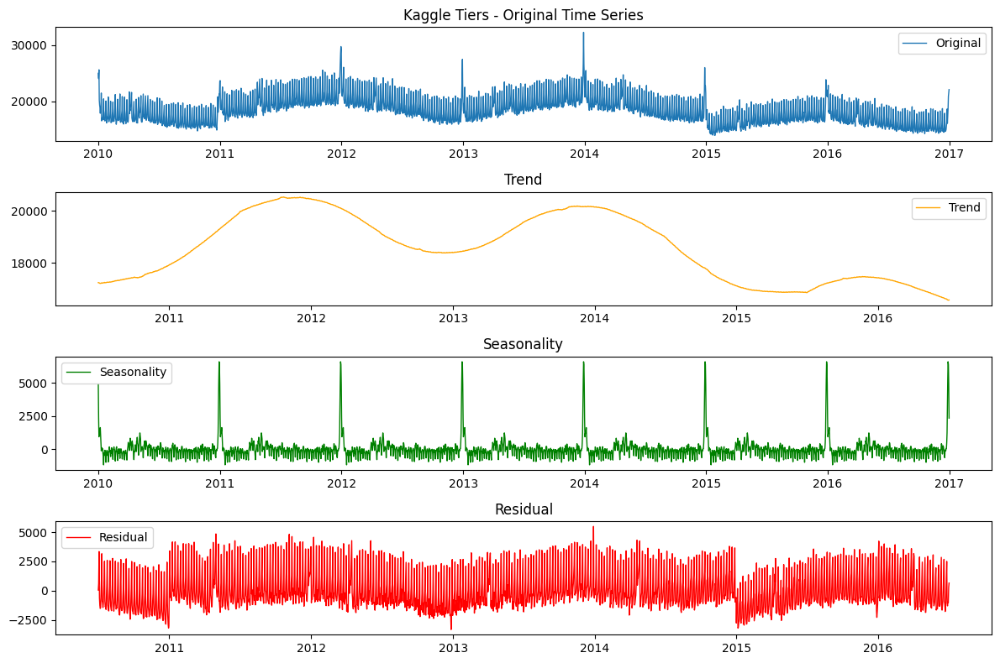

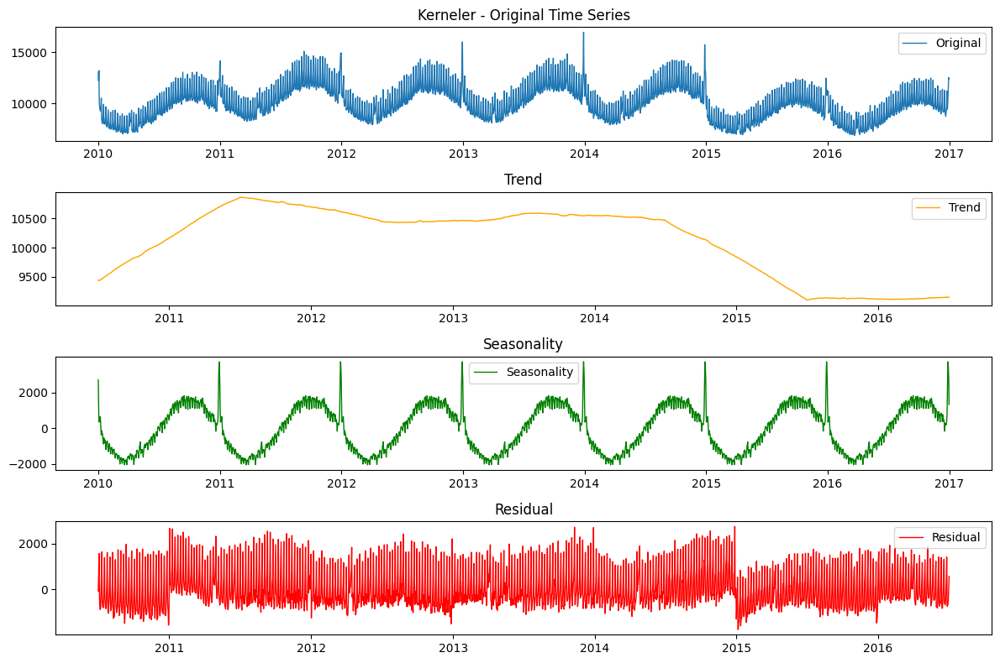

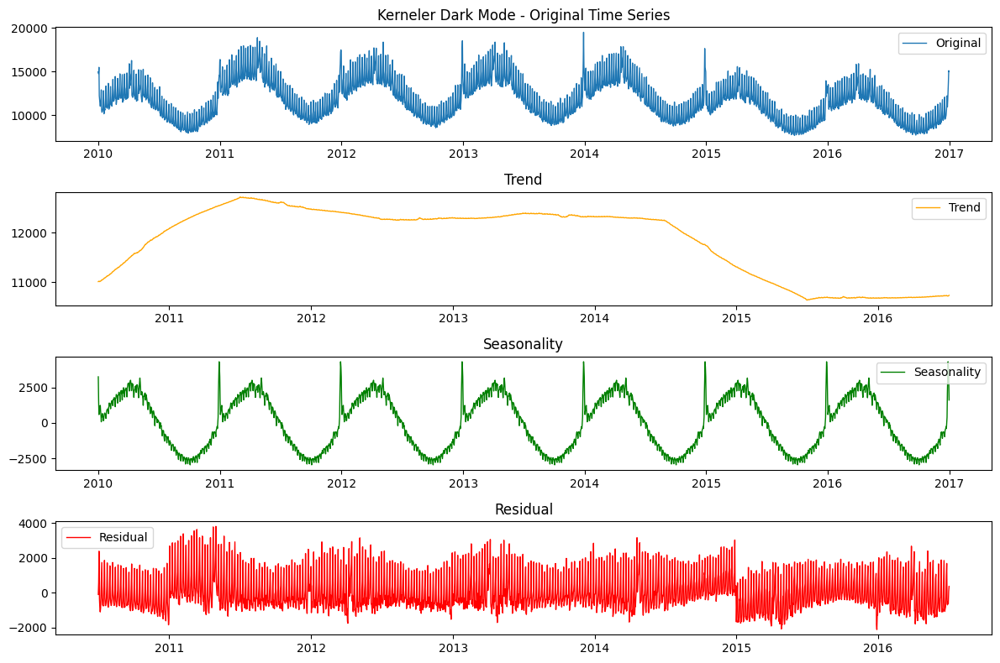

In [ ]:
products = product_sum['product'].unique()

for product in products:
    plt.figure(figsize=(12, 8))
    product_data = product_sum[product_sum['product'] == product]

    # 인덱스를 date로 해야함
    ts_data = product_data.set_index('date')['num_sold']
    decomposition = seasonal_decompose(ts_data, model='additive', period=365)  # period는 연간 주기로 함

    # 추세, 계절성, 잔차 그래프
    plt.subplot(411)
    plt.plot(ts_data, label='Original', linewidth=1)
    plt.title(f'{product} - Original Time Series')
    plt.legend()

    plt.subplot(412)
    plt.plot(decomposition.trend, label='Trend', linewidth=1, color='orange')
    plt.title('Trend')
    plt.legend()

    plt.subplot(413)
    plt.plot(decomposition.seasonal, label='Seasonality', linewidth=1, color='green')
    plt.title('Seasonality')
    plt.legend()

    plt.subplot(414)
    plt.plot(decomposition.resid, label='Residual', linewidth=1, color='red')
    plt.title('Residual')
    plt.legend()

    plt.tight_layout()
    plt.show()

#### b. ACF/PCAF

- Kaggle 제품만 확인: 일별 데이터 결과이므로 ACF 결과는 7일 주기

In [ ]:
# ADF 테스트
product_sum = df.groupby(['date','product'])['num_sold'].sum().reset_index()
product_data = product_sum[product_sum['product'] == 'Kaggle']
from statsmodels.tsa.stattools import adfuller
result = adfuller(product_data['num_sold'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -2.2985964556434673
p-value: 0.17242104209629344


<ipython-input-62-d4100d323446>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  product_data['diff'] = product_data['num_sold'].diff()
<ipython-input-62-d4100d323446>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  product_data.dropna(inplace=True)


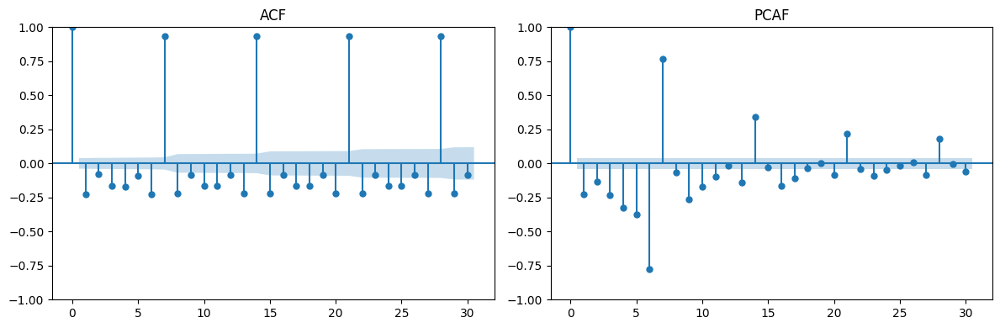

In [ ]:
# 차분 진행 후 ACF/PACF 그래프 같이 그리기
product_data['diff'] = product_data['num_sold'].diff()
product_data.dropna(inplace=True)

fig, axes = plt.subplots(1,2, figsize=(12,4))
plot_acf(product_data['diff'], lags=30, ax=axes[0])
axes[0].set_title('ACF')
plot_pacf(product_data['diff'], lags=30, ax=axes[1])
axes[1].set_title('PCAF')
plt.tight_layout()
plt.show()

- Kaggle 제품 월별 데이터로 변환해 살펴보기(시계열 분해, ACF): 별로 주기성이 보이지 않음. -> 일별 데이터 주기로 사용

<ipython-input-63-a631405112d8>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = product_data.resample('M').sum()


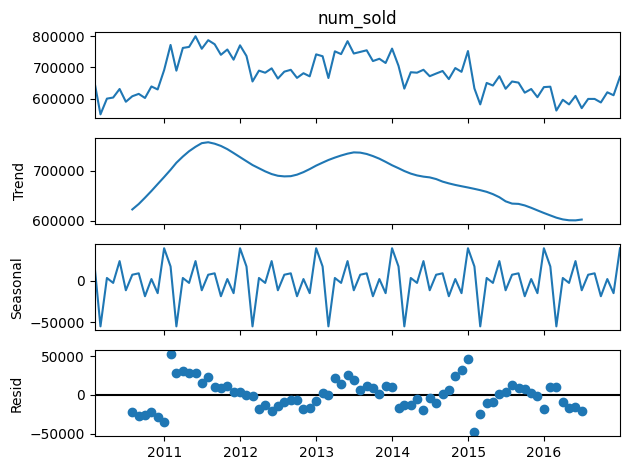

In [ ]:
product_sum = df.groupby(['date','product'])['num_sold'].sum().reset_index()
product_data = product_sum[product_sum['product'] == 'Kaggle']
product_data.set_index('date', inplace=True)

# 월별로 데이터 합치기(아님 평균으로도 할 수 있음)
monthly_data = product_data.resample('M').sum()

# 시계열 분해(월별이므로 period=12)
decomposition = seasonal_decompose(monthly_data['num_sold'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

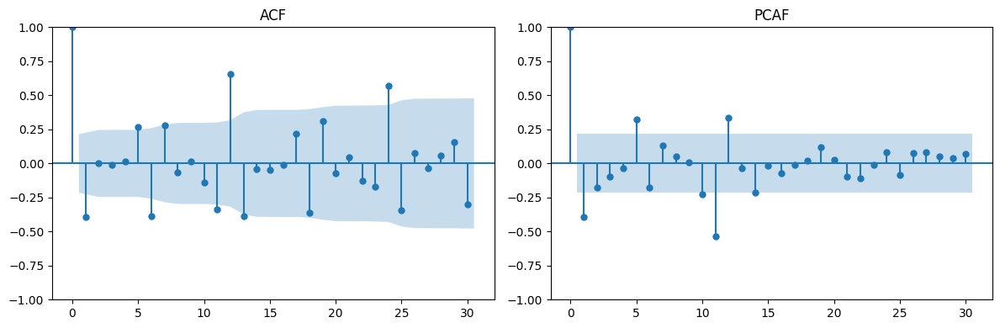

In [ ]:
# 차분, ACF/PACF 그래프

monthly_data['diff'] = monthly_data['num_sold'].diff()
monthly_data.dropna(inplace=True)

fig, axes = plt.subplots(1,2, figsize=(12,4))
plot_acf(monthly_data['diff'], lags=30, ax=axes[0])
axes[0].set_title('ACF')
plot_pacf(monthly_data['diff'], lags=30, ax=axes[1])
axes[1].set_title('PCAF')
plt.tight_layout()
plt.show()

#### c. 월별 판매량 시각화
- 전체는 파악이 어려움

In [ ]:
product_sum = df.groupby(['date','product'])['num_sold'].sum().reset_index()
product_sum.set_index('date', inplace=True)
monthly_product = product_sum['num_sold'].resample('M').sum()
monthly_product.sort_values(ascending=False).head(10)

<ipython-input-65-2e668cfe5008>:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_product = product_sum['num_sold'].resample('M').sum()


,num_sold
date,
2011-12-31,2.314850e+06
2013-12-31,2.290813e+06
2011-05-31,2.271729e+06
2012-01-31,2.239520e+06
2013-05-31,2.229951e+06
2011-07-31,2.223807e+06
2011-01-31,2.223172e+06
2011-08-31,2.202892e+06
2011-10-31,2.199465e+06


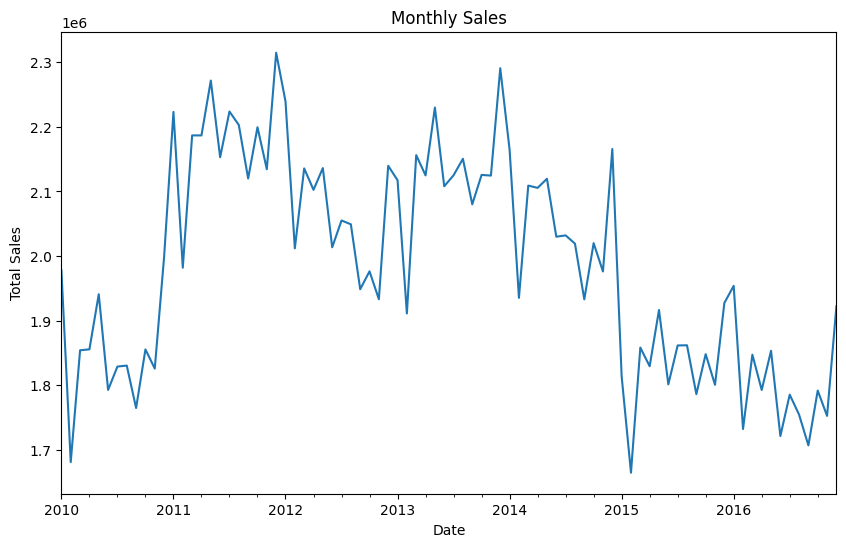

In [ ]:
# monthly_sales = product_data['num_sold'].resample('M').sum()
plt.figure(figsize=(10, 6))
monthly_product.plot()
plt.title('Monthly Sales')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

- 제품 별 월별 판매량

```
  - Holographic Goose: 12,1월 판매량 많음
  - Kaggle: 5,6,7월 판매량 많음
  - Kaggle Tiers: 12,1월 판매량 많음
  - Kerneler: 8,9,10월 판매량 많음
  - Kerneler Dark Mode: 3,4,5월 판매량 많음
  ```

<ipython-input-67-8c46a1d29f53>:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = product_data['num_sold'].resample('M').sum()
<ipython-input-67-8c46a1d29f53>:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = product_data['num_sold'].resample('M').sum()
<ipython-input-67-8c46a1d29f53>:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = product_data['num_sold'].resample('M').sum()
<ipython-input-67-8c46a1d29f53>:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = product_data['num_sold'].resample('M').sum()
<ipython-input-67-8c46a1d29f53>:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = product_data['num_sold'].resample('M').sum()


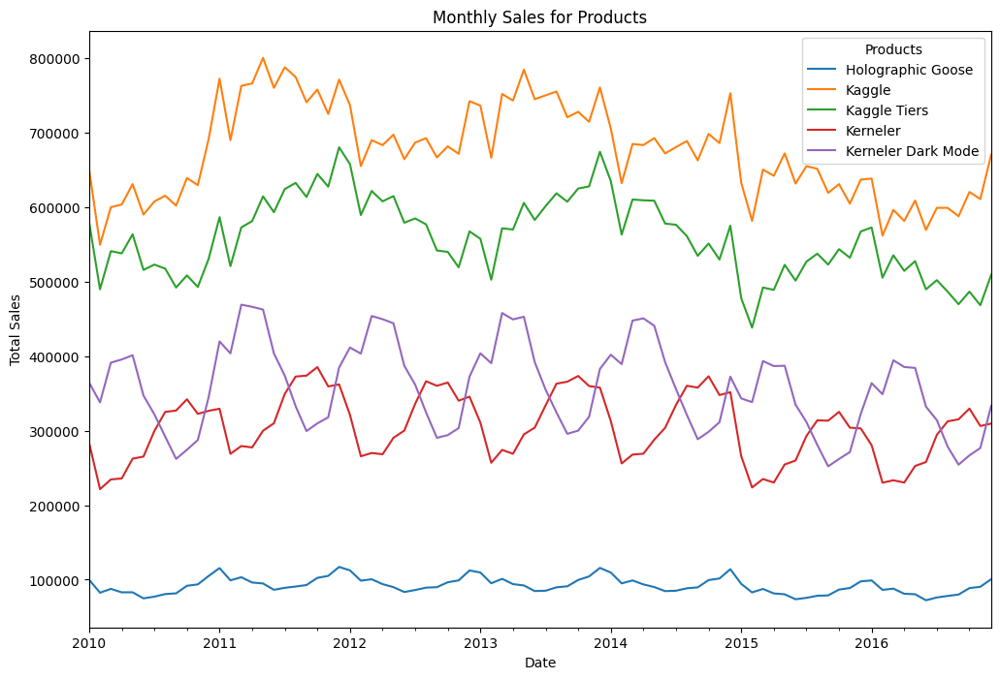

In [ ]:
product_sum = df.groupby(['date','product'])['num_sold'].sum().reset_index()
products = product_sum['product'].unique()
product_sum['date'] = pd.to_datetime(product_sum['date'])
product_sum.set_index('date', inplace=True)

fig, ax = plt.subplots(figsize=(12, 8))

for product in products:
    product_data = product_sum[product_sum['product'] == product]
    monthly_sales = product_data['num_sold'].resample('M').sum()
    # print(monthly_sales.sort_values(ascending=False).head(10))
    monthly_sales.plot(ax=ax, label=product)

ax.set_title('Monthly Sales for Products')
ax.set_xlabel('Date')
ax.set_ylabel('Total Sales')
ax.legend(title='Products')

plt.show()

- 전체 일별: 토, 일이 높음

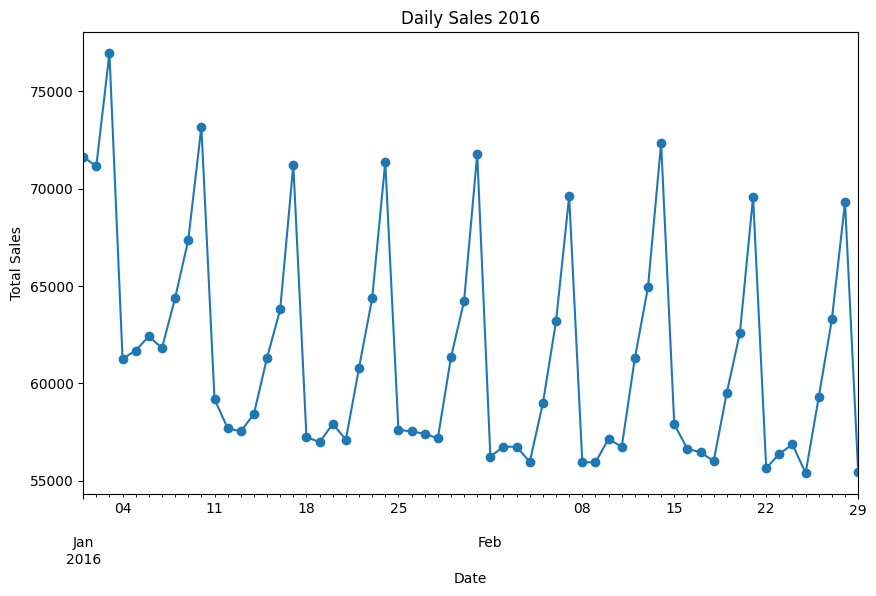

In [ ]:
# 2016년 1월만 살펴보기
daily_sales = product_sum['num_sold'].resample('D').sum()
specific_period = daily_sales['2016-01':'2016-02']

plt.figure(figsize=(10, 6))
specific_period.plot(marker='o')
plt.title('Daily Sales 2016')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

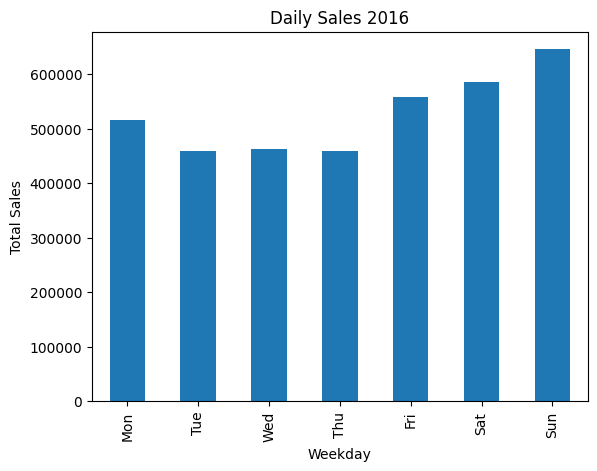

In [ ]:
daily_sales = product_sum['num_sold'].resample('D').sum()
specific_period = daily_sales['2016-01':'2016-02']
specific_period = specific_period.to_frame(name='num_sold')
specific_period['weekday'] = specific_period.index.dayofweek
specific_period.groupby('weekday')['num_sold'].sum().plot(kind='bar')
plt.title('Daily Sales 2016')
plt.xlabel('Weekday')
plt.ylabel('Total Sales')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

### (5) Country+Product 고정(참고)

In [ ]:
product_country_sum = df.groupby(['date', 'country', 'product'])['num_sold'].sum().reset_index()
# product_country_sum

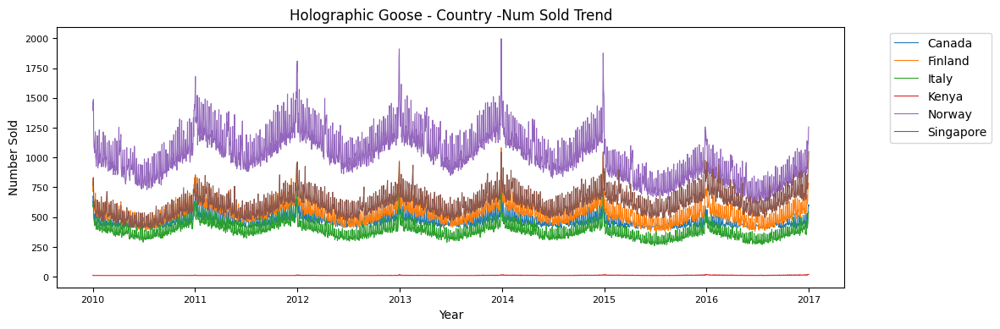

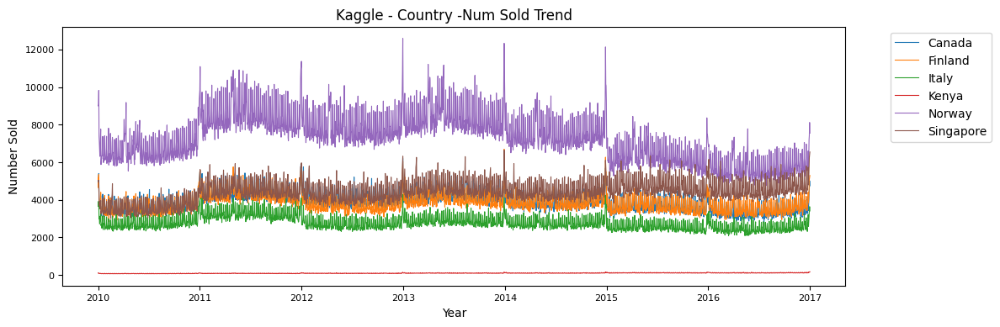

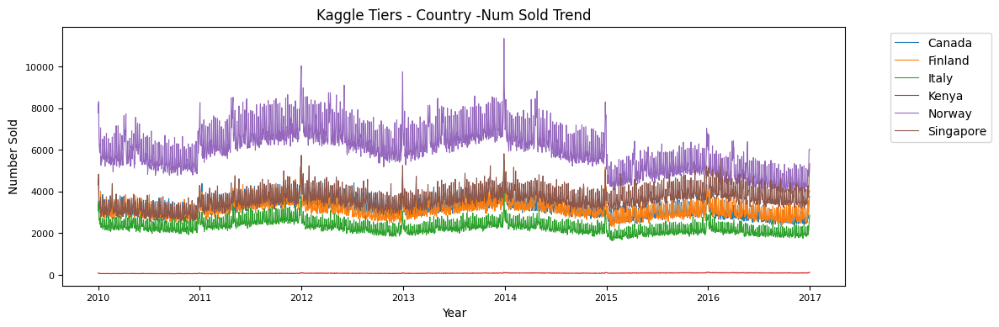

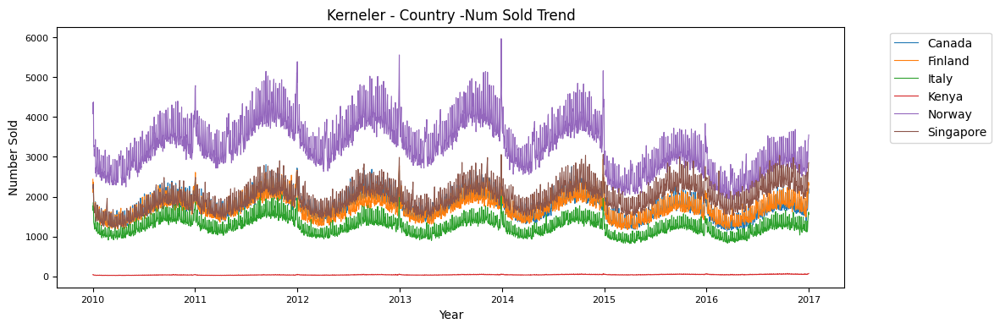

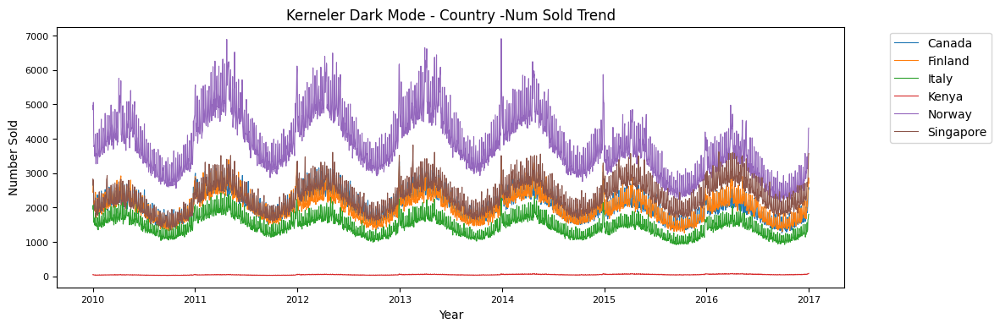

In [ ]:
# Product 별 그래프
products = product_country_sum['product'].unique()

for product in products:
    plt.figure(figsize=(12, 4))
    country_data = product_country_sum[product_country_sum['product'] == product]
    ax = sns.lineplot(data=country_data, x='date', y='num_sold', hue='country', linewidth=0.8)
    ax.set_title(f'{product} - Country -Num Sold Trend')
    ax.set_xlabel("Year", fontsize=10)
    ax.set_ylabel("Number Sold", fontsize=10)
    ax.tick_params(axis="both", labelsize=8)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # 범례 위치 조정
    plt.show()

### (6) 결론
- country, store, product 모두 주기성을 7일로 가짐-> 요일 별 확인결과 주말(토,일)에 판매량이 높음
- product별 월별 판매량에 유의한 결과 나옴: 가중치를 넣어 활용해도 될듯

  ```
  - Holographic Goose: 12,1월 판매량 많음
  - Kaggle: 5,6,7월 판매량 많음
  - Kaggle Tiers: 12,1월 판매량 많음
  - Kerneler: 8,9,10월 판매량 많음
  - Kerneler Dark Mode: 3,4,5월 판매량 많음
  ```

# 2. Modeling

In [ ]:
X = df_cleaned.drop(columns=['num_sold'])
y = df_cleaned[['num_sold', 'year']] #using 'year' as index

X_train = X[~(X['year'] == 2016)]
y_train = y[~(y['year'] == 2016)]
X_test = X[X['year'] == 2016]
y_test = y[y['year'] == 2016]

#drop 'year
y = y['num_sold']
y_train = y_train['num_sold']
y_test = y_test['num_sold']

print('X.shape: ', X.shape, 'y.shape: ', y.shape)
print('X_train: ', X_train.shape, 'X_test: ', X_test.shape)
print('y_train: ', y_train.shape, 'y_test: ', y_test.shape)

X.shape:  (225016, 10) y.shape:  (225016,)
X_train:  (192808, 10) X_test:  (32208, 10)
y_train:  (192808,) y_test:  (32208,)


##2.1 ARIMA (Leaderboard Score: 0.234349%)

###2.1.1 Data Handling for ARIMA

In [ ]:
df_index = df_cleaned.set_index('date', inplace=False)

grouped_df = df_index.groupby(['country', 'store', 'product'])

df_index.head()

,id,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate,holiday
date,,,,,,,,,,
2010-01-01,1,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09,1
2010-01-01,2,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09,1
2010-01-01,3,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09,1
2010-01-01,4,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09,1
2010-01-01,5,Canada,Stickers for Less,Holographic Goose,300.0,2010,1620000000000,47600,3.09,1


###2.1.2 정상성 검정(Dickey-Fuller Test)

In [ ]:
# 'country', 'store', 'product'별로 그룹화된 데이터에서 num_sold의 ADF 검정을 수행
for (country, store, product), group_data in grouped_df:
    # 'num_sold'만 추출
    series = group_data['num_sold']

    # ADF 검정 수행
    result = adfuller(series.dropna())  # 결측값을 제거하고 ADF 검정 수행

    print(f"ADF Test for {country} - {store} - {product}:")
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('---')

#정상성있다고 볼만한 그룹
#Canada_Stickers for Less_Holographic Goose : p-value 0.0040610

#Finland_Discount Stickers_Kaggle : p-value 0.0405644
#Finland_Discount Stickers_Kaggle Tiers : p-value 0.0196673
#Finland_Premium Sticker Mart_Kaggle : p-value 0.04674484
#Finland_Premium Sticker Mart_Kaggle Tiers : p-value 0.0568859
#Finland_Stickers for Less_Kaggle : p-value 0.02840509
#Finland_Stickers for Less_Kaggle Tiers : p-value 0.03904352

ADF Test for Canada - Discount Stickers - Kaggle:
ADF Statistic: -2.14388211765732
p-value: 0.22723919842545692
---
ADF Test for Canada - Discount Stickers - Kaggle Tiers:
ADF Statistic: -2.1262101058741676
p-value: 0.2341068079007131
---
ADF Test for Canada - Discount Stickers - Kerneler:
ADF Statistic: -2.289882688202473
p-value: 0.17525177120857477
---
ADF Test for Canada - Discount Stickers - Kerneler Dark Mode:
ADF Statistic: -2.3655597153639127
p-value: 0.15169374219893073
---
ADF Test for Canada - Premium Sticker Mart - Holographic Goose:
ADF Statistic: -2.5824019625196146
p-value: 0.0966892439078848
---
ADF Test for Canada - Premium Sticker Mart - Kaggle:
ADF Statistic: -2.2339813849213708
p-value: 0.19414409063998112
---
ADF Test for Canada - Premium Sticker Mart - Kaggle Tiers:
ADF Statistic: -2.058241341019159
p-value: 0.26163391520964674
---
ADF Test for Canada - Premium Sticker Mart - Kerneler:
ADF Statistic: -2.311199363505139
p-value: 0.1683813910861523
---
ADF Test for 

###2.1.2 - solution. 차분

In [ ]:
# 정상성 있다고 판단된 그룹들
stationary_groups = [
    ('Canada', 'Stickers for Less', 'Holographic Goose'),
    ('Finland', 'Discount Stickers', 'Kaggle'),
    ('Finland', 'Discount Stickers', 'Kaggle Tiers'),
    ('Finland', 'Premium Sticker Mart', 'Kaggle'),
    ('Finland', 'Premium Sticker Mart', 'Kaggle Tiers'),
    ('Finland', 'Stickers for Less', 'Kaggle'),
    ('Finland', 'Stickers for Less', 'Kaggle Tiers'),
]

stat_df = df_index.copy()
for country, store, product in stationary_groups:
    group_data = df_index[(df_index['country'] == country) &
                          (df_index['store'] == store) &
                          (df_index['product'] == product)]
    stat_df = pd.concat([stat_df, group_data])

stat_df.head()

,id,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate,holiday
date,,,,,,,,,,
2010-01-01,1,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09,1
2010-01-01,2,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09,1
2010-01-01,3,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09,1
2010-01-01,4,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09,1
2010-01-01,5,Canada,Stickers for Less,Holographic Goose,300.0,2010,1620000000000,47600,3.09,1


In [ ]:
# 정상성 있다고 판단된 그룹들을 제외
diff_df = df_index.copy()

for country, store, product in stationary_groups:
    diff_df = diff_df[~((diff_df['country'] == country) &
                        (diff_df['store'] == store) &
                        (diff_df['product'] == product))]

diff_df = diff_df.groupby(['country', 'store', 'product'])
diff_df = diff_df.apply(lambda group: group.assign(diff1_num_sold=group['num_sold'].diff())).reset_index(drop = True)

# 그룹화된 결과를 순회하기 위해 'country', 'store', 'product' 열이 추가된 상태로 처리
for _, group_data in diff_df.groupby(['country', 'store', 'product']):
    # 'num_sold'만 추출
    series = group_data['diff1_num_sold']

    # ADF 검정 수행
    result = adfuller(series.dropna())  # 결측값을 제거하고 ADF 검정 수행

    # 결과 출력
    print(f"ADF Test for {group_data['country'].iloc[0]} - {group_data['store'].iloc[0]} - {group_data['product'].iloc[0]}:")
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('---')

<ipython-input-76-b5c646153ba7>:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  diff_df = diff_df.apply(lambda group: group.assign(diff1_num_sold=group['num_sold'].diff())).reset_index(drop = True)


ADF Test for Canada - Discount Stickers - Kaggle:
ADF Statistic: -15.157852775316787
p-value: 6.655215229630511e-28
---
ADF Test for Canada - Discount Stickers - Kaggle Tiers:
ADF Statistic: -14.608500336800276
p-value: 4.058304899064798e-27
---
ADF Test for Canada - Discount Stickers - Kerneler:
ADF Statistic: -11.244923195316991
p-value: 1.7693214779981506e-20
---
ADF Test for Canada - Discount Stickers - Kerneler Dark Mode:
ADF Statistic: -9.49807270480442
p-value: 3.5049515388845333e-16
---
ADF Test for Canada - Premium Sticker Mart - Holographic Goose:
ADF Statistic: -12.61614853713046
p-value: 1.6152665111751023e-23
---
ADF Test for Canada - Premium Sticker Mart - Kaggle:
ADF Statistic: -14.013419254665372
p-value: 3.6789718207098133e-26
---
ADF Test for Canada - Premium Sticker Mart - Kaggle Tiers:
ADF Statistic: -15.31802628306454
p-value: 4.10029556306438e-28
---
ADF Test for Canada - Premium Sticker Mart - Kerneler:
ADF Statistic: -11.200408210596617
p-value: 2.25128015460033

###2.1.3 ACF, PACF

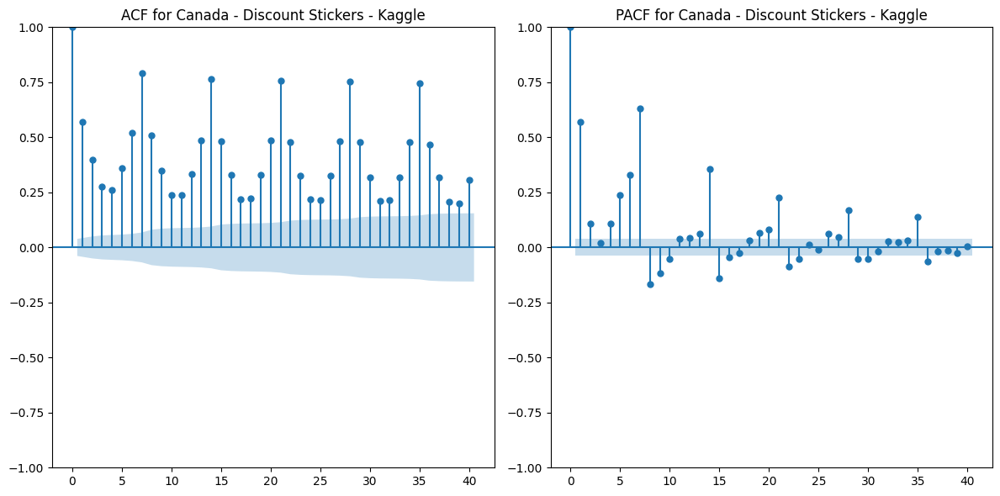

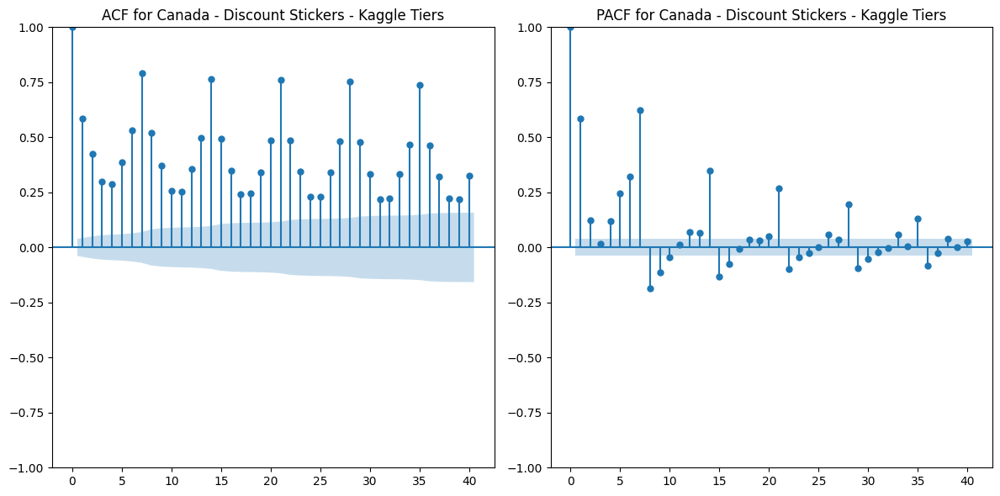

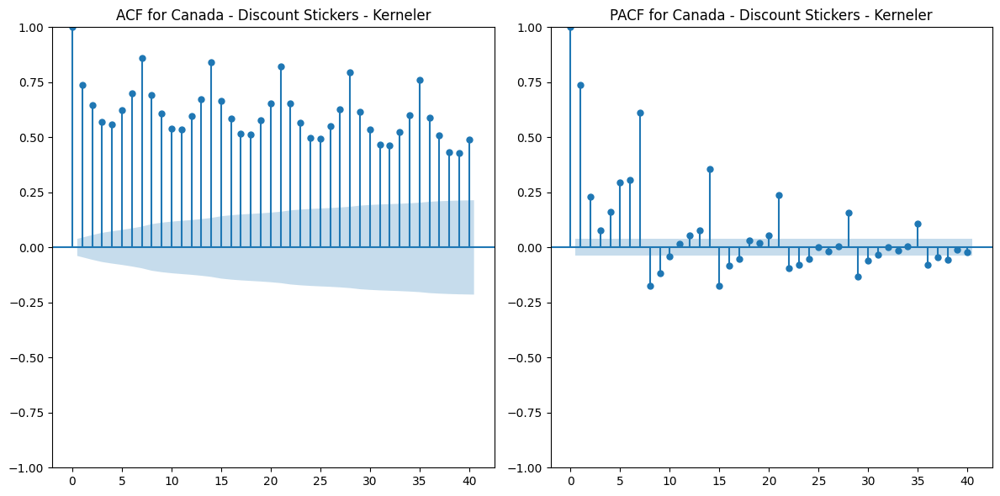

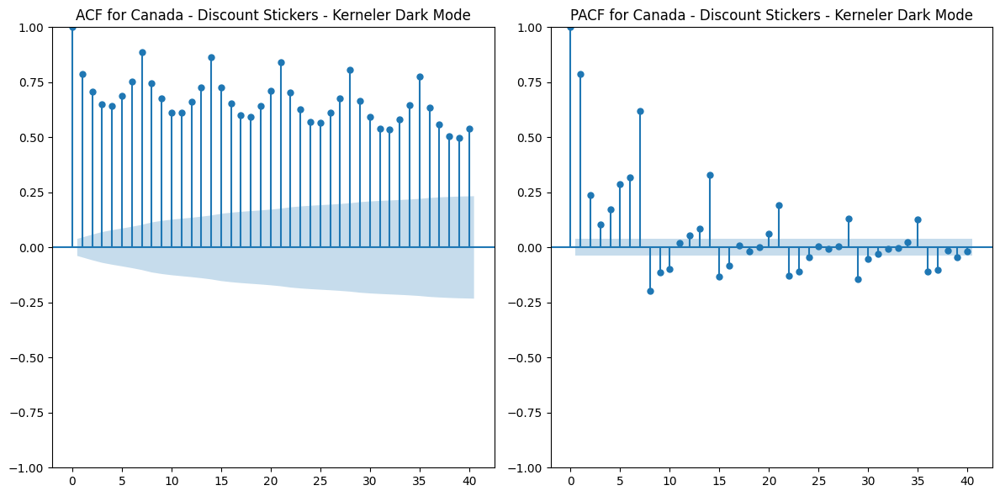

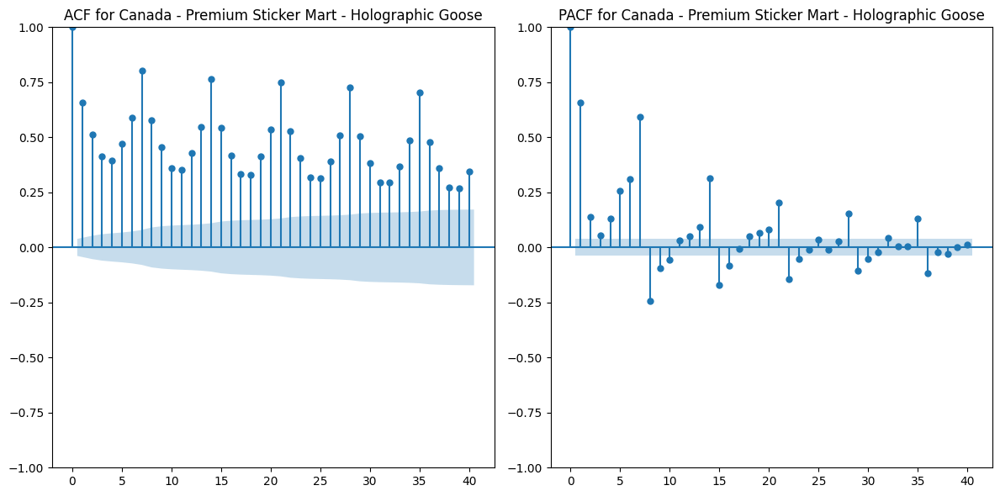

...

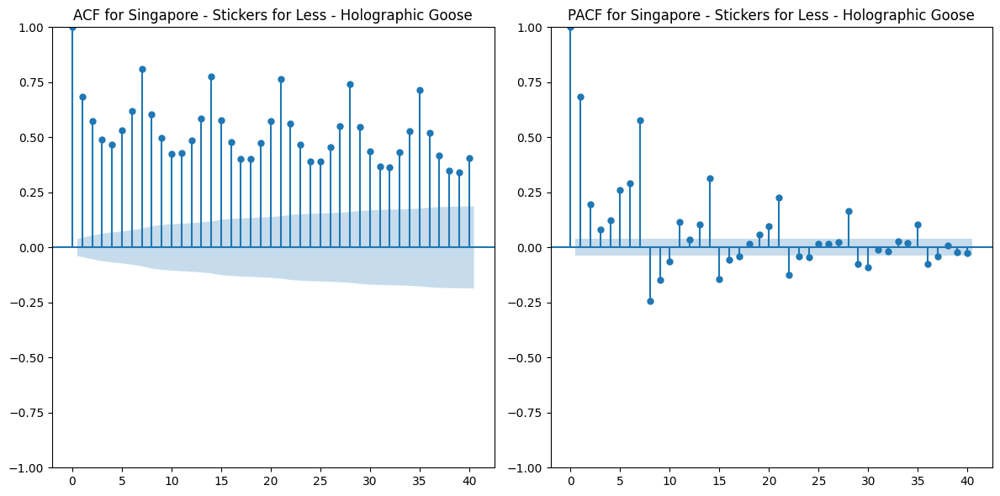

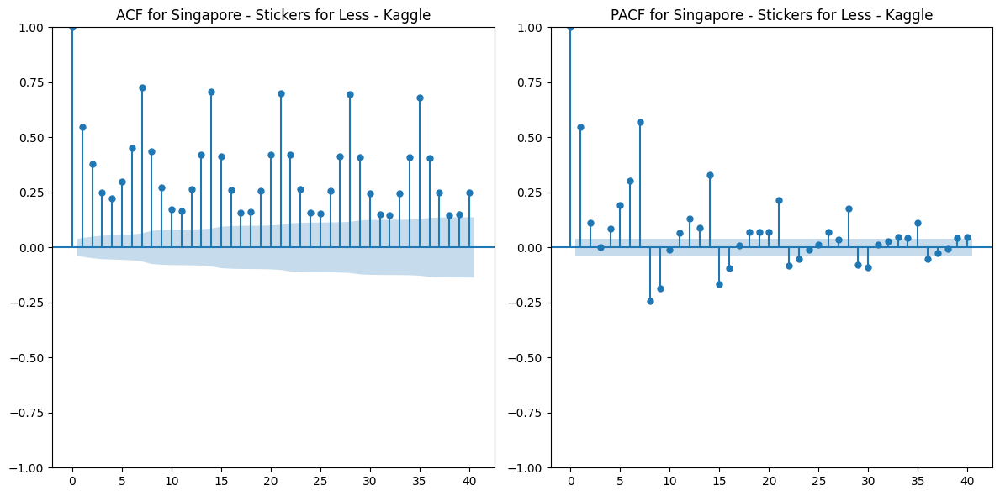

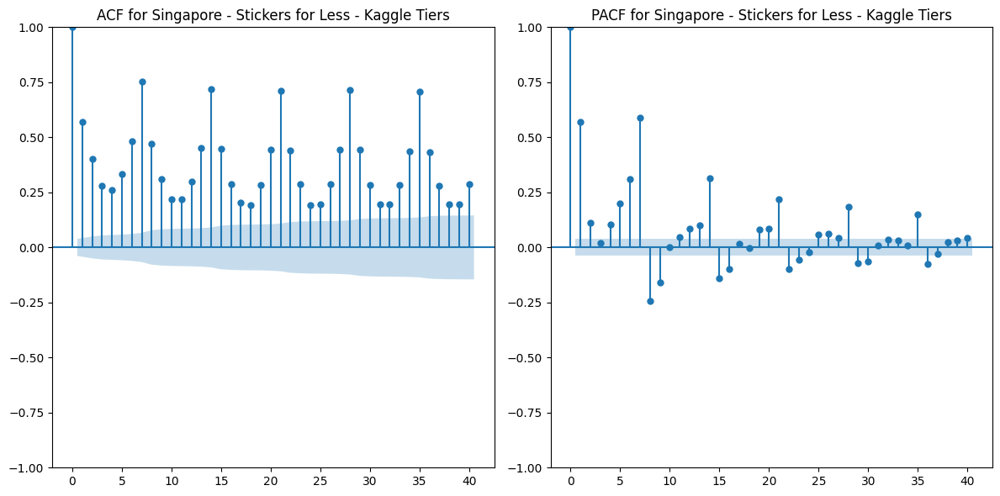

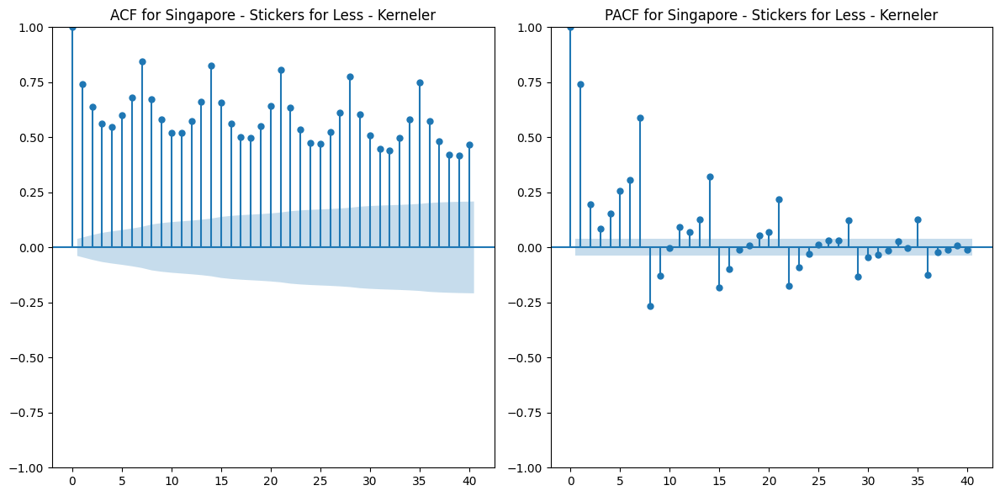

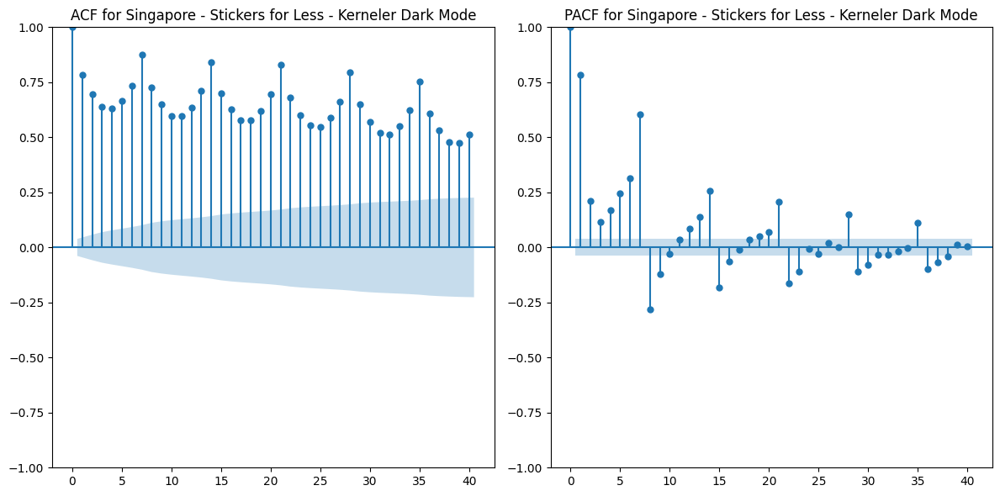

In [ ]:
for (country, store, product), group_data in stat_df.groupby(['country', 'store', 'product']):
    series = group_data['num_sold'].dropna()

    # ACF 플롯
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plot_acf(series, lags=40, ax=plt.gca())
    plt.title(f"ACF for {country} - {store} - {product}")

    # PACF 플롯
    plt.subplot(1, 2, 2)
    plot_pacf(series, lags=40, ax=plt.gca())
    plt.title(f"PACF for {country} - {store} - {product}")

    plt.tight_layout()
    plt.show()

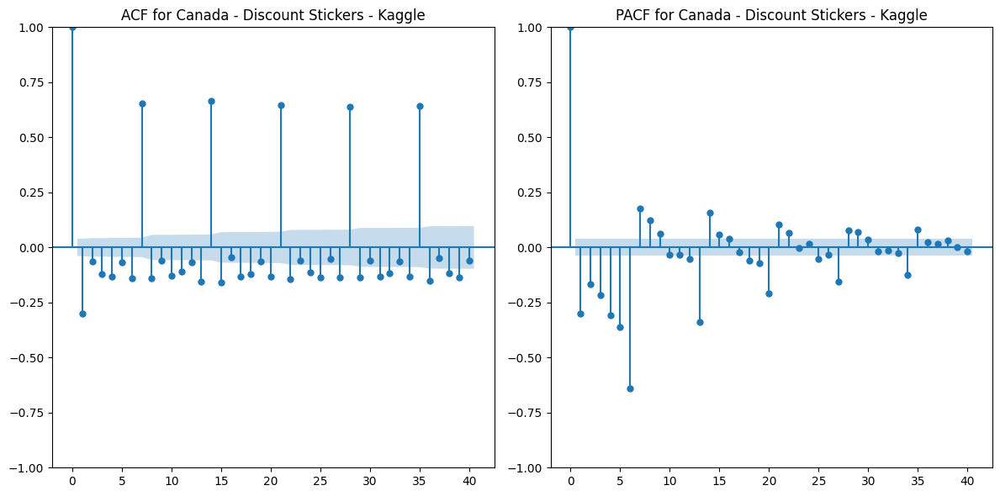

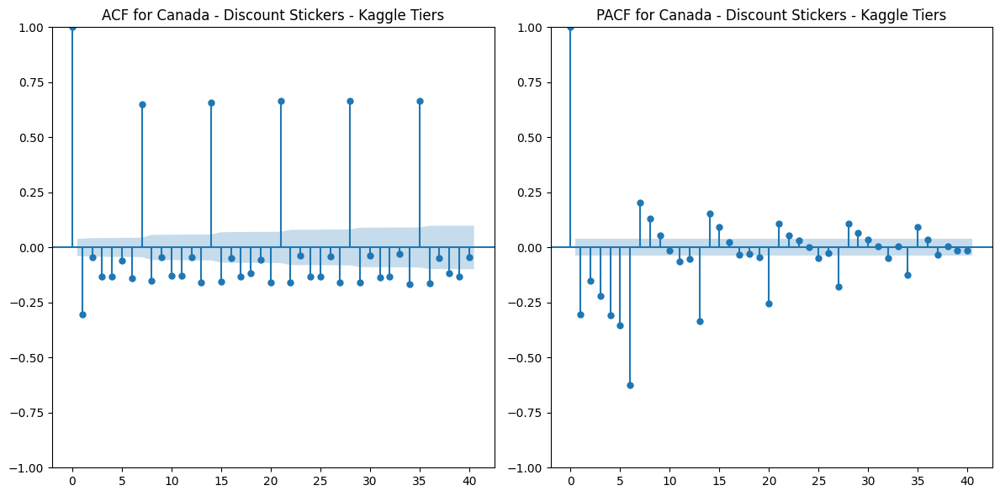

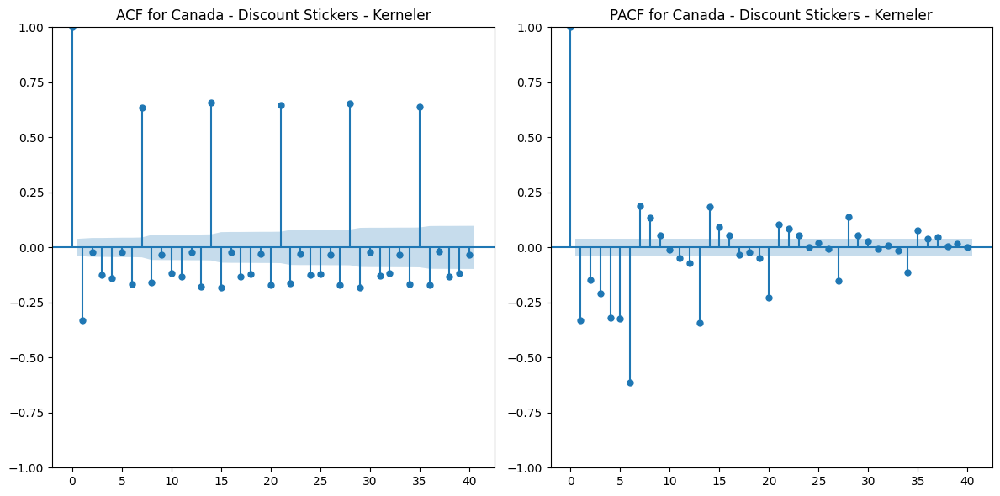

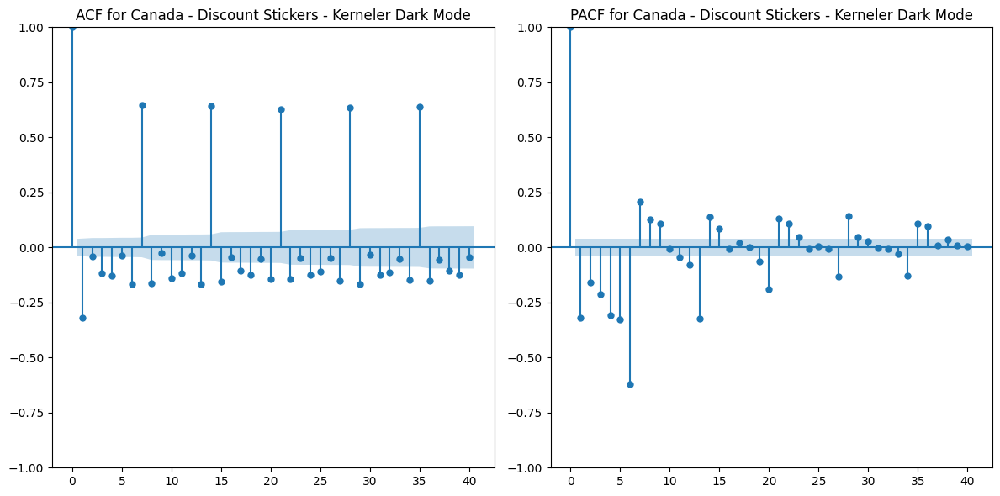

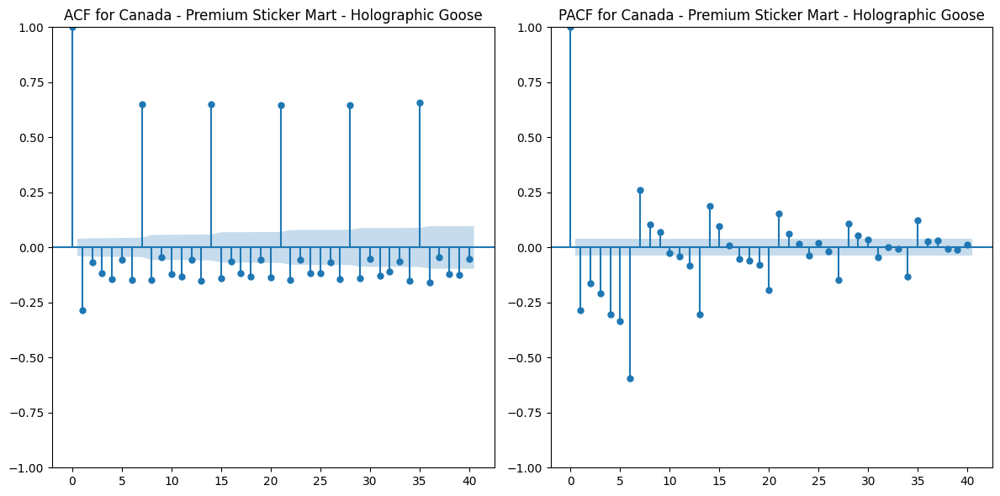

...

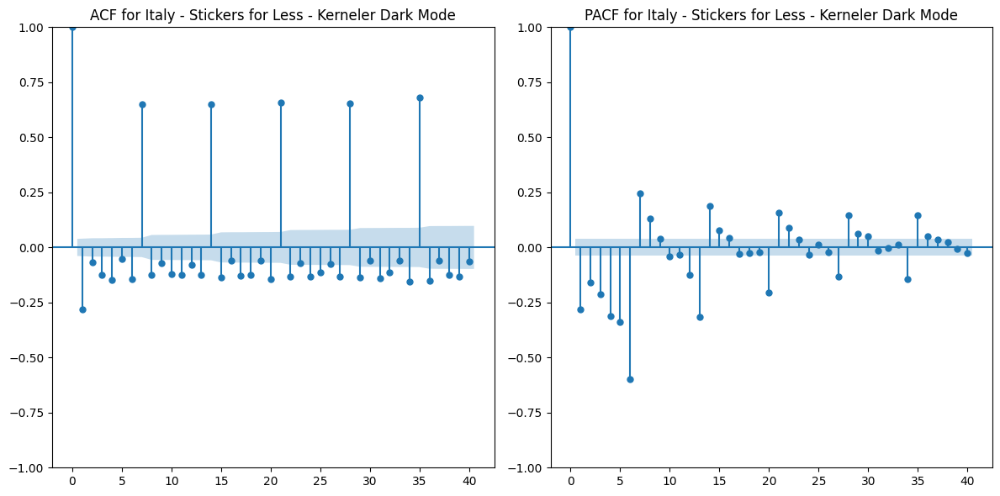

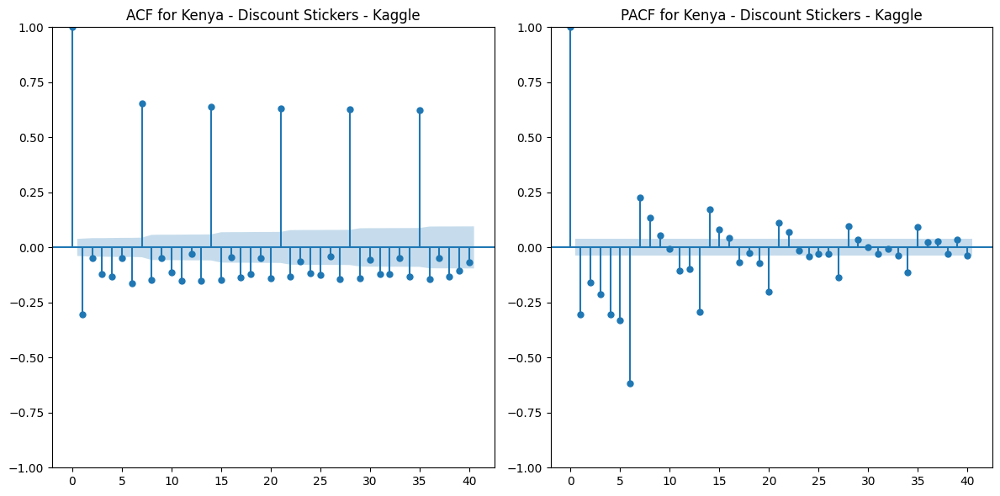

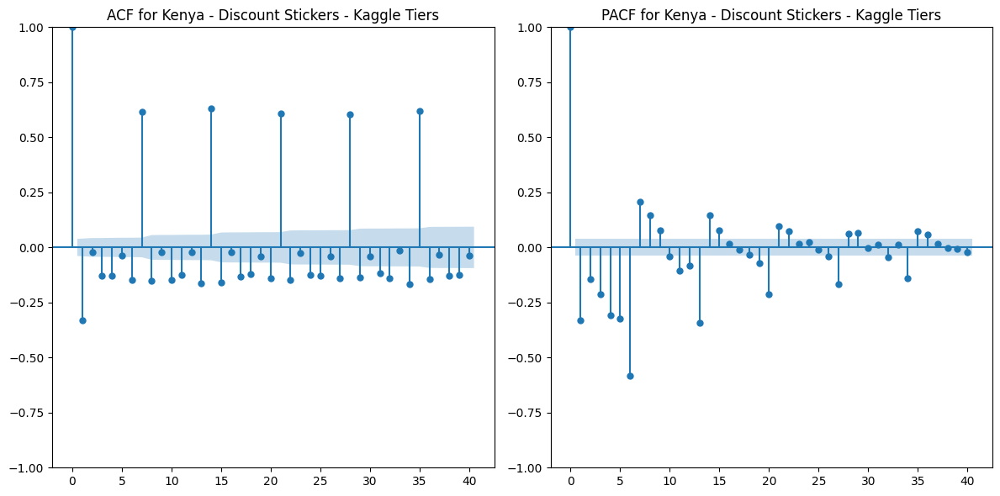

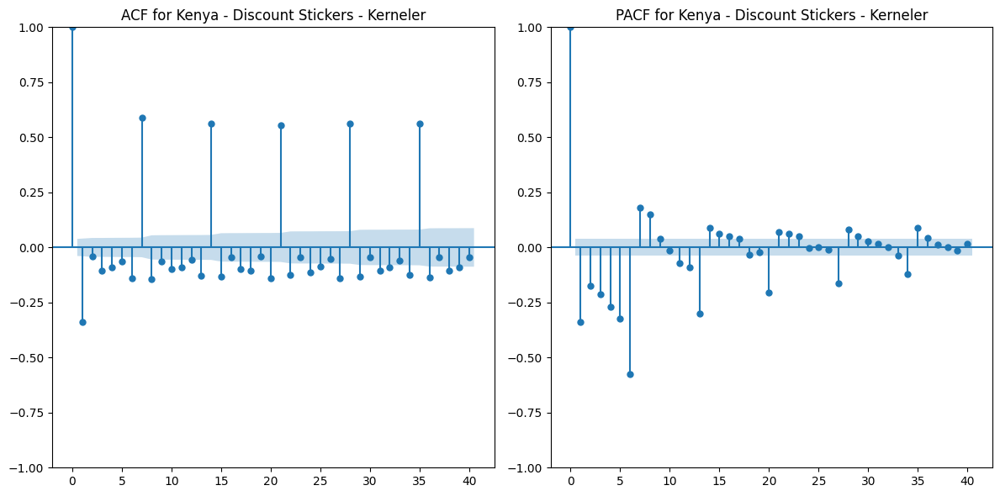

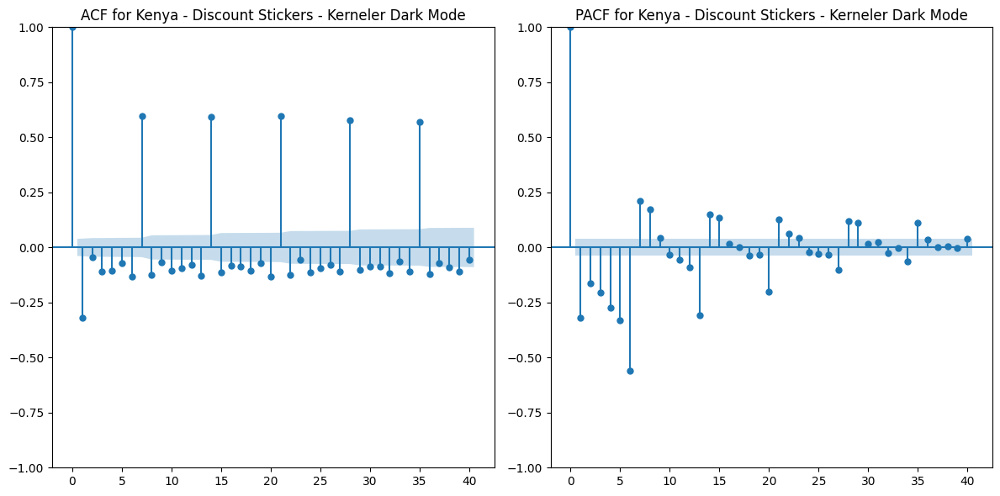

KeyboardInterrupt: 

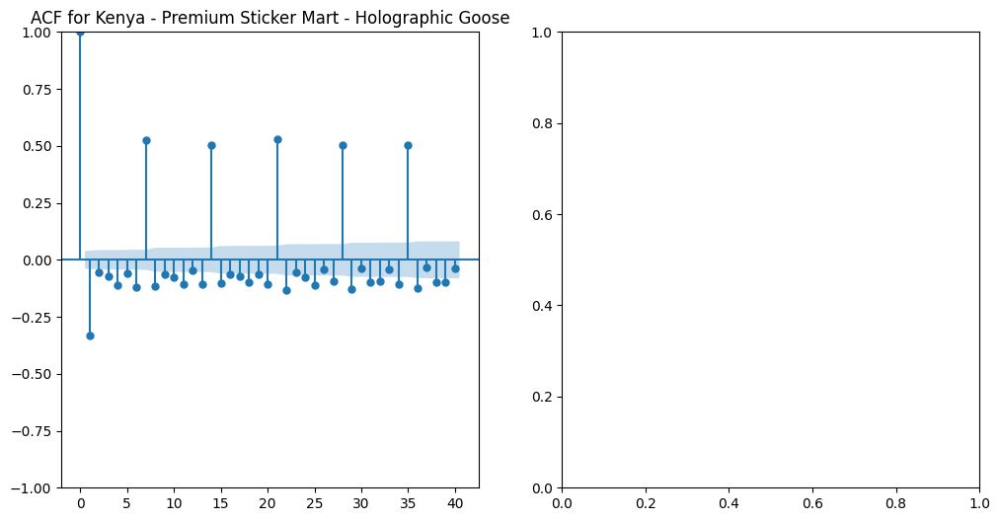

In [ ]:
for (country, store, product), group_data in diff_df.groupby(['country', 'store', 'product']):
    series = group_data['diff1_num_sold'].dropna()  # 결측값 제거

    # ACF 플롯
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plot_acf(series, lags=40, ax=plt.gca())
    plt.title(f"ACF for {country} - {store} - {product}")

    # PACF 플롯
    plt.subplot(1, 2, 2)
    plot_pacf(series, lags=40, ax=plt.gca())
    plt.title(f"PACF for {country} - {store} - {product}")

    plt.tight_layout()
    plt.show()

###2.1.4 fitting

In [ ]:
#파라미터 찾기

df_index = df_cleaned.set_index('date', inplace=False)

grouped_df = df_index.groupby(['country', 'store', 'product'])

for (country, store, product), group_data in grouped_df:
    series = group_data['num_sold']

    model = pm.auto_arima(series, seasonal = True, stepwise = True, trace = False, method='lbfgs')

    print(f"Country: {country}, Store: {store}, Product: {product}")
    print(model.summary())

Country: Canada, Store: Discount Stickers, Product: Kaggle
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2557
Model:               SARIMAX(5, 1, 2)   Log Likelihood              -13998.409
Date:                Mon, 27 Jan 2025   AIC                          28012.819
Time:                        12:57:52   BIC                          28059.588
Sample:                    01-01-2010   HQIC                         28029.779
                         - 12-31-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3110      0.016     19.288      0.000       0.279       0.343
ar.L2         -0.5347      0.018    -29.452      0.000      -0.570      

In [ ]:
# Decoding function
country_map = {1: 'Canada', 2: 'Finland', 3: 'Italy', 4: 'Kenya', 5: 'Norway', 6: 'Singapore'}
store_map = {1: 'Discount Stickers', 2: 'Premium Sticker Mart', 3: 'Stickers for Less'}
product_map = {1: 'Holographic Goose', 2: 'Kaggle', 3: 'Kaggle Tiers', 4: 'Kerneler', 5: 'Kerneler Dark Mode'}

def decode(c, s, p):
    country = country_map.get(c, "Unknown")
    store = store_map.get(s, "Unknown")
    product = product_map.get(p, "Unknown")
    return (country, store, product)

def decode_group(group):
    return [decode(c, s, p) for c, s, p in group]

# ARIMA parameters for group1 to group13
arima_params = [(2, 1, 3), (2, 1, 4), (2, 1, 5), (3, 1, 2), (3, 1, 3), (3, 1, 5), (4, 1, 3), (4, 1, 4), (4, 1, 5), (5, 1, 2), (5, 1, 3), (5, 1, 4), (5, 1, 5)]

# Define groups by parameters
group0 = [(1, 1, 1), (4, 1, 1)]
group1 = [(1, 3, 3), (2, 3, 2), (3, 3, 2), (5, 1, 2), (5, 2, 3), (6, 2, 3)]
group2 = [(1, 1, 5), (1, 2, 2), (2, 2, 1), (3, 3, 3), (5, 1, 1), (5, 1, 3), (6, 3, 1)]
group3 = [(2, 2, 2), (6, 2, 5)]
group4 = [(1, 1, 3), (2, 3, 3)]
group5 = [(1, 2, 3), (1, 3, 2), (3, 3, 1), (4, 2, 3), (6, 1, 4)]
group6 = [(4, 1, 5)]
group7 = [(2, 2, 3)]
group8 = [(3, 1, 3), (4, 1, 2), (4, 1, 3)]
group9 = [(1, 2, 1), (4, 3, 5)]
group10 = [(1, 1, 2), (1, 1, 4), (1, 2, 4), (1, 2, 5), (1, 3, 1), (1, 3, 4), (1, 3, 5), (2, 1, 2), (2, 1, 3), (2, 1, 4), (2, 1, 5), (2, 2, 4), (2, 2, 5), (2, 3, 1), (2, 3, 4), (3, 1, 2), (3, 1, 4), (3, 1, 5), (3, 2, 1), (3, 2, 2), (3, 2, 3), (3, 2, 4), (3, 2, 5), (3, 3, 4), (3, 3, 5), (4, 2, 1), (4, 2, 5), (4, 3, 1), (4, 3, 2), (4, 3, 3), (4, 3, 4), (5, 1, 4), (5, 1, 5), (5, 2, 1), (5, 2, 5), (5, 3, 1), (5, 3, 3), (5, 3, 4), (5, 3, 5), (6, 1, 2), (6, 1, 3), (6, 1, 5), (6, 2, 1), (6, 2, 2), (6, 2, 4), (6, 3, 2), (6, 3, 3), (6, 3, 4), (6, 3, 5)]
group11 = [(2, 1, 1), (4, 2, 2), (5, 2, 2), (5, 3, 2)]
group12 = [(4, 1, 4), (6, 1, 1)]
group13 = [(2, 3, 5), (3, 1, 1), (4, 2, 4), (5, 2, 4)]

decode_group(group1)

[('Canada', 'Stickers for Less', 'Kaggle Tiers'),
 ('Finland', 'Stickers for Less', 'Kaggle'),
 ('Italy', 'Stickers for Less', 'Kaggle'),
 ('Norway', 'Discount Stickers', 'Kaggle'),
 ('Norway', 'Premium Sticker Mart', 'Kaggle Tiers'),
 ('Singapore', 'Premium Sticker Mart', 'Kaggle Tiers')]

In [ ]:
#group1

warnings.filterwarnings("ignore")

predictions = []

# group1에 해당하는 group만 예측하도록 필터링
decoded_group1 = decode_group(group1)

for (country, store, product), group_data in grouped_df:
    # 그룹을 순회하며 각 그룹의 예측을 수행
    if (country, store, product) in decoded_group1:
        series = group_data['num_sold']
        p, d, q = arima_params[0]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        # 예측 (2017년부터 2019년까지의 1,095일 예측)
        forecast = model_fit.forecast(steps=1095)

        # 예측 결과에 해당하는 날짜를 계산
        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        # 예측된 결과를 'test' 데이터프레임의 해당하는 날짜, country, store, product에 매핑
        for i, date in enumerate(forecast_dates):
            # 예측값과 날짜를 test 데이터에 맞게 매핑
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

# 예측된 데이터로 새로운 DataFrame 생성
group1_predicted_df = pd.DataFrame(predictions)

# 예측된 결과 확인
group1_predicted_df

,date,country,store,product,predict
0,2017-01-01,Canada,Stickers for Less,Kaggle Tiers,1198.155757
1,2017-01-02,Canada,Stickers for Less,Kaggle Tiers,1004.093129
2,2017-01-03,Canada,Stickers for Less,Kaggle Tiers,1035.595826
3,2017-01-04,Canada,Stickers for Less,Kaggle Tiers,1108.300720
4,2017-01-05,Canada,Stickers for Less,Kaggle Tiers,1040.607418
...,...,...,...,...,...
6565,2019-12-27,Singapore,Premium Sticker Mart,Kaggle Tiers,1688.962647
6566,2019-12-28,Singapore,Premium Sticker Mart,Kaggle Tiers,1688.962647
6567,2019-12-29,Singapore,Premium Sticker Mart,Kaggle Tiers,1688.962647
6568,2019-12-30,Singapore,Premium Sticker Mart,Kaggle Tiers,1688.962647


In [ ]:
#group2

predictions = []
decoded_group2 = decode_group(group2)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group2:
        series = group_data['num_sold']
        p, d, q = arima_params[1]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group2_predicted_df = pd.DataFrame(predictions)
group2_predicted_df

,date,country,store,product,predict
0,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,440.201091
1,2017-01-02,Canada,Discount Stickers,Kerneler Dark Mode,428.023688
2,2017-01-03,Canada,Discount Stickers,Kerneler Dark Mode,407.583804
3,2017-01-04,Canada,Discount Stickers,Kerneler Dark Mode,399.762974
4,2017-01-05,Canada,Discount Stickers,Kerneler Dark Mode,410.413293
...,...,...,...,...,...
7660,2019-12-27,Singapore,Stickers for Less,Holographic Goose,338.429262
7661,2019-12-28,Singapore,Stickers for Less,Holographic Goose,339.502991
7662,2019-12-29,Singapore,Stickers for Less,Holographic Goose,338.855241
7663,2019-12-30,Singapore,Stickers for Less,Holographic Goose,336.980529


In [ ]:
#group3

predictions = []
decoded_group3 = decode_group(group3)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group3:
        series = group_data['num_sold']
        p, d, q = arima_params[2]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group3_predicted_df = pd.DataFrame(predictions)
group3_predicted_df

,date,country,store,product,predict
0,2017-01-01,Finland,Premium Sticker Mart,Kaggle,2138.032832
1,2017-01-02,Finland,Premium Sticker Mart,Kaggle,1919.790579
2,2017-01-03,Finland,Premium Sticker Mart,Kaggle,1796.865100
3,2017-01-04,Finland,Premium Sticker Mart,Kaggle,1890.984753
4,2017-01-05,Finland,Premium Sticker Mart,Kaggle,1840.810143
...,...,...,...,...,...
2185,2019-12-27,Singapore,Premium Sticker Mart,Kerneler Dark Mode,1502.922716
2186,2019-12-28,Singapore,Premium Sticker Mart,Kerneler Dark Mode,1534.771898
2187,2019-12-29,Singapore,Premium Sticker Mart,Kerneler Dark Mode,1546.086691
2188,2019-12-30,Singapore,Premium Sticker Mart,Kerneler Dark Mode,1528.390175


In [ ]:
#group4

predictions = []
decoded_group4 = decode_group(group4)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group4:
        series = group_data['num_sold']
        p, d, q = arima_params[3]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group4_predicted_df = pd.DataFrame(predictions)
group4_predicted_df

,date,country,store,product,predict
0,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,681.609271
1,2017-01-02,Canada,Discount Stickers,Kaggle Tiers,634.551628
2,2017-01-03,Canada,Discount Stickers,Kaggle Tiers,623.040335
3,2017-01-04,Canada,Discount Stickers,Kaggle Tiers,599.823908
4,2017-01-05,Canada,Discount Stickers,Kaggle Tiers,611.472127
...,...,...,...,...,...
2185,2019-12-27,Finland,Stickers for Less,Kaggle Tiers,1496.286735
2186,2019-12-28,Finland,Stickers for Less,Kaggle Tiers,1499.444336
2187,2019-12-29,Finland,Stickers for Less,Kaggle Tiers,1502.478011
2188,2019-12-30,Finland,Stickers for Less,Kaggle Tiers,1503.115665


In [ ]:
#group5

predictions = []
decoded_group5 = decode_group(group5)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group5:
        series = group_data['num_sold']
        p, d, q = arima_params[4]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group5_predicted_df = pd.DataFrame(predictions)
group5_predicted_df

,date,country,store,product,predict
0,2017-01-01,Canada,Premium Sticker Mart,Kaggle Tiers,1506.726736
1,2017-01-02,Canada,Premium Sticker Mart,Kaggle Tiers,1443.732743
2,2017-01-03,Canada,Premium Sticker Mart,Kaggle Tiers,1336.862109
3,2017-01-04,Canada,Premium Sticker Mart,Kaggle Tiers,1295.467504
4,2017-01-05,Canada,Premium Sticker Mart,Kaggle Tiers,1347.146820
...,...,...,...,...,...
5470,2019-12-27,Singapore,Discount Stickers,Kerneler,483.048891
5471,2019-12-28,Singapore,Discount Stickers,Kerneler,500.971414
5472,2019-12-29,Singapore,Discount Stickers,Kerneler,500.887207
5473,2019-12-30,Singapore,Discount Stickers,Kerneler,482.868641


In [ ]:
#group6

predictions = []
decoded_group6 = decode_group(group6)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group6:
        series = group_data['num_sold']
        p, d, q = arima_params[5]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group6_predicted_df = pd.DataFrame(predictions)
group6_predicted_df

,date,country,store,product,predict
0,2017-01-01,Kenya,Discount Stickers,Kerneler Dark Mode,13.698121
1,2017-01-02,Kenya,Discount Stickers,Kerneler Dark Mode,13.318989
2,2017-01-03,Kenya,Discount Stickers,Kerneler Dark Mode,12.615516
3,2017-01-04,Kenya,Discount Stickers,Kerneler Dark Mode,12.340530
4,2017-01-05,Kenya,Discount Stickers,Kerneler Dark Mode,12.778997
...,...,...,...,...,...
1090,2019-12-27,Kenya,Discount Stickers,Kerneler Dark Mode,13.368111
1091,2019-12-28,Kenya,Discount Stickers,Kerneler Dark Mode,13.498367
1092,2019-12-29,Kenya,Discount Stickers,Kerneler Dark Mode,13.430940
1093,2019-12-30,Kenya,Discount Stickers,Kerneler Dark Mode,13.217004


In [ ]:
#group7

predictions = []
decoded_group7 = decode_group(group7)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group7:
        series = group_data['num_sold']
        p, d, q = arima_params[6]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group7_predicted_df = pd.DataFrame(predictions)
group7_predicted_df

,date,country,store,product,predict
0,2017-01-01,Finland,Premium Sticker Mart,Kaggle Tiers,1793.894514
1,2017-01-02,Finland,Premium Sticker Mart,Kaggle Tiers,1635.458416
2,2017-01-03,Finland,Premium Sticker Mart,Kaggle Tiers,1619.855470
3,2017-01-04,Finland,Premium Sticker Mart,Kaggle Tiers,1584.796742
4,2017-01-05,Finland,Premium Sticker Mart,Kaggle Tiers,1594.107246
...,...,...,...,...,...
1090,2019-12-27,Finland,Premium Sticker Mart,Kaggle Tiers,1654.254559
1091,2019-12-28,Finland,Premium Sticker Mart,Kaggle Tiers,1654.532516
1092,2019-12-29,Finland,Premium Sticker Mart,Kaggle Tiers,1655.056106
1093,2019-12-30,Finland,Premium Sticker Mart,Kaggle Tiers,1655.431886


In [ ]:
#group8

predictions = []
decoded_group8 = decode_group(group8)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group8:
        series = group_data['num_sold']
        p, d, q = arima_params[7]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group8_predicted_df = pd.DataFrame(predictions)
group8_predicted_df

,date,country,store,product,predict
0,2017-01-01,Italy,Discount Stickers,Kaggle Tiers,441.890043
1,2017-01-02,Italy,Discount Stickers,Kaggle Tiers,432.336182
2,2017-01-03,Italy,Discount Stickers,Kaggle Tiers,398.718914
3,2017-01-04,Italy,Discount Stickers,Kaggle Tiers,392.018108
4,2017-01-05,Italy,Discount Stickers,Kaggle Tiers,403.582548
...,...,...,...,...,...
3280,2019-12-27,Kenya,Discount Stickers,Kaggle Tiers,19.308286
3281,2019-12-28,Kenya,Discount Stickers,Kaggle Tiers,19.537712
3282,2019-12-29,Kenya,Discount Stickers,Kaggle Tiers,19.405093
3283,2019-12-30,Kenya,Discount Stickers,Kaggle Tiers,19.010942


In [ ]:
#group9

predictions = []
decoded_group9 = decode_group(group9)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group9:
        series = group_data['num_sold']
        p, d, q = arima_params[8]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group9_predicted_df = pd.DataFrame(predictions)
group9_predicted_df

,date,country,store,product,predict
0,2017-01-01,Canada,Premium Sticker Mart,Holographic Goose,305.306281
1,2017-01-02,Canada,Premium Sticker Mart,Holographic Goose,269.725595
2,2017-01-03,Canada,Premium Sticker Mart,Holographic Goose,271.283041
3,2017-01-04,Canada,Premium Sticker Mart,Holographic Goose,255.340361
4,2017-01-05,Canada,Premium Sticker Mart,Holographic Goose,272.152353
...,...,...,...,...,...
2185,2019-12-27,Kenya,Stickers for Less,Kerneler Dark Mode,27.929413
2186,2019-12-28,Kenya,Stickers for Less,Kerneler Dark Mode,28.798788
2187,2019-12-29,Kenya,Stickers for Less,Kerneler Dark Mode,28.745824
2188,2019-12-30,Kenya,Stickers for Less,Kerneler Dark Mode,27.810954


In [ ]:
#group10

predictions = []
decoded_group10 = decode_group(group10)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group10:
        series = group_data['num_sold']
        p, d, q = arima_params[9]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group10_predicted_df = pd.DataFrame(predictions)
group10_predicted_df

,date,country,store,product,predict
0,2017-01-01,Canada,Discount Stickers,Kaggle,929.583074
1,2017-01-02,Canada,Discount Stickers,Kaggle,882.037537
2,2017-01-03,Canada,Discount Stickers,Kaggle,821.732738
3,2017-01-04,Canada,Discount Stickers,Kaggle,802.067942
4,2017-01-05,Canada,Discount Stickers,Kaggle,848.861293
...,...,...,...,...,...
53650,2019-12-27,Singapore,Stickers for Less,Kerneler Dark Mode,1252.707732
53651,2019-12-28,Singapore,Stickers for Less,Kerneler Dark Mode,1254.234041
53652,2019-12-29,Singapore,Stickers for Less,Kerneler Dark Mode,1252.689815
53653,2019-12-30,Singapore,Stickers for Less,Kerneler Dark Mode,1249.251630


In [ ]:
#group11

predictions = []
decoded_group11 = decode_group(group11)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group11:
        series = group_data['num_sold']
        p, d, q = arima_params[10]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group11_predicted_df = pd.DataFrame(predictions)
group11_predicted_df

,date,country,store,product,predict
0,2017-01-01,Finland,Discount Stickers,Holographic Goose,146.175807
1,2017-01-02,Finland,Discount Stickers,Holographic Goose,137.313392
2,2017-01-03,Finland,Discount Stickers,Holographic Goose,128.296536
3,2017-01-04,Finland,Discount Stickers,Holographic Goose,126.810691
4,2017-01-05,Finland,Discount Stickers,Holographic Goose,131.969030
...,...,...,...,...,...
4375,2019-12-27,Norway,Stickers for Less,Kaggle,2825.137561
4376,2019-12-28,Norway,Stickers for Less,Kaggle,2837.285506
4377,2019-12-29,Norway,Stickers for Less,Kaggle,2829.013092
4378,2019-12-30,Norway,Stickers for Less,Kaggle,2806.616156


In [ ]:
#group12

predictions = []
decoded_group12 = decode_group(group12)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group12:
        series = group_data['num_sold']
        p, d, q = arima_params[11]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group12_predicted_df = pd.DataFrame(predictions)
group12_predicted_df

,date,country,store,product,predict
0,2017-01-01,Kenya,Discount Stickers,Kerneler,13.525545
1,2017-01-02,Kenya,Discount Stickers,Kerneler,12.703640
2,2017-01-03,Kenya,Discount Stickers,Kerneler,12.246962
3,2017-01-04,Kenya,Discount Stickers,Kerneler,11.926206
4,2017-01-05,Kenya,Discount Stickers,Kerneler,12.062084
...,...,...,...,...,...
2185,2019-12-27,Singapore,Discount Stickers,Holographic Goose,173.416140
2186,2019-12-28,Singapore,Discount Stickers,Holographic Goose,175.239740
2187,2019-12-29,Singapore,Discount Stickers,Holographic Goose,174.746833
2188,2019-12-30,Singapore,Discount Stickers,Holographic Goose,172.314168


In [ ]:
#group13

predictions = []
decoded_group13 = decode_group(group13)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group13:
        series = group_data['num_sold']
        p, d, q = arima_params[12]
        model = ARIMA(series, order=(p, d, q), freq='D')
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=1095)

        last_date = '2016-12-31'
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast[i]
            })

group13_predicted_df = pd.DataFrame(predictions)
group13_predicted_df

,date,country,store,product,predict
0,2017-01-01,Finland,Stickers for Less,Kerneler Dark Mode,1050.524312
1,2017-01-02,Finland,Stickers for Less,Kerneler Dark Mode,985.731411
2,2017-01-03,Finland,Stickers for Less,Kerneler Dark Mode,953.285409
3,2017-01-04,Finland,Stickers for Less,Kerneler Dark Mode,941.775821
4,2017-01-05,Finland,Stickers for Less,Kerneler Dark Mode,964.790268
...,...,...,...,...,...
4375,2019-12-27,Norway,Premium Sticker Mart,Kerneler,1492.066031
4376,2019-12-28,Norway,Premium Sticker Mart,Kerneler,1499.372625
4377,2019-12-29,Norway,Premium Sticker Mart,Kerneler,1496.722879
4378,2019-12-30,Norway,Premium Sticker Mart,Kerneler,1486.146006


###2.1.5 Submission

In [ ]:
arima_pred = pd.concat([group1_predicted_df, group2_predicted_df, group3_predicted_df, group4_predicted_df, group5_predicted_df, group6_predicted_df, group7_predicted_df, group8_predicted_df, group9_predicted_df, group10_predicted_df, group11_predicted_df, group12_predicted_df, group13_predicted_df],  axis=0, ignore_index=True)

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/방학프로젝트/test.csv', parse_dates=['date'])
test.head()

,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode


In [ ]:
test_pred = pd.merge(test, arima_pred, on=['date', 'country', 'store', 'product'], how='left')
test_pred = test_pred.fillna(0)

In [ ]:
submission = pd.read_csv('/content/drive/MyDrive/방학프로젝트/sample_submission.csv')
submission['num_sold'] = test_pred['predict']
submission.to_csv('arima_submission.csv', index = False)

##2.2 Light GBM (Leaderboard Score: 0.11263%)

### 2.2.1 피처 생성

In [ ]:
# 숫자형 피처 왜곡도 조사
from scipy.stats import skew

print('num_sold skewed:',skew(df_cleaned['num_sold']))
print('nominal gdp skewed:',skew(df_cleaned['nominal gdp']))
print('nominal gdp per capita skewed:',skew(df_cleaned['nominal gdp per capita']))
print('growth rate skewed:',skew(df_cleaned['growth rate']))

num_sold skewed: 1.4273107852844966
nominal gdp skewed: 0.7403394726365334
nominal gdp per capita skewed: 0.15210830626391983
growth rate skewed: 1.5543169260069984


- date, month, weekday 칼럼 생성

In [ ]:
# 새 피처를 생성하기 위해 전처리 복사본 사용
df_cleaned_2 = df_cleaned.copy()
df_cleaned_2['date'] = pd.to_datetime(df_cleaned_2['date'])
df_cleaned_2['month'] = df['date'].dt.month
df_cleaned_2['weekday'] = df['date'].dt.dayofweek
df_cleaned_2.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate,holiday,month,weekday
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09,1,1,4
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09,1,1,4
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09,1,1,4
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09,1,1,4
5,5,2010-01-01,Canada,Stickers for Less,Holographic Goose,300.0,2010,1620000000000,47600,3.09,1,1,4


- LGBM 회귀 모델은 물론 알아서 이 데이터 같은 비선형 패턴을 파악할 수 있지만, 명시적인 주기(즉, 도메인 지식)를 아는 경우 피처를 직접 추가하면 학습성능에 도움이 된다 함. 따라서 직접 추가. 👽

- 주기와 계절성을 가중치로 반영해 추가한 피처
>  1. 월별 가중치 피처
    - 각 제품 별 가장 판매량 많은 달:1.5,  나머지:1
   1. 요일별 가중치 피처: 주말 판매량이 높은 것을 반영함.  
    - 주말:1.5 , 평일:1
    - 요일의 주기성(7일)은 사인/코사인 변환으로 반영
   1. 1년/2년 계절성 피처-> 사인/코사인 변환으로 계절정 패턴을 수치화할 수 있음.
    - 각 제품 별 주기성을 반영해 사인/코사인 변환
   1. 주기성 피처 ✖ 요일: 상호작용 변수 추가.
   요일+주기성이 같이 작용하면서 미치는 영향 고려함.

- (주간 주기성을 반영하기 위해 7일 전 값을 추가(Lag Feature) & 7일 동안의 이동 평균을 계산하여 주간 패턴을 반영 시도 -> 결측값 제거시 670번대부터 시작하므로 적용 안함.)

- 앞의 ACF, PCAF 분석으로 알아낸 결과를 반영(생성된 도메인)

```
  - Holographic Goose: 12,1월 판매량 많음, 1년 주기(계절성)
  - Kaggle: 5,6,7월 판매량 많음, 2년 주기
  - Kaggle Tiers: 12,1월 판매량 많음, 2년 주기
  - Kerneler: 8,9,10월 판매량 많음, 1년 주기
  - Kerneler Dark Mode: 3,4,5월 판매량 많음, 1년 주기
```

In [ ]:
# 1. 월별 가중치 피처
df_cleaned_2['month_weight']=1
df_cleaned_2.loc[(df_cleaned_2['product']=='Holographic Goose')&(df_cleaned_2['month'].isin([12,1])),'month_weight']=1.5
df_cleaned_2.loc[(df_cleaned_2['product']=='Kaggle')&(df_cleaned_2['month'].isin([5,6,7])),'month_weight']=1.5
df_cleaned_2.loc[(df_cleaned_2['product']=='Kaggle Tiers')&(df_cleaned_2['month'].isin([12,1])),'month_weight']=1.5
df_cleaned_2.loc[(df_cleaned_2['product']=='Kerneler')&(df_cleaned_2['month'].isin([8,9,10])),'month_weight']=2
df_cleaned_2.loc[(df_cleaned_2['product']=='Kerneler Dark Mode')&(df_cleaned_2['month'].isin([3,4,5])),'month_weight']=2

<ipython-input-19-e39a0aaa7198>:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_cleaned_2.loc[(df_cleaned_2['product']=='Holographic Goose')&(df_cleaned_2['month'].isin([12,1])),'month_weight']=1.5


In [ ]:
# 2. 요일별 가중치 피처 (평일:1, 주말:1.5)
weekday_weights = {0:1, 1:1, 2:1, 3:1, 4:1, 5:1.5, 6:1.5}
df_cleaned_2['weekday_weight'] = df_cleaned_2['weekday'].map(weekday_weights)
# df_cleaned_2.head()

In [ ]:
# 2-2. 요일의 주기성 반영 피처(사인변환)
df_cleaned_2['sin_week'] = np.sin(2 * np.pi * df_cleaned_2['weekday'] / 7)
df_cleaned_2['cos_week'] = np.cos(2 * np.pi * df_cleaned_2['weekday'] / 7)

In [ ]:
# 3. 1년/2년 주기성 피처

# 제품별 주기 매핑
product_cycles = {
    'Holographic Goose': 12,   # 1년 주기
    'Kaggle': 24,             # 2년 주기
    'Kaggle Tiers': 24,       # 2년 주기
    'Kerneler': 12,           # 1년 주기
    'Kerneler Dark Mode': 12  # 1년 주기
}
df_cleaned_2['cycle'] = df_cleaned_2['product'].map(product_cycles)

# 사인, 코사인 변환
df_cleaned_2['sin_cycle'] = np.sin(2 * np.pi * df_cleaned_2['month'] / df_cleaned_2['cycle'])
df_cleaned_2['cos_cycle'] = np.cos(2 * np.pi * df_cleaned_2['month'] / df_cleaned_2['cycle'])

In [ ]:
# 4.주기성(년도) 피처: 피처*요일
df_cleaned_2['cycleandweek'] = df_cleaned_2['sin_cycle'] * df_cleaned_2['weekday']

In [ ]:
# 원핫인코딩
df_cleaned_2 = pd.get_dummies(df_cleaned_2, columns=['country', 'store','product'])

In [ ]:
# 왜곡도가 1 이상인 피처 로그변환
df_cleaned_2['growth rate'] = np.log1p(df_cleaned_2['growth rate'])
df_cleaned_2['num_sold'] = np.log1p(df_cleaned_2['num_sold'])

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [ ]:
# id, date 칼럼 drop
df_cleaned_2 = df_cleaned_2.drop(columns=['date'])
df_cleaned_2 = df_cleaned_2.drop(columns=['id'])
df_cleaned_2.head()

,num_sold,year,nominal gdp,nominal gdp per capita,growth rate,holiday,month,weekday,month_weight,weekday_weight,...,country_Norway,country_Singapore,store_Discount Stickers,store_Premium Sticker Mart,store_Stickers for Less,product_Holographic Goose,product_Kaggle,product_Kaggle Tiers,product_Kerneler,product_Kerneler Dark Mode
1,6.881411,2010,1620000000000,47600,1.408545,1,1,4,1.0,1.0,...,False,False,True,False,False,False,True,False,False,False
2,6.810142,2010,1620000000000,47600,1.408545,1,1,4,1.5,1.0,...,False,False,True,False,False,False,False,True,False,False
3,6.049733,2010,1620000000000,47600,1.408545,1,1,4,1.0,1.0,...,False,False,True,False,False,False,False,False,True,False
4,6.198479,2010,1620000000000,47600,1.408545,1,1,4,1.0,1.0,...,False,False,True,False,False,False,False,False,False,True
5,5.707110,2010,1620000000000,47600,1.408545,1,1,4,1.5,1.0,...,False,False,False,False,True,True,False,False,False,False


- num_sold와 다른 피처 간 상관맵: 너무 상관 없는 피처를 삭제했더니 오히려 성능이 저하되어서 그냥 모든 피처 사용함

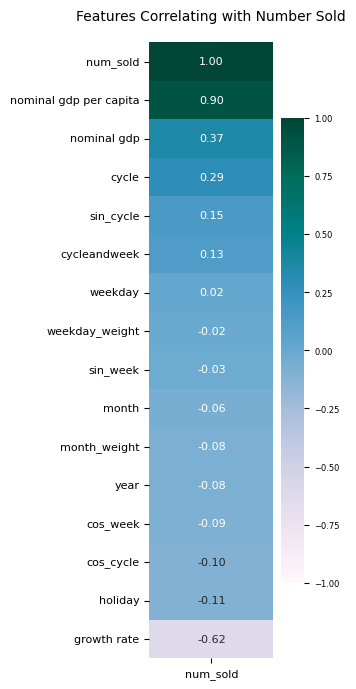

In [ ]:
num_vars = df_cleaned_2.select_dtypes("number").columns.to_list()
fig, ax = plt.subplots(figsize=(2, 8))
sns.heatmap(
    df_cleaned_2[num_vars]
    .corr()
    .corr()[["num_sold"]]
    .sort_values(by="num_sold", ascending=False),
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    cmap="PuBuGn",
    annot_kws={"fontsize": 8},
    cbar_kws={"shrink": 1},
    ax = ax
)
cbar_ax = fig.axes[-1]
cbar_ax.tick_params(labelsize=6)
ax.tick_params(labelsize=8)
ax.tick_params(labelsize=8)
ax.set_title(
    "Features Correlating with Number Sold", fontdict={"fontsize": 10}, pad=16
)
plt.show()

### 2.2.2 1차 모델링
- MAPE: 0.072

In [ ]:
# 다시 데이터 X,y 나누기 (검증용 test 데이터)
X = df_cleaned_2.drop(columns=['num_sold'])
y = df_cleaned_2[['num_sold', 'year']] #using 'year' as index

X_train = X[~(X['year'] == 2016)]
y_train = y[~(y['year'] == 2016)]
X_test = X[X['year'] == 2016]
y_test = y[y['year'] == 2016]

#drop 'year
y = y['num_sold']
y_train = y_train['num_sold']
y_test = y_test['num_sold']

print('X.shape: ', X.shape, 'y.shape: ', y.shape)
print('X_train: ', X_train.shape, 'X_test: ', X_test.shape)
print('y_train: ', y_train.shape, 'y_test: ', y_test.shape)

X.shape:  (225016, 29) y.shape:  (225016,)
X_train:  (192808, 29) X_test:  (32208, 29)
y_train:  (192808,) y_test:  (32208,)


In [ ]:
# LGBM 회귀 1차 모델링
from lightgbm import LGBMRegressor
lgbm_reg = LGBMRegressor(n_estimators=1000,
                         learning_rate=0.05,
                         num_Leaves=100,
                         min_child_samples=100,
                        #  max_depth=4,
                         subsample=0.5,
                        #  colsample_bytree=0.4,
                        #  n_jobs=-1,
                         verbose=-1)
lgbm_reg.fit(X_train, y_train)
lgbm_pred = lgbm_reg.predict(X_test)

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
# MAPE 정의
import numpy as np
from sklearn.metrics import mean_absolute_percentage_error
def mape(y_true, y_pred):
  return mean_absolute_percentage_error(y_true, y_pred)

In [ ]:
# MAPE 성능계산
y_test_original = np.expm1(y_test)
lgbm_pred_original = np.expm1(lgbm_pred)
mape(y_test_original, lgbm_pred_original)

0.0721959489371396

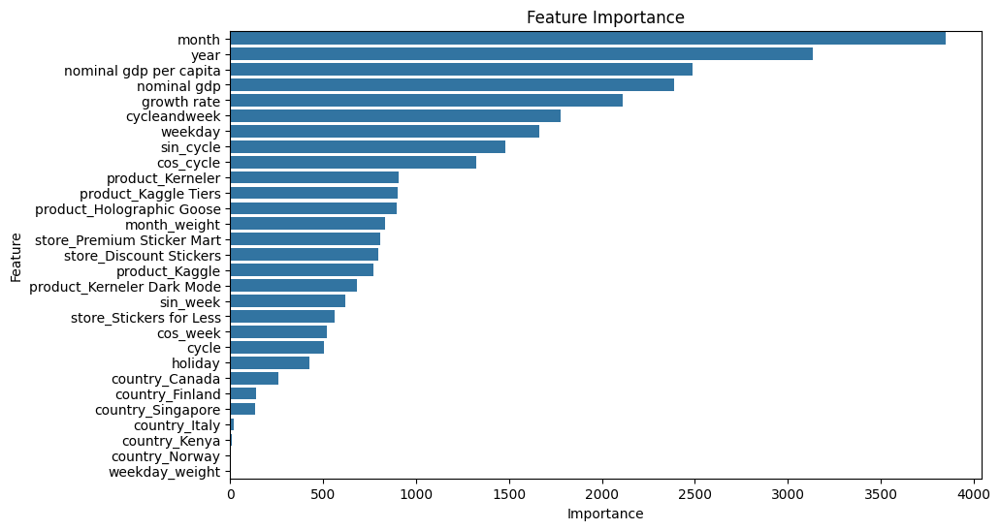

In [ ]:
# Feature importance
importance = lgbm_reg.feature_importances_
feature_names = X_train.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Feature Importance')
plt.show()

- SHAP: 각 피처가 예측 값에 기여한 구체적인 크기와 방향(증가/감소) 보여주는 그래프

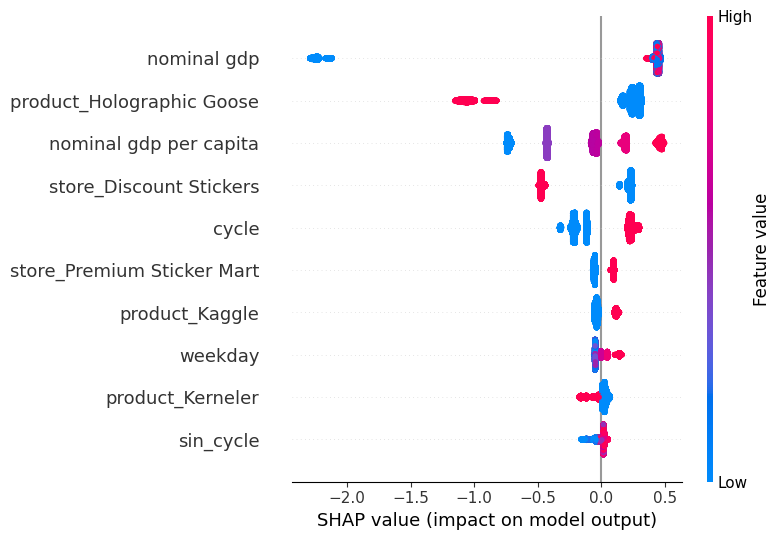

In [ ]:
import shap
explainer = shap.TreeExplainer(lgbm_reg)
shap_values = explainer.shap_values(X_test, approximate=True)
shap.summary_plot(shap_values, X_test, max_display=10)

### 2.2.3 하이퍼 파라미터 튜닝
- Optuna / GridSearchCV : 여기선 Optuna가 더 적합한 것 같다는데 너무 어려우면 GridSearch라도!
- 교차검증 시 KFold 대신 TimeSeriesSplit 사용하는 것이 중요!
- 피처를 적절히 선택하는 것도 좋을듯

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.4/383.4 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.7 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit
import lightgbm as lgb
import numpy as np

def objective(trial, X_train, y_train):
    # 하이퍼파라미터 설정 (Optuna에서 하이퍼파라미터 탐색 범위 지정)
    param = {
        'objective': 'regression',
        'metric': 'mape',  # MAPE를 목표 지표로 설정
        'boosting_type': 'gbdt',
        'verbose': -1,
        'num_leaves': trial.suggest_int('num_leaves', 10, 100),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 10, 100),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0)
    }

    # TimeSeriesSplit 교차 검증 설정
    tscv = TimeSeriesSplit(n_splits=5)  # 예: 5개의 시계열 분할

    mape_scores = []  # 각 fold에서의 MAPE 점수를 저장할 리스트

    # TimeSeriesSplit을 사용하여 교차 검증 진행
    for train_idx, val_idx in tscv.split(X_train):
        # Use .iloc to index by position
        X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

        model = lgb.LGBMRegressor(**param)
        model.fit(X_train_fold, y_train_fold)

        y_pred_fold = model.predict(X_val_fold)

        # MAPE 계산
        fold_mape = mape(y_val_fold, y_pred_fold)
        mape_scores.append(fold_mape)

    # 평균 MAPE를 반환
    return np.mean(mape_scores)

# Optuna로 하이퍼파라미터 튜닝을 수행
def tune_lgbm_with_optuna(X_train, y_train):
    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=100)

    print("Best hyperparameters: ", study.best_params)
    print("Best MAPE: ", study.best_value)

    return study # Return the study object

# 훈련 데이터에 대해 하이퍼파라미터 튜닝, and assign the returned value to the study variable
study = tune_lgbm_with_optuna(X, y) # Assuming X and y are your preprocessed data

[I 2025-01-30 16:49:01,218] A new study created in memory with name: no-name-7331aec7-569f-47b2-a258-cb762bd32d6b
<ipython-input-42-914ac6cfd021>:15: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
<ipython-input-42-914ac6cfd021>:19: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
<ipython-input-42-914ac6cfd021>:20: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 

Best hyperparameters:  {'num_leaves': 22, 'learning_rate': 0.0888989539797307, 'n_estimators': 266, 'max_depth': 3, 'min_data_in_leaf': 11, 'subsample': 0.5042082541770571, 'colsample_bytree': 0.8035050554427605}
Best MAPE:  0.013593491603964919


In [ ]:
# 최적의 하이퍼파라미터로 최종 모델 학습
best_params_lgbm = study.best_params
best_model_lgbm = LGBMRegressor(**best_params_lgbm)
best_model_lgbm.fit(X_test, y_ttest)

y_pred_fin = np.expm1(best_model_lgbm.predict(X_test))
y_true_fin = np.expm1(y_test)
mape_final = mean_absolute_percentage_error(y_true_fin, y_pred_fin)

print(f"Final MAPE: {mape_final:.4f}")

Final MAPE: 0.0580


### 2.2.4 Submission

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/방학프로젝트/test.csv')

In [ ]:
# test 셋의 날짜 변환 및 연도 분리

test['date'] = pd.to_datetime(test['date'])
test['year'] = test['date'].dt.year.astype(int)
test.head()

,id,date,country,store,product,year
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,2017
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,2017
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,2017
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,2017
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,2017


In [ ]:
#import gdp data 불러오기

gdp = pd.read_excel('/content/drive/MyDrive/방학프로젝트/additional_data.xlsx', sheet_name=0)
gdp.tail()

,country,year,nominal gdp,nominal gdp per capita,growth rate
55,Norway,2018,440000000000,82800,0.829
56,Norway,2019,409000000000,76400,1.120
57,Singapore,2017,343000000000,61200,4.510
58,Singapore,2018,377000000000,66800,3.520
59,Singapore,2019,377000000000,66100,1.350


In [ ]:
#import holiday data

holiday = pd.read_excel('/content/drive/MyDrive/방학프로젝트/additional_data.xlsx', sheet_name=1).fillna(0)
holiday.head()

,country,date,weekend
0,Canada,2010-01-01,0.0
1,Canada,2010-04-02,0.0
2,Canada,2010-04-05,0.0
3,Canada,2010-05-24,0.0
4,Canada,2010-07-01,0.0


In [ ]:
#create df (data+gdp+holiday)

test_df = pd.merge(test, gdp, on=['country', 'year'], how='inner')
test_df

,id,date,country,store,product,year,nominal gdp,nominal gdp per capita,growth rate
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,2017,1650000000000,45100,3.03
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,2017,1650000000000,45100,3.03
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,2017,1650000000000,45100,3.03
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,2017,1650000000000,45100,3.03
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,2017,1650000000000,45100,3.03
...,...,...,...,...,...,...,...,...,...
98545,328675,2019-12-31,Singapore,Premium Sticker Mart,Holographic Goose,2019,377000000000,66100,1.35
98546,328676,2019-12-31,Singapore,Premium Sticker Mart,Kaggle,2019,377000000000,66100,1.35
98547,328677,2019-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers,2019,377000000000,66100,1.35
98548,328678,2019-12-31,Singapore,Premium Sticker Mart,Kerneler,2019,377000000000,66100,1.35


In [ ]:
# 공휴일인 날짜들에 표시한 holiday 데이터 셋을 test 셋과 merge

holiday['holiday'] = 1

test_df = pd.merge(test_df, holiday[['country', 'date', 'holiday']], on=['country', 'date'], how='left')
test_df['holiday'] = test_df['holiday'].fillna(0).astype(int)

test_df

,id,date,country,store,product,year,nominal gdp,nominal gdp per capita,growth rate,holiday
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,2017,1650000000000,45100,3.03,0
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,2017,1650000000000,45100,3.03,0
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,2017,1650000000000,45100,3.03,0
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,2017,1650000000000,45100,3.03,0
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,2017,1650000000000,45100,3.03,0
...,...,...,...,...,...,...,...,...,...,...
98545,328675,2019-12-31,Singapore,Premium Sticker Mart,Holographic Goose,2019,377000000000,66100,1.35,0
98546,328676,2019-12-31,Singapore,Premium Sticker Mart,Kaggle,2019,377000000000,66100,1.35,0
98547,328677,2019-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers,2019,377000000000,66100,1.35,0
98548,328678,2019-12-31,Singapore,Premium Sticker Mart,Kerneler,2019,377000000000,66100,1.35,0


In [ ]:
# 월/일/요일 칼럼 생성

test_df_copy = test_df.copy()

test_df_copy['date'] = pd.to_datetime(test_df_copy['date'])
test_df_copy['month'] = test_df['date'].dt.month
test_df_copy['weekday'] = test_df['date'].dt.dayofweek

In [ ]:
# 1차 확인

test_df_copy

,id,date,country,store,product,year,nominal gdp,nominal gdp per capita,growth rate,holiday,month,weekday
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,2017,1650000000000,45100,3.03,0,1,6
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,2017,1650000000000,45100,3.03,0,1,6
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,2017,1650000000000,45100,3.03,0,1,6
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,2017,1650000000000,45100,3.03,0,1,6
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,2017,1650000000000,45100,3.03,0,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...
98545,328675,2019-12-31,Singapore,Premium Sticker Mart,Holographic Goose,2019,377000000000,66100,1.35,0,12,1
98546,328676,2019-12-31,Singapore,Premium Sticker Mart,Kaggle,2019,377000000000,66100,1.35,0,12,1
98547,328677,2019-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers,2019,377000000000,66100,1.35,0,12,1
98548,328678,2019-12-31,Singapore,Premium Sticker Mart,Kerneler,2019,377000000000,66100,1.35,0,12,1


In [ ]:
#가중치 입력

# 1. 월별 가중치 피처
test_df_copy['month_weight']=1
test_df_copy.loc[(test_df_copy['product']=='Holographic Goose')&(test_df_copy['month'].isin([12,1])),'month_weight']=1.5
test_df_copy.loc[(test_df_copy['product']=='Kaggle')&(test_df_copy['month'].isin([5,6,7])),'month_weight']=1.5
test_df_copy.loc[(test_df_copy['product']=='Kaggle Tiers')&(test_df_copy['month'].isin([12,1])),'month_weight']=1.5
test_df_copy.loc[(test_df_copy['product']=='Kerneler')&(test_df_copy['month'].isin([8,9,10])),'month_weight']=2
test_df_copy.loc[(test_df_copy['product']=='Kerneler Dark Mode')&(test_df_copy['month'].isin([3,4,5])),'month_weight']=2

<ipython-input-38-280803bfa9cf>:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  test_df_copy.loc[(test_df_copy['product']=='Holographic Goose')&(test_df_copy['month'].isin([12,1])),'month_weight']=1.5


In [ ]:
# 2. 요일별 가중치 피처 (평일:1, 주말:1.5)
weekday_weights = {0:1, 1:1, 2:1, 3:1, 4:1, 5:1.5, 6:1.5}
test_df_copy['weekday_weight'] = test_df_copy['weekday'].map(weekday_weights)
# test_df_copy.head()

In [ ]:
# 2-2. 요일의 주기성 반영 피처(사인변환)
test_df_copy['sin_week'] = np.sin(2 * np.pi * test_df_copy['weekday'] / 7)
test_df_copy['cos_week'] = np.cos(2 * np.pi * test_df_copy['weekday'] / 7)

In [ ]:
# 3. 1년/2년 주기성 피처

# 제품별 주기 매핑
product_cycles = {
    'Holographic Goose': 12,   # 1년 주기
    'Kaggle': 24,             # 2년 주기
    'Kaggle Tiers': 24,       # 2년 주기
    'Kerneler': 12,           # 1년 주기
    'Kerneler Dark Mode': 12  # 1년 주기
}
test_df_copy['cycle'] = test_df_copy['product'].map(product_cycles)

# 사인, 코사인 변환
test_df_copy['sin_cycle'] = np.sin(2 * np.pi * test_df_copy['month'] / test_df_copy['cycle'])
test_df_copy['cos_cycle'] = np.cos(2 * np.pi * test_df_copy['month'] / test_df_copy['cycle'])

In [ ]:
# 4.주기성(년도) 피처: 피처*요일
test_df_copy['cycleandweek'] = test_df_copy['sin_cycle'] * test_df_copy['weekday']

In [ ]:
# 원핫인코딩
test_df_copy = pd.get_dummies(test_df_copy, columns=['country', 'store','product'])

In [ ]:
# 왜곡도가 1 이상인 피처 로그변환
test_df_copy['growth rate'] = np.log1p(test_df_copy['growth rate'])

In [ ]:
# 모델 제작때 사용했던 df_cleaned_2와 동일한 셋 모형 맞추기 위해 id와 date 드랍.

test_df_copy = test_df_copy.drop(columns=['id', 'date'])
test_df_copy.head()

,year,nominal gdp,nominal gdp per capita,growth rate,holiday,month,weekday,month_weight,weekday_weight,sin_week,...,country_Norway,country_Singapore,store_Discount Stickers,store_Premium Sticker Mart,store_Stickers for Less,product_Holographic Goose,product_Kaggle,product_Kaggle Tiers,product_Kerneler,product_Kerneler Dark Mode
0,2017,1650000000000,45100,1.393766,0,1,6,1.5,1.5,-0.781831,...,False,False,True,False,False,True,False,False,False,False
1,2017,1650000000000,45100,1.393766,0,1,6,1.0,1.5,-0.781831,...,False,False,True,False,False,False,True,False,False,False
2,2017,1650000000000,45100,1.393766,0,1,6,1.5,1.5,-0.781831,...,False,False,True,False,False,False,False,True,False,False
3,2017,1650000000000,45100,1.393766,0,1,6,1.0,1.5,-0.781831,...,False,False,True,False,False,False,False,False,True,False
4,2017,1650000000000,45100,1.393766,0,1,6,1.0,1.5,-0.781831,...,False,False,True,False,False,False,False,False,False,True


In [ ]:
# zero_groups = [
#     ('Canada', 'Discount Stickers', 'Holographic Goose'),
#     ('Kenya', 'Discount Stickers', 'Holographic Goose')
# ]

# predict_result = test_df_copy.copy() #test_df_copy는 전처리가 완료된 test set
# predict_result['num_sold'] = 0

# for idx, row in predict_result.iterrows():
#     country, store, product = row['country'], row['store'], row['product']

#     if (country, store, product) in zero_groups:
#         predict_result.at[idx, 'num_sold'] = 0
#     else:
#         test_X = row.drop('num_sold')
#         test_X = test_X.values.reshape(1, -1)

#         num_sold_pred = model.predict(test_X) #model에 fitted model 변수 지정
#         data.at[idx, 'num_sold'] = num_sold_pred[0]

In [ ]:
# submission 파일 불러오기

submission = pd.read_csv('/content/drive/MyDrive/방학프로젝트/sample_submission.csv')
submission

,id,num_sold
0,230130,100
1,230131,100
2,230132,100
3,230133,100
4,230134,100
...,...,...
98545,328675,100
98546,328676,100
98547,328677,100
98548,328678,100


In [ ]:
# test 셋 예측 후 기존에 로그변환 했던 값을 자연상수 취해줌.

pred = best_model_lgbm.predict(test_df_copy)
pred_org =np.expm1(pred)

In [ ]:
# country가 Canada 혹은 Kenya, store가 Discount Stickers, product가 Holographic Goose인 셀들은 train 셋에서 0으로 취급했기 때문에 test셋에서도 동일하게 적용

condition = (
    ((test_df_copy['country_Canada'] == 1) | (test_df_copy['country_Kenya'] == 1)) &
    (test_df_copy['store_Discount Stickers'] == 1) &
    (test_df_copy['product_Holographic Goose'] == 1)
)

index_ = test_df_copy[condition].index

pred_org = pd.Series(pred_org, index=test_df_copy.index)

pred_org.loc[index_] = 0

In [ ]:
# submission의 num_sold 칼럼에 예측값 대입

submission_lgbm = submission.copy()
submission_lgbm['num_sold'] = pred_org
submission_lgbm

,id,num_sold
0,230130,0.000000
1,230131,853.523249
2,230132,724.381066
3,230133,370.729859
4,230134,477.748015
...,...,...
98545,328675,365.078283
98546,328676,2358.101965
98547,328677,1917.990349
98548,328678,1121.834614


In [ ]:
submission_lgbm.to_csv('sub_lgbm.csv', index=False)

##2.3 XGBoost (Leaderboard Score: 0.12485%)



### 2.3.1 피처 생성


###2.3.2 모델링
- Final MAPE: 0.0949%


In [ ]:
# XGBoost 회귀 1차 모델링
from xgboost import XGBRegressor

xgb_reg = XGBRegressor(n_estimators=1000,
                         verbose=-1)

xgb_reg.fit(X_train, y_train)
xgb_pred = xgb_reg.predict(X_test)
xgb_reg.fit(X_train, y_train)
xgb_pred = xgb_reg.predict(X_test)

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [19:00:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [19:01:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)


In [ ]:
# MAPE 성능계산
y_test_original = np.expm1(y_test)
xgb_pred_original = np.expm1(xgb_pred)
mape(y_test_original, xgb_pred_original)

0.09596311031740767

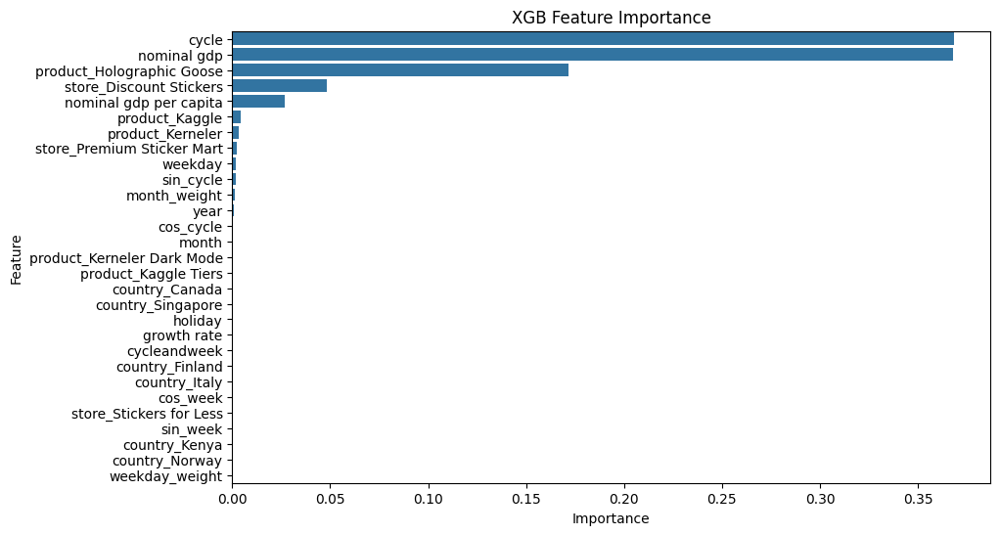

In [ ]:
# Feature importance
importance = xgb_reg.feature_importances_
feature_names = X_train.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('XGB Feature Importance')
plt.show()

###2.3.3 하이퍼 파라미터 튜닝


In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.4/383.4 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.5 MB/s eta 0:00:00


In [ ]:
import optuna
import xgboost as xgb
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error

X_train = X_train.values
y_train = y_train.values

def objective(trial):
    param = {
        "objective": "reg:squarederror",
        "tree_method": "auto",
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "min_child_weight": trial.suggest_float("min_child_weight", 1e-3, 10.0, log=True),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 1.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 1.0, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
    }

    tscv = TimeSeriesSplit(n_splits=5)
    mape_scores = []
    for train_idx, test_idx in tscv.split(X_train):
        X_train_fold, X_test_fold = X_train[train_idx], X_train[test_idx]
        y_train_fold, y_test_fold = y_train[train_idx], y_train[test_idx]

        model = xgb.XGBRegressor(**param, early_stopping_rounds=10)
        model.fit(
            X_train_fold,
            y_train_fold,
            eval_set=[(X_test_fold, y_test_fold)],
            verbose=False
        )

        y_pred = np.expm1(model.predict(X_test_fold))
        y_true = np.expm1(y_test_fold)
        mape = mean_absolute_percentage_error(y_true, y_pred)
        mape_scores.append(mape)

    return np.mean(mape_scores)

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)
print("Best trial:", study.best_trial.params)

[I 2025-01-31 14:00:28,376] A new study created in memory with name: no-name-efc27db0-740a-4f8a-8128-4c9886df640e
[I 2025-01-31 14:01:21,965] Trial 0 finished with value: 0.29613073930705697 and parameters: {'learning_rate': 0.012791620876889629, 'max_depth': 5, 'min_child_weight': 1.7059014046153604, 'subsample': 0.8742687421355071, 'colsample_bytree': 0.7599498439098933, 'reg_alpha': 1.693438016432448e-06, 'reg_lambda': 1.946080121909083e-06, 'n_estimators': 152}. Best is trial 0 with value: 0.29613073930705697.
[I 2025-01-31 14:02:36,453] Trial 1 finished with value: 0.21902535953577845 and parameters: {'learning_rate': 0.011803549242003544, 'max_depth': 7, 'min_child_weight': 0.0018285636257487862, 'subsample': 0.8591668820902516, 'colsample_bytree': 0.8529789358725139, 'reg_alpha': 4.306501483204781e-05, 'reg_lambda': 6.78630765911459e-08, 'n_estimators': 794}. Best is trial 1 with value: 0.21902535953577845.
[I 2025-01-31 14:03:24,480] Trial 2 finished with value: 0.1921225904592

Best trial: {'learning_rate': 0.10032782474028785, 'max_depth': 10, 'min_child_weight': 0.00535771731849213, 'subsample': 0.5061228543141529, 'colsample_bytree': 0.5320070375974328, 'reg_alpha': 6.635779910672653e-06, 'reg_lambda': 1.8090080167055644e-08, 'n_estimators': 541}


In [ ]:
# 최적의 하이퍼파라미터로 최종 모델 학습
from xgboost import XGBRegressor

best_params = study.best_trial.params
best_model = XGBRegressor(**best_params)
best_model.fit(X_train, y_train)

y_pred_final = np.expm1(best_model.predict(X_test))
y_true_final = np.expm1(y_test)
mape_final = mean_absolute_percentage_error(y_true_final, y_pred_final)

print(f"Final MAPE: {mape_final:.4f}%")

Final MAPE: 0.1010%


### 2.3.4 Submission

In [ ]:
from xgboost import XGBRegressor

pred = xgb_reg.predict(test_df_copy)
pred_org = np.expm1(pred)

In [ ]:
condition = (
    ((test_df_copy['country_Canada'] == 1) | (test_df_copy['country_Kenya'] == 1)) &
    (test_df_copy['store_Discount Stickers'] == 1) &
    (test_df_copy['product_Holographic Goose'] == 1)
)

index_ = test_df_copy[condition].index

pred_org = pd.Series(pred_org, index=test_df_copy.index)

pred_org.loc[index_] = 0

In [ ]:
# submission의 num_sold 칼럼에 예측값 대입

submission_xgb = submission.copy()
submission_xgb['num_sold'] = pred_org
submission_xgb

,id,num_sold
0,230130,111.095032
1,230131,769.802612
2,230132,589.117981
3,230133,317.355682
4,230134,398.080017
...,...,...
98545,328675,304.019287
98546,328676,1919.117310
98547,328677,1794.648682
98548,328678,942.744446


In [ ]:
submission_xgb.to_csv('sub_xgb.csv', index=False)

In [ ]:
from google.colab import files
files.download('sub_xgb.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##2.4 Prophet (Leaderboard Score : 0.11860)

### 2.4.1 Data Handling for Prophet 1
- Holiday를 제외하고 original data + gdp data를 merge
- 추후 prophet의 add_country_holidays( ) 메서드를 사용
- 추후 공휴일 효과 파라미터인 holidays_prior_scale를 튜닝하기 위함.
- 보간법으로 결측치 처리
- (캐나다, 디스카운트, 홀로그래픽)이랑 (케냐, 디스카운트, 홀로그래픽)는 판매가 이뤄지지 않는 것으로 보고 drop

In [ ]:
#create new df (data+gdp)

df2 = pd.merge(data, gdp, on=['country', 'year'], how='inner')
df2.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN,2010,1620000000000,47600,3.09
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09


In [ ]:
#nan_country, nan_store, nan_product
nan_country = ['Canada', 'Kenya']
nan_store = ['Discount Stickers', 'Premium Sticker Mart', 'Stickers for Less']
nan_product = ['Holographic Goose', 'Kerneler', 'Kerneler Dark Mode']

#보간법으로 결측치 처리
for country in nan_country:
    for store in nan_store:
        for product in nan_product:

            mask = (df2['country'] == country) & (df2['store'] == store) & (df2['product'] == product)
            subset = df2[mask]

            if subset['num_sold'].isnull().any():
                df2.loc[mask, 'num_sold'] = subset['num_sold'].interpolate(method='linear')

df2.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN,2010,1620000000000,47600,3.09
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09


In [ ]:
# 로우 drop
df_cleaned2 = df2[~((df2['country'].isin(['Canada', 'Kenya'])) & (df2['store'] == 'Discount Stickers') & (df2['product'] == 'Holographic Goose'))]

df_cleaned2.head()

,id,date,country,store,product,num_sold,year,nominal gdp,nominal gdp per capita,growth rate
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1620000000000,47600,3.09
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1620000000000,47600,3.09
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1620000000000,47600,3.09
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1620000000000,47600,3.09
5,5,2010-01-01,Canada,Stickers for Less,Holographic Goose,300.0,2010,1620000000000,47600,3.09


In [ ]:
#최종 df_cleaned2에서 결측치 없음

df_cleaned2.isnull().sum()

,0
id,0
date,0
country,0
store,0
product,0
num_sold,0
year,0
nominal gdp,0
nominal gdp per capita,0
growth rate,0


### 2.4.2 군집화
- 각 (country, store, product) 총 88개의 조합. 전부 각각 Prophet을 적용하는 것은 비효율적.
- KMeans를 사용해 군집화 후, 각 군집별로 Prophet 모델을 하나씩 적용할 예정

In [ ]:
# grouped_df는 그룹화된 88개의 데이터 세트
df_index = df_cleaned2.set_index('date', inplace=False)
grouped_df = df_index.groupby(['country', 'store', 'product'])  # (country, store, product)로 그룹화

In [ ]:
# 각 (country, store, product)에 대한 시계열 특징을 추출하는 함수
from scipy.stats import linregress

def extract_time_series_features(group):

    features = {}

    for (country, store, product), data in group:
        series = data['num_sold'].reset_index(drop=True)

        # 1. 기본 통계량 (평균, 표준편차, 최솟값, 최댓값)
        mean_val = np.mean(series)   # 평균 판매량
        std_val = np.std(series)     # 판매량의 변동성
        min_val = np.min(series)     # 최소 판매량
        max_val = np.max(series)     # 최대 판매량

        # 2. 변화율: 첫 번째와 마지막 값의 비율
        change_rate = (series.iloc[-1] - series.iloc[0]) / (series.iloc[0] + 1e-6)

        # 3. 트렌드 분석 (선형 회귀 계수)
        slope, intercept, r_value, p_value, std_err = linregress(range(len(series)), series)

        # 4. 계절성 특징 (주간 변화량)
        weekly_diff = np.mean(series.diff(periods=7))  # 7일 단위 변화량

        features[(country, store, product)] = [mean_val, std_val, min_val, max_val, change_rate, slope, weekly_diff]

    return pd.DataFrame.from_dict(features, orient='index',
                                  columns=['mean', 'std', 'min', 'max', 'change_rate', 'trend_slope', 'weekly_diff'])

In [ ]:
feature_df = extract_time_series_features(grouped_df)
print(feature_df.head())

                                                         mean        std  \
(Canada, Discount Stickers, Kaggle)                715.652718  96.452540   
(Canada, Discount Stickers, Kaggle Tiers)          592.579194  80.577310   
(Canada, Discount Stickers, Kerneler)              323.568244  56.755661   
(Canada, Discount Stickers, Kerneler Dark Mode)    377.781776  73.344165   
(Canada, Premium Sticker Mart, Holographic Goose)  243.919437  33.750646   

                                                     min     max  change_rate  \
(Canada, Discount Stickers, Kaggle)                508.0  1216.0    -0.101747   
(Canada, Discount Stickers, Kaggle Tiers)          412.0  1002.0    -0.313466   
(Canada, Discount Stickers, Kerneler)              200.0   534.0    -0.052009   
(Canada, Discount Stickers, Kerneler Dark Mode)    211.0   660.0    -0.040733   
(Canada, Premium Sticker Mart, Holographic Goose)  200.0   449.0    -0.176000   

                                                   trend

In [ ]:
# 90가지수 - 삭제한 조합 2가지 = 88가지수
print(feature_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 88 entries, ('Canada', 'Discount Stickers', 'Kaggle') to ('Singapore', 'Stickers for Less', 'Kerneler Dark Mode')
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   mean         88 non-null     float64
 1   std          88 non-null     float64
 2   min          88 non-null     float64
 3   max          88 non-null     float64
 4   change_rate  88 non-null     float64
 5   trend_slope  88 non-null     float64
 6   weekly_diff  88 non-null     float64
dtypes: float64(7)
memory usage: 5.5+ KB
None


In [ ]:
# 스케일링 (정규화)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_features = scaler.fit_transform(feature_df)

In [ ]:
# 📌 K-Means 사용

from sklearn.cluster import KMeans

n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
feature_df['cluster'] = kmeans.fit_predict(scaled_features)

print(feature_df[['cluster']].value_counts())

cluster
0          35
2          19
4          19
3          10
1           5
Name: count, dtype: int64


In [ ]:
# 📌 DBSCAN 사용

from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=1.5, min_samples=5)  # eps(반경), min_samples(최소 샘플 수)
feature_df['cluster'] = dbscan.fit_predict(scaled_features)

print(feature_df[['cluster']].value_counts()) # -1은 이상치

cluster
 0         80
-1          8
Name: count, dtype: int64


DBSCAN은 데이터가 많고 밀도가 다양한 경우엔 좋지만, (country, store, product) 조합이 균등하게 분포할 가능성이 높아 K-Means가 더 적합할 것 같음. 군집개수를 적당하게 설정하여 각 군집별로 하나의 Prophet 모델을 만들자!

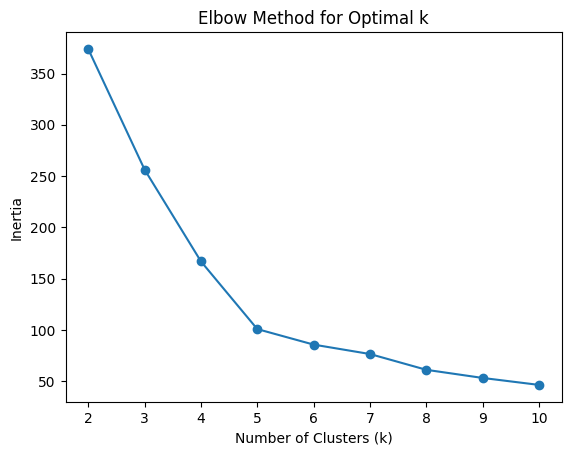

In [ ]:
# 최적의 K 찾기 (Elbow Method)
# 보통 그래프에서 Inertia 감소 속도가 급격히 줄어드는 지점이 적절한 클러스터 개수
# 2~10개의 클러스터를 실험

import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

inertia = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)

plt.plot(k_values, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

In [ ]:
# (이전 inertia - 현재 inertia) 차분값
diff = [inertia[i] - inertia[i+1] for i in range(len(inertia)-1)]
print(diff)

[117.63798059284852, 89.58800504443818, 66.04601144679675, 15.146286999806392, 9.191615931190583, 15.39695416910019, 7.935387719525984, 6.791934536598369]


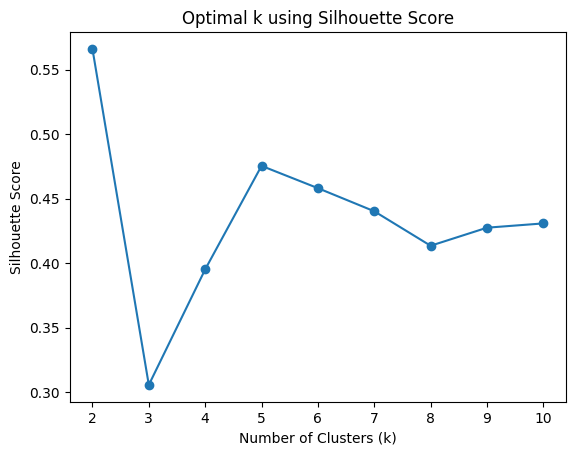

In [ ]:
# Silhouette Score 확인

from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    score = silhouette_score(scaled_features, kmeans.labels_)
    silhouette_scores.append(score)

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Optimal k using Silhouette Score")
plt.show()

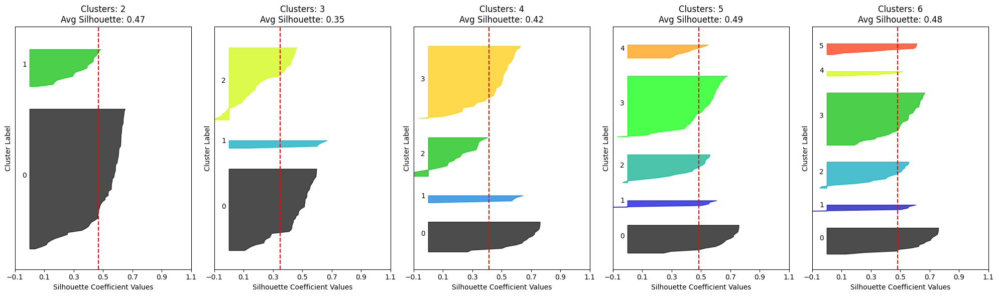

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

def visualize_silhouette(cluster_lists, X_features):
    """
    여러 개의 군집 개수에 대해 KMeans 군집화와 실루엣 계수를 시각화합니다.

    Parameters:
    cluster_lists: list
        군집 개수로 사용할 정수 리스트 (예: [2, 3, 4, 5])
    X_features: array-like
        군집화에 사용할 피처 데이터 세트
    """
    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(1, n_cols, figsize=(4 * n_cols, 6))

    if n_cols == 1:
        axs = [axs]  # 단일 subplot에도 리스트로 접근 가능하도록 처리

    for idx, n_clusters in enumerate(cluster_lists):
        # KMeans 모델 학습 및 예측
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        cluster_labels = kmeans.fit_predict(X_features)

        # 실루엣 계수 계산
        silhouette_avg = silhouette_score(X_features, cluster_labels)
        sample_silhouette_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10
        axs[idx].set_title(f"Clusters: {n_clusters}\nAvg Silhouette: {silhouette_avg:.2f}")
        axs[idx].set_xlim([-0.1, 1])
        axs[idx].set_ylim([0, len(X_features) + (n_clusters + 1) * 10])
        axs[idx].set_xlabel("Silhouette Coefficient Values")
        axs[idx].set_ylabel("Cluster Label")

        # 각 군집별 실루엣 계수 플롯
        for i in range(n_clusters):
            cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            cluster_silhouette_values.sort()

            size_cluster_i = cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            color = cm.nipy_spectral(float(i) / n_clusters)
            axs[idx].fill_betweenx(
                np.arange(y_lower, y_upper),
                0, cluster_silhouette_values,
                facecolor=color, edgecolor=color, alpha=0.7
            )

            axs[idx].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10  # 10은 클러스터 간의 공백

        axs[idx].axvline(x=silhouette_avg, color="red", linestyle="--")
        axs[idx].set_yticks([])  # y축 틱 제거
        axs[idx].set_xticks(np.arange(-0.1, 1.1, 0.2))

    plt.tight_layout()
    plt.show()

visualize_silhouette([2, 3, 4, 5, 6], scaled_features)

In [ ]:
# 최적의 k를 5로 결정!
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
feature_df['cluster'] = kmeans.fit_predict(scaled_features)

# 각 군집별 조합
for cluster in range(optimal_k):
    cluster_data = feature_df[feature_df['cluster'] == cluster].index
    print(f"\n=== Cluster {cluster} ===")
    print(list(cluster_data))


=== Cluster 0 ===
[('Canada', 'Discount Stickers', 'Kaggle'), ('Canada', 'Discount Stickers', 'Kaggle Tiers'), ('Canada', 'Discount Stickers', 'Kerneler'), ('Canada', 'Discount Stickers', 'Kerneler Dark Mode'), ('Canada', 'Premium Sticker Mart', 'Holographic Goose'), ('Canada', 'Premium Sticker Mart', 'Kerneler'), ('Canada', 'Stickers for Less', 'Holographic Goose'), ('Canada', 'Stickers for Less', 'Kerneler'), ('Canada', 'Stickers for Less', 'Kerneler Dark Mode'), ('Finland', 'Discount Stickers', 'Holographic Goose'), ('Finland', 'Discount Stickers', 'Kaggle'), ('Finland', 'Discount Stickers', 'Kaggle Tiers'), ('Finland', 'Discount Stickers', 'Kerneler'), ('Finland', 'Discount Stickers', 'Kerneler Dark Mode'), ('Finland', 'Premium Sticker Mart', 'Holographic Goose'), ('Finland', 'Premium Sticker Mart', 'Kerneler'), ('Finland', 'Stickers for Less', 'Holographic Goose'), ('Finland', 'Stickers for Less', 'Kerneler'), ('Finland', 'Stickers for Less', 'Kerneler Dark Mode'), ('Italy', 'Dis

In [ ]:
feature_df

,mean,std,min,max,change_rate,trend_slope,weekly_diff,cluster
"(Canada, Discount Stickers, Kaggle)",715.652718,96.452540,508.0,1216.0,-0.101747,-0.038050,-0.062745,0
"(Canada, Discount Stickers, Kaggle Tiers)",592.579194,80.577310,412.0,1002.0,-0.313466,-0.032956,-0.298431,0
"(Canada, Discount Stickers, Kerneler)",323.568244,56.755661,200.0,534.0,-0.052009,-0.011497,-0.013333,0
"(Canada, Discount Stickers, Kerneler Dark Mode)",377.781776,73.344165,211.0,660.0,-0.040733,-0.028493,0.009412,0
"(Canada, Premium Sticker Mart, Holographic Goose)",243.919437,33.750646,200.0,449.0,-0.176000,-0.010012,-0.071373,0
...,...,...,...,...,...,...,...,...
"(Singapore, Stickers for Less, Holographic Goose)",229.463043,36.809946,147.0,437.0,0.275748,0.017603,0.190196,4
"(Singapore, Stickers for Less, Kaggle)",1643.064138,215.163406,1068.0,2534.0,0.201413,0.120005,1.435686,3
"(Singapore, Stickers for Less, Kaggle Tiers)",1356.942120,182.303860,908.0,2219.0,0.343770,0.098338,0.735294,3
"(Singapore, Stickers for Less, Kerneler)",741.365663,127.903994,420.0,1191.0,0.250892,0.070362,0.744314,3


### 2.4.3 Data Handling for Prophet 2
- 시계열 정보 데이터셋의 인덱스를 country, store, product 세 칼럼으로 변환 후 양끝쪽의 '''를 제거
- 시계열 정보 데이터셋과 원본 데이터셋을 merge


In [ ]:
feature_df_reset = feature_df.reset_index()
print(feature_df_reset.head())

                                               index        mean        std  \
0                (Canada, Discount Stickers, Kaggle)  715.652718  96.452540   
1          (Canada, Discount Stickers, Kaggle Tiers)  592.579194  80.577310   
2              (Canada, Discount Stickers, Kerneler)  323.568244  56.755661   
3    (Canada, Discount Stickers, Kerneler Dark Mode)  377.781776  73.344165   
4  (Canada, Premium Sticker Mart, Holographic Goose)  243.919437  33.750646   

     min     max  change_rate  trend_slope  weekly_diff  cluster  
0  508.0  1216.0    -0.101747    -0.038050    -0.062745        0  
1  412.0  1002.0    -0.313466    -0.032956    -0.298431        0  
2  200.0   534.0    -0.052009    -0.011497    -0.013333        0  
3  211.0   660.0    -0.040733    -0.028493     0.009412        0  
4  200.0   449.0    -0.176000    -0.010012    -0.071373        0  


In [ ]:
feature_df_reset[['country', 'store', 'product']] = feature_df_reset['index'].astype(str).str.replace('[()]', '', regex=True).str.split(',', expand=True)
feature_df_reset = feature_df_reset.drop(columns=['index'])
print(feature_df_reset.head())

         mean        std    min     max  change_rate  trend_slope  \
0  715.652718  96.452540  508.0  1216.0    -0.101747    -0.038050   
1  592.579194  80.577310  412.0  1002.0    -0.313466    -0.032956   
2  323.568244  56.755661  200.0   534.0    -0.052009    -0.011497   
3  377.781776  73.344165  211.0   660.0    -0.040733    -0.028493   
4  243.919437  33.750646  200.0   449.0    -0.176000    -0.010012   

   weekly_diff  cluster   country                    store  \
0    -0.062745        0  'Canada'      'Discount Stickers'   
1    -0.298431        0  'Canada'      'Discount Stickers'   
2    -0.013333        0  'Canada'      'Discount Stickers'   
3     0.009412        0  'Canada'      'Discount Stickers'   
4    -0.071373        0  'Canada'   'Premium Sticker Mart'   

                 product  
0               'Kaggle'  
1         'Kaggle Tiers'  
2             'Kerneler'  
3   'Kerneler Dark Mode'  
4    'Holographic Goose'  


In [ ]:
print(df_cleaned2.head())
print(feature_df_reset.head())

   id       date country              store             product  num_sold  \
1   1 2010-01-01  Canada  Discount Stickers              Kaggle     973.0   
2   2 2010-01-01  Canada  Discount Stickers        Kaggle Tiers     906.0   
3   3 2010-01-01  Canada  Discount Stickers            Kerneler     423.0   
4   4 2010-01-01  Canada  Discount Stickers  Kerneler Dark Mode     491.0   
5   5 2010-01-01  Canada  Stickers for Less   Holographic Goose     300.0   

   year    nominal gdp  nominal gdp per capita  growth rate  
1  2010  1620000000000                   47600         3.09  
2  2010  1620000000000                   47600         3.09  
3  2010  1620000000000                   47600         3.09  
4  2010  1620000000000                   47600         3.09  
5  2010  1620000000000                   47600         3.09  
         mean        std    min     max  change_rate  trend_slope  \
0  715.652718  96.452540  508.0  1216.0    -0.101747    -0.038050   
1  592.579194  80.577310  4

In [ ]:
# df_cleaned의 'country', 'store', 'product' 컬럼에서 공백 제거
df_cleaned2['country'] = df_cleaned2['country'].str.strip().str.replace(' ', '')
df_cleaned2['store'] = df_cleaned2['store'].str.strip().str.replace(' ', '')
df_cleaned2['product'] = df_cleaned2['product'].str.strip().str.replace(' ', '')
# feature_df_reset의 'country', 'store', 'product' 컬럼에서 공백 제거
feature_df_reset['country'] = feature_df_reset['country'].str.strip().str.replace(' ', '')
feature_df_reset['store'] = feature_df_reset['store'].str.strip().str.replace(' ', '')
feature_df_reset['product'] = feature_df_reset['product'].str.strip().str.replace(' ', '')
feature_df_reset['country'] = feature_df_reset['country'].str.strip("'")
feature_df_reset['store'] = feature_df_reset['store'].str.strip("'")
feature_df_reset['product'] = feature_df_reset['product'].str.strip("'")

<ipython-input-30-2e05d1657340>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned2['country'] = df_cleaned2['country'].str.strip().str.replace(' ', '')
<ipython-input-30-2e05d1657340>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned2['store'] = df_cleaned2['store'].str.strip().str.replace(' ', '')
<ipython-input-30-2e05d1657340>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [ ]:
df_cleaned_pro = df_cleaned2.merge(feature_df_reset[['country', 'store', 'product', 'cluster']],
                              on=['country', 'store', 'product'],
                              how='left')

In [ ]:
df_cleaned_pro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225016 entries, 0 to 225015
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      225016 non-null  int64         
 1   date                    225016 non-null  datetime64[ns]
 2   country                 225016 non-null  object        
 3   store                   225016 non-null  object        
 4   product                 225016 non-null  object        
 5   num_sold                225016 non-null  float64       
 6   year                    225016 non-null  int64         
 7   nominal gdp             225016 non-null  int64         
 8   nominal gdp per capita  225016 non-null  int64         
 9   growth rate             225016 non-null  float64       
 10  cluster                 225016 non-null  int32         
dtypes: datetime64[ns](1), float64(2), int32(1), int64(4), object(3)
memory usage: 18.0+ MB


### 2.4.4 Modeling
- 각 군집별로 하나씩 Prophet 모델 적용
- 1년간 예측 수행
- 각 군집에 속한 국가에 맞게 holidays 정보 추가 (add_country_holidays 메소드 사용)

In [ ]:
from prophet import Prophet
import pandas as pd

for cluster in range(5):
    cluster_data = df_cleaned_pro[df_cleaned_pro['cluster'] == cluster]

    countries = cluster_data['country'].unique()

    model = Prophet()

    for country in countries:
        if country == 'Finland':
            model.add_country_holidays(country_name='FI')
        elif country == 'Kenya':
            model.add_country_holidays(country_name='KE')
        elif country == 'Norway':
            model.add_country_holidays(country_name='NO')
        elif country == 'Singapore':
            model.add_country_holidays(country_name='SG')

    cluster_data = cluster_data.rename(columns={'date': 'ds', 'num_sold': 'y'})
    model_data = cluster_data[['ds', 'y']]

    model.fit(model_data)

    future = model.make_future_dataframe(periods=365)  # 1년간 예측

    forecast = model.predict(future)

    print(f"Cluster {cluster} Prediction")
    print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/ijicqnsp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/p9rv7mn1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95485', 'data', 'file=/tmp/tmpdenav8da/ijicqnsp.json', 'init=/tmp/tmpdenav8da/p9rv7mn1.json', 'output', 'file=/tmp/tmpdenav8da/prophet_model8zn6o1qz/prophet_model-20250131120611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:06:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Cluster 0 Prediction
             ds        yhat  yhat_lower  yhat_upper
2917 2017-12-27  443.719361  139.325961  742.235688
2918 2017-12-28  445.391432  164.566942  733.507010
2919 2017-12-29  471.371403  180.597502  758.889251
2920 2017-12-30  496.189628  208.554643  796.337935
2921 2017-12-31  545.888723  274.290825  845.286900


DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/85xpev1o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/omyilgc_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44643', 'data', 'file=/tmp/tmpdenav8da/85xpev1o.json', 'init=/tmp/tmpdenav8da/omyilgc_.json', 'output', 'file=/tmp/tmpdenav8da/prophet_modelil7b3q1i/prophet_model-20250131120654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:07:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Cluster 1 Prediction
             ds         yhat   yhat_lower   yhat_upper
2917 2017-12-27  1896.524120  1066.200509  2672.374094
2918 2017-12-28  1901.158662  1093.769646  2689.127693
2919 2017-12-29  2035.792690  1257.771014  2839.768063
2920 2017-12-30  2178.926386  1448.181915  3065.428928
2921 2017-12-31  2459.461872  1691.725248  3181.755151


DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/_hrsllto.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/ygkzbltt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26777', 'data', 'file=/tmp/tmpdenav8da/_hrsllto.json', 'init=/tmp/tmpdenav8da/ygkzbltt.json', 'output', 'file=/tmp/tmpdenav8da/prophet_modely6tueps9/prophet_model-20250131120704.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:07:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:07:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Cluster 2 Prediction
             ds         yhat  yhat_lower   yhat_upper
2917 2017-12-27  1063.382167  680.255856  1487.061896
2918 2017-12-28  1068.228304  660.396038  1505.310538
2919 2017-12-29  1138.728027  723.978337  1538.492914
2920 2017-12-30  1205.862744  823.676545  1589.739306
2921 2017-12-31  1340.323105  933.889128  1757.956774


DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/v5xhkn4c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/be12lo9c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53194', 'data', 'file=/tmp/tmpdenav8da/v5xhkn4c.json', 'init=/tmp/tmpdenav8da/be12lo9c.json', 'output', 'file=/tmp/tmpdenav8da/prophet_model2jso2qqy/prophet_model-20250131120740.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:07:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:07:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Cluster 3 Prediction
             ds         yhat   yhat_lower   yhat_upper
2917 2017-12-27  1370.858157   754.908770  1983.076421
2918 2017-12-28  1378.059860   816.310956  1970.743860
2919 2017-12-29  1454.447163   875.188503  2021.593168
2920 2017-12-30  1528.347411   977.200949  2107.944118
2921 2017-12-31  1671.353038  1092.349423  2244.293890


DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/tjre7hko.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdenav8da/3z15r0pg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5771', 'data', 'file=/tmp/tmpdenav8da/tjre7hko.json', 'init=/tmp/tmpdenav8da/3z15r0pg.json', 'output', 'file=/tmp/tmpdenav8da/prophet_modellmgu3_ix/prophet_model-20250131120805.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:08:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:08:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Cluster 4 Prediction
             ds        yhat  yhat_lower  yhat_upper
2917 2017-12-27  107.038966  -67.891412  282.584390
2918 2017-12-28  107.571507  -57.306400  275.350354
2919 2017-12-29  113.279998  -67.270609  269.989157
2920 2017-12-30  118.628936  -55.907299  288.074882
2921 2017-12-31  128.726164  -33.601562  295.166415


##2.5 ARIMAX (Leaderboard Score: 12.48877%)

###2.5.1 Data Handling for ARIMAX

In [ ]:
test_df = test.copy()
test_df.shape

(98550, 5)

In [ ]:
test_df['year'] = test_df['date'].dt.year.astype(int)
test_df.shape

(98550, 6)

In [ ]:
test_df = pd.merge(test_df, gdp, on = ['country', 'year'], how = 'inner')
test_df.shape

(98550, 9)

In [ ]:
holiday['holiday'] = 1

test_df = pd.merge(test_df, holiday[['country', 'date', 'holiday']], on = ['country', 'date'], how = 'left')
test_df['holiday'] = test_df['holiday'].fillna(0).astype(int)

test_df.shape

(98550, 10)

###2.5.2 fitting

In [ ]:
#group1
warnings.filterwarnings("ignore")

predictions = []

# group1에 해당하는 group만 예측하도록 필터링
decoded_group1 = decode_group(group1)

for (country, store, product), group_data in grouped_df:
    # 그룹을 순회하며 각 그룹의 예측을 수행
    if (country, store, product) in decoded_group1:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[0]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        # test_X 가져오기
        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        # 예측 (2017년부터 2019년까지의 1,095일 예측)
        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        # 예측 결과에 해당하는 날짜를 계산
        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        # 예측된 결과를 'test' 데이터프레임의 해당하는 날짜, country, store, product에 매핑
        for i, date in enumerate(forecast_dates):
            # 예측값과 날짜를 test 데이터에 맞게 매핑
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]  # 예측된 값을 predicted_mean으로 가져옴
            })

# 예측된 데이터로 새로운 DataFrame 생성
group1_predicted_df = pd.DataFrame(predictions)

# 예측된 결과 확인
group1_predicted_df

NameError: name 'warnings' is not defined

In [ ]:
#group2
predictions = []
decoded_group2 = decode_group(group2)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group2:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[1]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group2_predicted_df = pd.DataFrame(predictions)
group2_predicted_df

NameError: name 'decode_group' is not defined

In [ ]:
#group3
predictions = []
decoded_group3 = decode_group(group3)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group3:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[2]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group3_predicted_df = pd.DataFrame(predictions)
group3_predicted_df

In [ ]:
#group4
predictions = []
decoded_group4 = decode_group(group4)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group4:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[3]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group4_predicted_df = pd.DataFrame(predictions)
group4_predicted_df

In [ ]:
#group5
predictions = []
decoded_group5 = decode_group(group5)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group5:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[4]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group5_predicted_df = pd.DataFrame(predictions)
group5_predicted_df

In [ ]:
#group6
predictions = []
decoded_group6 = decode_group(group6)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group6:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[5]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group6_predicted_df = pd.DataFrame(predictions)
group6_predicted_df

In [ ]:
#group7
predictions = []
decoded_group7 = decode_group(group7)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group7:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[6]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group7_predicted_df = pd.DataFrame(predictions)
group7_predicted_df

In [ ]:
#group8
predictions = []
decoded_group8 = decode_group(group8)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group8:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[7]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group8_predicted_df = pd.DataFrame(predictions)
group8_predicted_df

In [ ]:
#group9
predictions = []
decoded_group9 = decode_group(group9)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group9:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[8]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group9_predicted_df = pd.DataFrame(predictions)
group9_predicted_df

In [ ]:
#group10
predictions = []
decoded_group10 = decode_group(group10)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group10:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[9]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group10_predicted_df = pd.DataFrame(predictions)
group10_predicted_df

In [ ]:
#group11
predictions = []
decoded_group11 = decode_group(group11)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group11:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[10]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group11_predicted_df = pd.DataFrame(predictions)
group11_predicted_df

In [ ]:
#group12
predictions = []
decoded_group12 = decode_group(group12)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group2:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[11]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group12_predicted_df = pd.DataFrame(predictions)
group12_predicted_df

In [ ]:
#group13
predictions = []
decoded_group13 = decode_group(group13)

for (country, store, product), group_data in grouped_df:
    if (country, store, product) in decoded_group13:
        arima_y = group_data['num_sold']
        arima_X = group_data[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]
        p, d, q = arima_params[12]
        model = SARIMAX(arima_y, order=(p, d, q), freq='D', exog = arima_X)
        model_fit = model.fit()

        test_X = test_df[(test_df['country'] == country) &
                         (test_df['store'] == store) &
                         (test_df['product'] == product)]
        test_X = test_X[['year', 'nominal gdp', 'nominal gdp per capita', 'growth rate', 'holiday']]

        forecast = model_fit.get_forecast(steps=1095, exog=test_X)

        last_date = '2016-12-31'  # 마지막 날짜 (가장 최신 날짜)
        forecast_dates = pd.date_range(start=last_date, periods=1095 + 1, freq='D')[1:]  # 예측할 날짜

        for i, date in enumerate(forecast_dates):
            predictions.append({
                'date': date,
                'country': country,
                'store': store,
                'product': product,
                'predict': forecast.predicted_mean[i]
            })

group13_predicted_df = pd.DataFrame(predictions)
group13_predicted_df

###2.5.3 Submission

In [ ]:
arimax_pred = pd.concat([group1_predicted_df, group2_predicted_df, group3_predicted_df, group4_predicted_df, group5_predicted_df, group6_predicted_df, group7_predicted_df, group8_predicted_df, group9_predicted_df, group10_predicted_df, group11_predicted_df, group12_predicted_df, group13_predicted_df],  axis=0, ignore_index=True)

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/방학프로젝트/test.csv', parse_dates=['date'])
test.head()

,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode


In [ ]:
test_pred = pd.merge(test, arimax_pred, on=['date', 'country', 'store', 'product'], how='left')
test_pred = test_pred.fillna(0)

In [ ]:
submission = pd.read_csv('/content/drive/MyDrive/방학프로젝트/sample_submission.csv')
submission['num_sold'] = test_pred['predict']
submission.to_csv('arimax_submission.csv', index = False)

## 2.6 Final Submission (Leaderboard Score: 0.11263%)
- LGBM best parameter

In [ ]:
submission_lgbm.to_csv('sub_lgbm.csv', index=False)